In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('bike_rent.csv')

In [3]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2011,springer,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.81,0,3,13,16
1,2,01-01-2011,springer,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.8,0,8,32,40
2,3,01-01-2011,springer,2011,1,2,No,6,No work,Clear,0.22,0.2727,?,0,5,27,32
3,4,01-01-2011,springer,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.75,0,3,10,13
4,5,01-01-2011,springer,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.75,0,0,1,1


# EDA (exploratory data analysis)

## 1. Describing the data set

In [4]:
print('Shape of the data: ', data.shape)

Shape of the data:  (17379, 17)


In [5]:
data.rename(columns = {'dteday':'date'}, inplace = True)

In [6]:
data.columns

Index(['instant', 'date', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   instant     17379 non-null  int64 
 1   date        17379 non-null  object
 2   season      17379 non-null  object
 3   yr          17379 non-null  object
 4   mnth        17379 non-null  object
 5   hr          17379 non-null  int64 
 6   holiday     17379 non-null  object
 7   weekday     17379 non-null  int64 
 8   workingday  17379 non-null  object
 9   weathersit  17379 non-null  object
 10  temp        17379 non-null  object
 11  atemp       17379 non-null  object
 12  hum         17379 non-null  object
 13  windspeed   17379 non-null  object
 14  casual      17379 non-null  object
 15  registered  17379 non-null  object
 16  cnt         17379 non-null  int64 
dtypes: int64(4), object(13)
memory usage: 2.3+ MB


In [8]:
data.describe()

,instant,hr,weekday,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000
mean,8690.0000,11.546752,3.003683,189.463088
std,5017.0295,6.914405,2.005771,181.387599
min,1.0000,0.000000,0.000000,1.000000
25%,4345.5000,6.000000,1.000000,40.000000
50%,8690.0000,12.000000,3.000000,142.000000
75%,13034.5000,18.000000,5.000000,281.000000
max,17379.0000,23.000000,6.000000,977.000000


## 2. Checking invalid records

In [9]:
data.isnull().any()

instant       False
date          False
season        False
yr            False
mnth          False
hr            False
holiday       False
weekday       False
workingday    False
weathersit    False
temp          False
atemp         False
hum           False
windspeed     False
casual        False
registered    False
cnt           False
dtype: bool

But, when we had a look at the dataset, there were missing values (?). But those are not being shown here. Actually the value is not empty. So, what we are going to do. We are going to check for the unique values in every column and then will try  to replace any abnormal or missing values present in the form of a question mark(?)

In [10]:
data.nunique()

instant       17379
date            731
season            5
yr                3
mnth             13
hr               24
holiday           3
weekday           7
workingday        3
weathersit        5
temp             51
atemp            66
hum              90
windspeed        31
casual          323
registered      777
cnt             869
dtype: int64

In [11]:
for i in data.columns:
    print('Frequency distribution in the column ',i ,': ')
    print(data[i].value_counts())
    print('\n\n')

Frequency distribution in the column  instant : 
instant
1        1
11592    1
11578    1
11579    1
11580    1
        ..
5799     1
5800     1
5801     1
5802     1
17379    1
Name: count, Length: 17379, dtype: int64



Frequency distribution in the column  date : 
date
01-01-2011    24
03-04-2012    24
28-04-2012    24
29-04-2012    24
30-04-2012    24
              ..
26-01-2011    16
18-01-2011    12
30-10-2012    11
27-01-2011     8
29-10-2012     1
Name: count, Length: 731, dtype: int64



Frequency distribution in the column  season : 
season
fall        4496
summer      4409
springer    4236
winter      4232
?              6
Name: count, dtype: int64



Frequency distribution in the column  yr : 
yr
2012    8734
2011    8644
?          1
Name: count, dtype: int64



Frequency distribution in the column  mnth : 
mnth
5     1488
7     1488
12    1482
8     1475
3     1473
10    1451
6     1440
4     1437
9     1437
11    1437
1     1429
2     1341
?        1
Name: count, dtype: 

__Note:__

1. We can drop the instant column, it does not tell anything about the problem.
2. There are only one type of wrong data here, which are present in the form of question mark (?)
3. We need to understand the date column further, cause there are multiple entries

Let us first understand the issue of question marks present in the dataset.

In [12]:
for col in data.columns:
    freq = (data[col] == '?').sum()
    print(f'The number of ?\'s present in the column "{col}" are {freq}')
    print('\n')

The number of ?'s present in the column "instant" are 0


The number of ?'s present in the column "date" are 0


The number of ?'s present in the column "season" are 6


The number of ?'s present in the column "yr" are 1


The number of ?'s present in the column "mnth" are 1


The number of ?'s present in the column "hr" are 0


The number of ?'s present in the column "holiday" are 1


The number of ?'s present in the column "weekday" are 0


The number of ?'s present in the column "workingday" are 5


The number of ?'s present in the column "weathersit" are 4


The number of ?'s present in the column "temp" are 11


The number of ?'s present in the column "atemp" are 6


The number of ?'s present in the column "hum" are 6


The number of ?'s present in the column "windspeed" are 5


The number of ?'s present in the column "casual" are 1


The number of ?'s present in the column "registered" are 1


The number of ?'s present in the column "cnt" are 0




In [13]:
col_with_missing_value = {}
for col in data.columns:
    freq = (data[col] == '?').sum()
    if freq > 0:
        col_with_missing_value[col] = freq
print(col_with_missing_value)

{'season': 6, 'yr': 1, 'mnth': 1, 'holiday': 1, 'workingday': 5, 'weathersit': 4, 'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


## 3 and 4. Cleaning the data and missing value treatment

Note: Now let us jsut analyze the data column wise and come up with an imputation method

### For season column

In [14]:
data['season'].value_counts()

season
fall        4496
summer      4409
springer    4236
winter      4232
?              6
Name: count, dtype: int64

So, there are 4 seasons, fall, summer, spring and winter. Also, we might also have to correct the spelling of spring.

In [15]:
df = data.copy() # copied data because I dont want to alter the actual file. if anything goes wrong we can continue back from here

In [16]:
# Check if the value in the 'season' column is equal to 'springer'
mask = df['season'] == 'springer'

# Update the 'season' column to 'spring' where the condition is True
df.loc[mask, 'season'] = 'spring'

In [17]:
df['season'].value_counts()

season
fall      4496
summer    4409
spring    4236
winter    4232
?            6
Name: count, dtype: int64

We need to refer to date column so that we could make imputation in the missing values in the season column

In [18]:
for season in df['season'].unique():
    if season != '?':
        # Filter the DataFrame for the current season
        season_df = df[df['season'] == season]
        
        # Print the minimum and maximum dates for the current season
        print(f"Season: {season}")
        print("Minimum Date:", season_df['date'].min())
        print("Maximum Date:", season_df['date'].max())
        print()  # Empty line for separation

Season: spring
Minimum Date: 01-01-2011
Maximum Date: 31-12-2012

Season: summer
Minimum Date: 01-04-2011
Maximum Date: 31-05-2012

Season: fall
Minimum Date: 01-07-2011
Maximum Date: 31-08-2012

Season: winter
Minimum Date: 01-10-2011
Maximum Date: 31-10-2012



In [19]:
df['date'] = pd.to_datetime(df['date'], format = '%d-%m-%Y')

In [20]:
df.head()

,instant,date,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.81,0,3,13,16
1,2,2011-01-01,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.8,0,8,32,40
2,3,2011-01-01,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,?,0,5,27,32
3,4,2011-01-01,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.75,0,3,10,13
4,5,2011-01-01,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.75,0,0,1,1


In [21]:
for year in df['date'].dt.year.unique():
    print(f"Year: {year}")
    for season in df['season'].unique():
        if season != '?':
            # Filter the DataFrame for the current year and season
            year_season_df = df[(df['date'].dt.year == year) & (df['season'] == season)]
            
            # Check if there are any rows for the current year and season
            if not year_season_df.empty:
                # Print the season, minimum and maximum dates for the current year and season
                print(f"Season: {season}")
                print("Minimum Date:", year_season_df['date'].min())
                print("Maximum Date:", year_season_df['date'].max())
                print()  # Empty line for separation
    print()

Year: 2011
Season: spring
Minimum Date: 2011-01-01 00:00:00
Maximum Date: 2011-12-31 00:00:00

Season: summer
Minimum Date: 2011-03-21 00:00:00
Maximum Date: 2011-06-20 00:00:00

Season: fall
Minimum Date: 2011-06-21 00:00:00
Maximum Date: 2011-09-22 00:00:00

Season: winter
Minimum Date: 2011-09-23 00:00:00
Maximum Date: 2011-12-20 00:00:00


Year: 2012
Season: spring
Minimum Date: 2012-01-01 00:00:00
Maximum Date: 2012-12-31 00:00:00

Season: summer
Minimum Date: 2012-03-21 00:00:00
Maximum Date: 2012-06-20 00:00:00

Season: fall
Minimum Date: 2012-06-21 00:00:00
Maximum Date: 2012-09-22 00:00:00

Season: winter
Minimum Date: 2012-09-23 00:00:00
Maximum Date: 2012-12-20 00:00:00




Because, spring season is spread across year, then we are going to consider spring from the end of winter in a year to the start of summer in the next year!

In [22]:
# Define a function to determine the season based on the date
def determine_season(date):
    if (date.month == 3 and date.day >= 21) or date.month in [4, 5] or (date.month == 6 and date.day < 21):
        return 'summer'
    elif (date.month == 6 and date.day >= 21) or date.month in [7, 8] or (date.month == 9 and date.day < 23):
        return 'fall'
    elif (date.month == 9 and date.day >= 23) or date.month in [10, 11] or (date.month == 12 and date.day < 21):
        return 'winter'
    else:
        return 'spring'  # Default to spring if none of the other conditions are met

# Apply the function to impute missing values in the 'season' column
df['season'] = df.apply(lambda row: determine_season(row['date']) if row['season'] == '?' else row['season'], axis=1)

In [23]:
df['season'].value_counts()

season
fall      4496
summer    4409
spring    4242
winter    4232
Name: count, dtype: int64

In [24]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'yr': 1, 'mnth': 1, 'holiday': 1, 'workingday': 5, 'weathersit': 4, 'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


### for mnth column

In [25]:
df['mnth'].value_counts()

mnth
5     1488
7     1488
12    1482
8     1475
3     1473
10    1451
6     1440
4     1437
9     1437
11    1437
1     1429
2     1341
?        1
Name: count, dtype: int64

In [26]:
# Replace '?' with NaN in the 'month' column
df['mnth'] = df['mnth'].replace('?', np.nan)

# Impute missing values in 'month' column based on the month from the 'date' column
df['mnth'] = df['mnth'].fillna(df['date'].dt.month)

In [27]:
df['mnth'].value_counts()

mnth
5     1488
7     1488
12    1482
8     1475
3     1473
10    1451
6     1440
4     1437
9     1437
11    1437
1     1429
2     1341
12       1
Name: count, dtype: int64

There might an issue with the data type, because of which it is showing this inconsistency with the imputed value

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   date        17379 non-null  datetime64[ns]
 2   season      17379 non-null  object        
 3   yr          17379 non-null  object        
 4   mnth        17379 non-null  object        
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  object        
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  object        
 9   weathersit  17379 non-null  object        
 10  temp        17379 non-null  object        
 11  atemp       17379 non-null  object        
 12  hum         17379 non-null  object        
 13  windspeed   17379 non-null  object        
 14  casual      17379 non-null  object        
 15  registered  17379 non-null  object        
 16  cnt         17379 non-

So, let us just change the data type

In [29]:
df['mnth'] = df['mnth'].astype('int64')

In [30]:
df['mnth'].value_counts()

mnth
5     1488
7     1488
12    1483
8     1475
3     1473
10    1451
6     1440
4     1437
9     1437
11    1437
1     1429
2     1341
Name: count, dtype: int64

In [31]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'yr': 1, 'holiday': 1, 'workingday': 5, 'weathersit': 4, 'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


### For 'yr' column

In [32]:
df['yr'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 17379 entries, 0 to 17378
Series name: yr
Non-Null Count  Dtype 
--------------  ----- 
17379 non-null  object
dtypes: object(1)
memory usage: 135.9+ KB


In [33]:
# Replace '?' with NaN in the 'month' column
df['yr'] = df['yr'].replace('?', np.nan)

# Impute missing values in 'month' column based on the month from the 'date' column
df['yr'] = df['yr'].fillna(df['date'].dt.year)

In [34]:
df['yr'].value_counts()

yr
2012    8734
2011    8644
2011       1
Name: count, dtype: int64

In [35]:
df['yr'] = df['yr'].astype('int64')

In [36]:
df['yr'].value_counts()

yr
2012    8734
2011    8645
Name: count, dtype: int64

In [37]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'holiday': 1, 'workingday': 5, 'weathersit': 4, 'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


### for 'holiday' column

In [38]:
df['holiday'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 17379 entries, 0 to 17378
Series name: holiday
Non-Null Count  Dtype 
--------------  ----- 
17379 non-null  object
dtypes: object(1)
memory usage: 135.9+ KB


In [39]:
df['holiday'].value_counts()

holiday
No     16878
Yes      500
?          1
Name: count, dtype: int64

In [40]:
# Group the DataFrame by 'weekday' and calculate the frequency distribution of 'holiday' for each weekday
frequency_distribution = df.groupby('weekday')['holiday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)


weekday  holiday
0        No         2502
1        No         2121
         Yes         357
         ?             1
2        No         2430
         Yes          23
3        No         2451
         Yes          24
4        No         2423
         Yes          48
5        No         2439
         Yes          48
6        No         2512
Name: count, dtype: int64


So, the missing value is present on day 1, which should be Tuesday. Let us look more closely at the data for day 1

In [41]:
# Filter the DataFrame for rows where 'weekday' is 1
weekday_1_df = df[df['weekday'] == 1]

# Calculate the frequency distribution of 'holiday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['holiday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  holiday
0   No         90
    Yes        15
1   No         89
    Yes        15
2   No         84
    Yes        15
3   No         84
    Yes        13
4   No         84
    Yes        14
5   No         89
    Yes        15
6   No         89
    Yes        15
7   No         89
    Yes        15
8   No         89
    Yes        15
9   No         89
    Yes        15
10  No         89
    Yes        15
11  No         89
    Yes        15
12  No         89
    Yes        15
13  No         89
    Yes        15
14  No         89
    Yes        15
15  No         89
    Yes        15
16  No         88
    Yes        15
    ?           1
17  No         89
    Yes        15
18  No         89
    Yes        15
19  No         89
    Yes        15
20  No         89
    Yes        15
21  No         89
    Yes        15
22  No         89
    Yes        15
23  No         89
    Yes        15
Name: count, dtype: int64


In [42]:
# Calculate the mode of the 'holiday' column for rows where 'hr' value is 16
mode_holiday_hr_16 = df[df['hr'] == 16]['holiday'].mode()[0]

# Impute missing values in 'holiday' column based on the mode of 'holiday' for 'hr' value 16
df.loc[df['holiday'] == '?', 'holiday'] = mode_holiday_hr_16

In [43]:
df['holiday'].value_counts()

holiday
No     16879
Yes      500
Name: count, dtype: int64

In [44]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'workingday': 5, 'weathersit': 4, 'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


### for 'workingday' column

In [45]:
df['workingday'].value_counts()

workingday
Working Day    11862
No work         5512
?                  5
Name: count, dtype: int64

In [46]:
# Group the DataFrame by 'weekday' and calculate the frequency distribution of 'holiday' for each weekday
frequency_distribution = df.groupby('weekday')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)


weekday  workingday 
0        No work        2502
1        Working Day    2120
         No work         356
         ?                 3
2        Working Day    2430
         No work          22
         ?                 1
3        Working Day    2451
         No work          24
4        Working Day    2423
         No work          48
5        Working Day    2438
         No work          48
         ?                 1
6        No work        2512
Name: count, dtype: int64


Now, trying to analyze the data further down to the 'hr'

In [47]:
# Filter the DataFrame for rows where 'weekday' is 1
weekday_1_df = df[df['weekday'] == 1]

# Calculate the frequency distribution of 'workingday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  workingday 
0   Working Day    90
    No work        15
1   Working Day    89
    No work        15
2   Working Day    84
    No work        15
3   Working Day    84
    No work        13
4   Working Day    84
    No work        14
5   Working Day    89
    No work        15
6   Working Day    89
    No work        15
7   Working Day    89
    No work        15
8   Working Day    89
    No work        14
    ?               1
9   Working Day    89
    No work        15
10  Working Day    89
    No work        15
11  Working Day    89
    No work        15
12  Working Day    89
    No work        15
13  Working Day    89
    No work        15
14  Working Day    89
    No work        15
15  Working Day    89
    No work        15
16  Working Day    89
    No work        15
17  Working Day    89
    No work        15
18  Working Day    89
    No work        15
19  Working Day    89
    No work        15
20  Working Day    89
    No work        15
21  Working Day    89
    No work     

Here we can impute value based on mode for various hours

In [48]:
# List of unique values of 'hr' where 'weekday' is 1
unique_hr_values = df[df['weekday'] == 1]['hr'].unique()

# Impute missing values in 'workingday' column based on mode of 'workingday' for each value of 'hr'
for hr_value in unique_hr_values:
    # Calculate mode of 'workingday' for current 'hr' value
    mode_workingday_hr = df[(df['weekday'] == 1) & (df['hr'] == hr_value)]['workingday'].mode()[0]
    # Impute missing values for current 'hr' value
    df.loc[(df['weekday'] == 1) & (df['hr'] == hr_value) & (df['workingday'] == '?'), 'workingday'] = mode_workingday_hr

Checking the results:

In [49]:
# Filter the DataFrame for rows where 'weekday' is 1
weekday_1_df = df[df['weekday'] == 1]

# Calculate the frequency distribution of 'workingday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  workingday 
0   Working Day    90
    No work        15
1   Working Day    89
    No work        15
2   Working Day    84
    No work        15
3   Working Day    84
    No work        13
4   Working Day    84
    No work        14
5   Working Day    89
    No work        15
6   Working Day    89
    No work        15
7   Working Day    89
    No work        15
8   Working Day    90
    No work        14
9   Working Day    89
    No work        15
10  Working Day    89
    No work        15
11  Working Day    89
    No work        15
12  Working Day    89
    No work        15
13  Working Day    89
    No work        15
14  Working Day    89
    No work        15
15  Working Day    89
    No work        15
16  Working Day    89
    No work        15
17  Working Day    89
    No work        15
18  Working Day    89
    No work        15
19  Working Day    89
    No work        15
20  Working Day    89
    No work        15
21  Working Day    89
    No work        15
22  Working Day 

Similarly for other weekday:

In [50]:
# Filter the DataFrame for rows where 'weekday' is 2
weekday_1_df = df[df['weekday'] == 2]

# Calculate the frequency distribution of 'workingday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  workingday 
0   Working Day    100
    ?                1
1   Working Day     99
    No work          1
2   Working Day    100
    No work          1
3   Working Day     92
4   Working Day     98
    No work          1
5   Working Day    100
    No work          1
6   Working Day    101
    No work          1
7   Working Day    101
    No work          1
8   Working Day    101
    No work          1
9   Working Day    101
    No work          1
10  Working Day    101
    No work          1
11  Working Day    101
    No work          1
12  Working Day    102
    No work          1
13  Working Day    103
    No work          1
14  Working Day    103
    No work          1
15  Working Day    103
    No work          1
16  Working Day    103
    No work          1
17  Working Day    103
    No work          1
18  Working Day    103
    No work          1
19  Working Day    103
    No work          1
20  Working Day    103
    No work          1
21  Working Day    103
    No work       

Here, we could have assumed that at least one person has "no work" for each value of hr. 
But, then for value of hr 3, there is no frequecy of "no work"

so, our assumption might have been wrong here. 

Therefore, here also, we are going to stick with the mode value, as it has more statistical base.

In [51]:
# Calculate the mode of the 'workingday' column for rows where 'weekday' is 2 and 'hr' is 0
mode_workingday_weekday_2_hr_0 = df[(df['weekday'] == 2) & (df['hr'] == 0)]['workingday'].mode()[0]

# Impute missing value in 'workingday' column based on the mode of 'workingday' for 'weekday' = 2 and 'hr' = 0
df.loc[(df['weekday'] == 2) & (df['hr'] == 0) & (df['workingday'] == '?'), 'workingday'] = mode_workingday_weekday_2_hr_0

Checking for the results:

In [52]:
# Filter the DataFrame for rows where 'weekday' is 2
weekday_1_df = df[df['weekday'] == 2]

# Calculate the frequency distribution of 'workingday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  workingday 
0   Working Day    101
1   Working Day     99
    No work          1
2   Working Day    100
    No work          1
3   Working Day     92
4   Working Day     98
    No work          1
5   Working Day    100
    No work          1
6   Working Day    101
    No work          1
7   Working Day    101
    No work          1
8   Working Day    101
    No work          1
9   Working Day    101
    No work          1
10  Working Day    101
    No work          1
11  Working Day    101
    No work          1
12  Working Day    102
    No work          1
13  Working Day    103
    No work          1
14  Working Day    103
    No work          1
15  Working Day    103
    No work          1
16  Working Day    103
    No work          1
17  Working Day    103
    No work          1
18  Working Day    103
    No work          1
19  Working Day    103
    No work          1
20  Working Day    103
    No work          1
21  Working Day    103
    No work          1
22  Working Day   

For the last missing value for weekday 5

In [53]:
# Filter the DataFrame for rows where 'weekday' is 5
weekday_1_df = df[df['weekday'] == 5]

# Calculate the frequency distribution of 'workingday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  workingday 
0   Working Day    102
    No work          2
1   Working Day    102
    No work          2
2   Working Day    102
    No work          2
3   Working Day    100
    No work          2
4   Working Day     95
    No work          2
5   Working Day    102
    No work          2
6   Working Day    102
    No work          2
7   Working Day    102
    No work          2
8   Working Day    102
    No work          2
9   Working Day    102
    No work          2
10  Working Day    102
    No work          2
11  Working Day    101
    No work          2
    ?                1
12  Working Day    102
    No work          2
13  Working Day    102
    No work          2
14  Working Day    102
    No work          2
15  Working Day    102
    No work          2
16  Working Day    102
    No work          2
17  Working Day    102
    No work          2
18  Working Day    102
    No work          2
19  Working Day    102
    No work          2
20  Working Day    102
    No work       

Again, here we are going to stick to mode of frequency distribution grouped by hr

In [54]:
# Calculate the mode of the 'workingday' column for rows where 'weekday' is 5 and 'hr' is 11
mode_workingday_weekday_5_hr_11 = df[(df['weekday'] == 5) & (df['hr'] == 11)]['workingday'].mode()[0]

# Impute missing value in 'workingday' column based on the mode of 'workingday' for 'weekday' = 5 and 'hr' = 11
df.loc[(df['weekday'] == 5) & (df['hr'] == 11) & (df['workingday'] == '?'), 'workingday'] = mode_workingday_weekday_5_hr_11

And the results are:

In [55]:
# Filter the DataFrame for rows where 'weekday' is 5
weekday_1_df = df[df['weekday'] == 5]

# Calculate the frequency distribution of 'workingday' based on unique values of 'hr'
frequency_distribution = weekday_1_df.groupby('hr')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

hr  workingday 
0   Working Day    102
    No work          2
1   Working Day    102
    No work          2
2   Working Day    102
    No work          2
3   Working Day    100
    No work          2
4   Working Day     95
    No work          2
5   Working Day    102
    No work          2
6   Working Day    102
    No work          2
7   Working Day    102
    No work          2
8   Working Day    102
    No work          2
9   Working Day    102
    No work          2
10  Working Day    102
    No work          2
11  Working Day    102
    No work          2
12  Working Day    102
    No work          2
13  Working Day    102
    No work          2
14  Working Day    102
    No work          2
15  Working Day    102
    No work          2
16  Working Day    102
    No work          2
17  Working Day    102
    No work          2
18  Working Day    102
    No work          2
19  Working Day    102
    No work          2
20  Working Day    102
    No work          2
21  Working Day   

In [56]:
# Group the DataFrame by 'weekday' and calculate the frequency distribution of 'holiday' for each weekday
frequency_distribution = df.groupby('weekday')['workingday'].value_counts()

# Print the frequency distribution
print(frequency_distribution)


weekday  workingday 
0        No work        2502
1        Working Day    2123
         No work         356
2        Working Day    2431
         No work          22
3        Working Day    2451
         No work          24
4        Working Day    2423
         No work          48
5        Working Day    2439
         No work          48
6        No work        2512
Name: count, dtype: int64


In [57]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'weathersit': 4, 'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


### For 'weathersit' column

In [58]:
df['weathersit'].value_counts()

weathersit
Clear         11412
Mist           4541
Light Snow     1419
?                 4
Heavy Rain        3
Name: count, dtype: int64

Weather situation can be fairly determined by the value of month

In [59]:
# Calculate the frequency distribution of 'weathersit' based on 'mnth'
frequency_distribution = df.groupby('mnth')['weathersit'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

mnth  weathersit
1     Clear          889
      Mist           426
      Light Snow     108
      Heavy Rain       3
      ?                3
2     Clear          862
      Mist           342
      Light Snow     137
3     Clear          903
      Mist           441
      Light Snow     129
4     Clear          923
      Mist           372
      Light Snow     142
5     Clear          944
      Mist           401
      Light Snow     143
6     Clear         1093
      Mist           275
      Light Snow      72
7     Clear         1172
      Mist           254
      Light Snow      62
8     Clear         1086
      Mist           302
      Light Snow      87
9     Clear          879
      Mist           414
      Light Snow     144
10    Clear          875
      Mist           412
      Light Snow     164
11    Clear          958
      Mist           378
      Light Snow     101
12    Clear          828
      Mist           524
      Light Snow     130
      ?                1
Name: co

Note: Usually after 20 december until 21 march of the next year, the weather is considered as Spring. 

So, we will keep that under consideration

In [60]:
# Filter the DataFrame for rows where 'mnth' is equal to 1 or 12
filtered_df = df[(df['mnth'] == 1) | (df['mnth'] == 12)]

# Calculate the frequency distribution of 'weathersit' based on 'mnth' and 'season'
frequency_distribution = filtered_df.groupby(['mnth', 'season'])['weathersit'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

mnth  season  weathersit
1     spring  Clear         889
              Mist          426
              Light Snow    108
              ?               3
              Heavy Rain      3
12    spring  Clear         288
              Mist          175
              Light Snow     59
              ?               1
      winter  Clear         540
              Mist          349
              Light Snow     71
Name: count, dtype: int64


So, all the data is missing for 'Spring' season only

In [61]:
# Filter the DataFrame to include only rows where 'mnth' is 1 or 12
filtered_df = df[(df['mnth'] == 1) | (df['mnth'] == 12)]

# Group the filtered DataFrame by 'season' and calculate the mode of 'weathersit' for each group
mode_weathersit_by_season = filtered_df.groupby('season')['weathersit'].apply(lambda x: x.mode().iloc[0])

# Impute missing values in 'weathersit' column based on the mode value for each season
for season, mode_value in mode_weathersit_by_season.items():
    df.loc[(df['mnth'].isin([1, 12])) & (df['season'] == season) & (df['weathersit'] == '?'), 'weathersit'] = mode_value

In [62]:
# Filter the DataFrame for rows where 'mnth' is equal to 1 or 12
filtered_df = df[(df['mnth'] == 1) | (df['mnth'] == 12)]

# Calculate the frequency distribution of 'weathersit' based on 'mnth' and 'season'
frequency_distribution = filtered_df.groupby(['mnth', 'season'])['weathersit'].value_counts()

# Print the frequency distribution
print(frequency_distribution)

mnth  season  weathersit
1     spring  Clear         892
              Mist          426
              Light Snow    108
              Heavy Rain      3
12    spring  Clear         289
              Mist          175
              Light Snow     59
      winter  Clear         540
              Mist          349
              Light Snow     71
Name: count, dtype: int64


In [63]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'temp': 11, 'atemp': 6, 'hum': 6, 'windspeed': 5, 'casual': 1, 'registered': 1}


### for columns: temp, atemp, hum, windspeed

for these 4 columns, we can simple impute the average value based on season

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   date        17379 non-null  datetime64[ns]
 2   season      17379 non-null  object        
 3   yr          17379 non-null  int64         
 4   mnth        17379 non-null  int64         
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  object        
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  object        
 9   weathersit  17379 non-null  object        
 10  temp        17379 non-null  object        
 11  atemp       17379 non-null  object        
 12  hum         17379 non-null  object        
 13  windspeed   17379 non-null  object        
 14  casual      17379 non-null  object        
 15  registered  17379 non-null  object        
 16  cnt         17379 non-

In [65]:
col = ['temp', 'atemp', 'hum', 'windspeed']

Note that all these columns although contain continous numbers but the data type is object. So, while imputation if we'd try to calculate the average, then we need to convert these columns into float. 

But because of missing values (?), we cannot. So first we'd replace missing values (?) by np.nan, and then proceed further.

In [66]:
# Replace '?' values with np.nan only in the specified columns
df[col].replace('?', np.nan, inplace=True)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_10924\2097463879.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col].replace('?', np.nan, inplace=True)


In [67]:
# Convert columns to numeric and then to integer type
df[col] = df[col].apply(pd.to_numeric, errors='coerce').astype('float64')

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   date        17379 non-null  datetime64[ns]
 2   season      17379 non-null  object        
 3   yr          17379 non-null  int64         
 4   mnth        17379 non-null  int64         
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  object        
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  object        
 9   weathersit  17379 non-null  object        
 10  temp        17368 non-null  float64       
 11  atemp       17373 non-null  float64       
 12  hum         17373 non-null  float64       
 13  windspeed   17374 non-null  float64       
 14  casual      17379 non-null  object        
 15  registered  17379 non-null  object        
 16  cnt         17379 non-

In [69]:
# Iterate over each column in col
for column in col:
    # Group the DataFrame by 'season' and calculate value counts for the current column, including NaN values
    frequency_distribution = df.groupby('season')[column].value_counts(dropna=False)
    # Filter the frequency distribution to include only rows where the index is NaN
    nan_frequency = frequency_distribution.loc[:, pd.isna(frequency_distribution.index.get_level_values(column))]
    # Print the frequency of NaN values for the current column
    print(nan_frequency)

season  temp
spring  NaN     11
Name: count, dtype: int64
season  atemp
spring  NaN      6
Name: count, dtype: int64
season  hum
spring  NaN    6
Name: count, dtype: int64
season  windspeed
spring  NaN          5
Name: count, dtype: int64


Coincidently, all the missing values are in spring season

In [70]:
# Iterate over each column in col
for column in col:
    # Calculate the average value of the column for each season
    avg_season_values = df.groupby('season')[column].mean()
    
    # Iterate over the seasons and fill missing values with corresponding average value
    for season, avg_value in avg_season_values.items():
        df.loc[df['season'] == season, column] = df.loc[df['season'] == season, column].fillna(avg_value)

In [71]:
# Iterate over each column in col
for column in col:
    # Group the DataFrame by 'season' and calculate value counts for the current column, including NaN values
    frequency_distribution = df.groupby('season')[column].value_counts(dropna=False)
    # Filter the frequency distribution to include only rows where the index is NaN
    nan_frequency = frequency_distribution.loc[:, pd.isna(frequency_distribution.index.get_level_values(column))]
    # Print the frequency of NaN values for the current column
    print(nan_frequency)

Series([], Name: count, dtype: int64)
Series([], Name: count, dtype: int64)
Series([], Name: count, dtype: int64)
Series([], Name: count, dtype: int64)


Hence, now we have no nan or missing value in these 4 columns (temp, atemp, hum, windspeed)

In [72]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{'casual': 1, 'registered': 1}


### for columns: casual and registered

In [73]:
col1 = ['casual', 'registered']

In [74]:
df[['casual','registered','cnt']]

,casual,registered,cnt
0,3,13,16
1,8,32,40
2,5,27,32
3,3,10,13
4,0,1,1
...,...,...,...
17374,11,108,119
17375,8,81,89
17376,7,83,90
17377,13,48,61


In [75]:
df[['casual','registered','cnt']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   casual      17379 non-null  object
 1   registered  17379 non-null  object
 2   cnt         17379 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 407.4+ KB


In [76]:
# Filter the DataFrame to include only rows where values in 'casual' column are missing
missing_casual_indices = df[df['casual'] == '?'].index

# Print the indices where values in 'casual' column are missing
print("Indices where values in 'casual' column are missing:")
print(missing_casual_indices)

# Filter the DataFrame to include only rows where values in 'registered' column are missing
missing_registered_indices = df[df['registered'] == '?'].index

# Print the indices where values in 'registered' column are missing
print("Indices where values in 'registered' column are missing:")
print(missing_registered_indices)

Indices where values in 'casual' column are missing:
Index([12], dtype='int64')
Indices where values in 'registered' column are missing:
Index([12], dtype='int64')


In [77]:
df.loc[12]

instant                        13
date          2011-01-01 00:00:00
season                     spring
yr                           2011
mnth                            1
hr                             12
holiday                        No
weekday                         6
workingday                No work
weathersit                  Clear
temp                         0.42
atemp                      0.4242
hum                          0.77
windspeed                0.215065
casual                          ?
registered                      ?
cnt                            84
Name: 12, dtype: object

Let us try calculating average based on season for these values and let's see if we can have 

casual + registered = cnt

In [78]:
# Replace '?' values with NaN
df[['casual', 'registered']] = df[['casual', 'registered']].replace('?', np.nan)

# Convert columns to int64
df[['casual', 'registered']] = df[['casual', 'registered']].astype('float64').astype('Int64')

In [79]:
# Count the number of NaN values in the 'casual' column
nan_count_casual = df['casual'].isna().sum()

# Count the number of NaN values in the 'registered' column
nan_count_registered = df['registered'].isna().sum()

# Print the frequency of NaN values for each column
print(f"Frequency of NaN values in 'casual' column: {nan_count_casual}")
print(f"Frequency of NaN values in 'registered' column: {nan_count_registered}")

Frequency of NaN values in 'casual' column: 1
Frequency of NaN values in 'registered' column: 1


Now, before imputing the values, let us consider various options that we have. Or the various combinations we can explpore so that the sum of no of casual and registered user is estimated close to the total count.

In [80]:
# Filter the DataFrame for 'spring' season and 'hr' equal to 12
filtered_df = df[(df['season'] == 'spring') & (df['hr'] == 12)]

# Calculate the average value for 'casual' and 'registered' columns in the filtered DataFrame
casual_avg = round(filtered_df['casual'].mean())
registered_avg = round(filtered_df['registered'].mean())

# Print the rounded average value for 'casual' column
print("Rounded average value for 'casual' column:", casual_avg)

# Print the rounded average value for 'registered' column
print("Rounded average value for 'registered' column:", registered_avg)

Rounded average value for 'casual' column: 30
Rounded average value for 'registered' column: 122


In [81]:
# Filter the DataFrame for 'season' equal to 'spring', 'hr' equal to 12, and 'mnth' equal to 1
filtered_df = df[(df['season'] == 'spring') & (df['hr'] == 12) & (df['mnth'] == 1)]

# Calculate the average value for 'casual' and 'registered' columns in the filtered DataFrame
casual_avg = round(filtered_df['casual'].mean())
registered_avg = round(filtered_df['registered'].mean())

# Print the rounded average value for 'casual' column
print("Rounded average value for 'casual' column:", casual_avg)

# Print the rounded average value for 'registered' column
print("Rounded average value for 'registered' column:", registered_avg)

Rounded average value for 'casual' column: 18
Rounded average value for 'registered' column: 105


In [82]:
# Filter the DataFrame for 'season' equal to 'spring', and 'mnth' equal to 1
filtered_df = df[(df['season'] == 'spring')  & (df['mnth'] == 1)]

# Calculate the average value for 'casual' and 'registered' columns in the filtered DataFrame
casual_avg = round(filtered_df['casual'].mean())
registered_avg = round(filtered_df['registered'].mean())

# Print the rounded average value for 'casual' column
print("Rounded average value for 'casual' column:", casual_avg)

# Print the rounded average value for 'registered' column
print("Rounded average value for 'registered' column:", registered_avg)

Rounded average value for 'casual' column: 8
Rounded average value for 'registered' column: 86


In [83]:
df.loc[12]

instant                        13
date          2011-01-01 00:00:00
season                     spring
yr                           2011
mnth                            1
hr                             12
holiday                        No
weekday                         6
workingday                No work
weathersit                  Clear
temp                         0.42
atemp                      0.4242
hum                          0.77
windspeed                0.215065
casual                       <NA>
registered                   <NA>
cnt                            84
Name: 12, dtype: object

In [84]:
# Calculate the original sum of 'casual' and 'registered' columns
original_sum = casual_avg + registered_avg

# Define the target sum
target_sum = 84

# Calculate the proportion of each value to the original sum
casual_proportion = casual_avg / original_sum
registered_proportion = registered_avg / original_sum

# Adjust the values based on the proportion to achieve the target sum
adjusted_casual = round(casual_proportion * target_sum)
adjusted_registered = round(registered_proportion * target_sum)

# Print the adjusted values
print("Adjusted value for 'casual' column:", adjusted_casual)
print("Adjusted value for 'registered' column:", adjusted_registered)

Adjusted value for 'casual' column: 7
Adjusted value for 'registered' column: 77


In [85]:
# Impute the adjusted values for 'casual' and 'registered' columns at index 12
df.loc[12, 'casual'] = adjusted_casual
df.loc[12, 'registered'] = adjusted_registered

In [86]:
df.loc[12]

instant                        13
date          2011-01-01 00:00:00
season                     spring
yr                           2011
mnth                            1
hr                             12
holiday                        No
weekday                         6
workingday                No work
weathersit                  Clear
temp                         0.42
atemp                      0.4242
hum                          0.77
windspeed                0.215065
casual                          7
registered                     77
cnt                            84
Name: 12, dtype: object

In [87]:
col_with_missing_value_after_imputation = {}
for col in df.columns:
    freq = (df[col] == '?').sum()
    if freq > 0:
        col_with_missing_value_after_imputation[col] = freq
print(col_with_missing_value_after_imputation)

{}


Hence, there is no more missing values in the given data set

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   date        17379 non-null  datetime64[ns]
 2   season      17379 non-null  object        
 3   yr          17379 non-null  int64         
 4   mnth        17379 non-null  int64         
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  object        
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  object        
 9   weathersit  17379 non-null  object        
 10  temp        17379 non-null  float64       
 11  atemp       17379 non-null  float64       
 12  hum         17379 non-null  float64       
 13  windspeed   17379 non-null  float64       
 14  casual      17379 non-null  Int64         
 15  registered  17379 non-null  Int64         
 16  cnt         17379 non-

In [89]:
df.drop('instant', inplace = True, axis = 1)

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        17379 non-null  datetime64[ns]
 1   season      17379 non-null  object        
 2   yr          17379 non-null  int64         
 3   mnth        17379 non-null  int64         
 4   hr          17379 non-null  int64         
 5   holiday     17379 non-null  object        
 6   weekday     17379 non-null  int64         
 7   workingday  17379 non-null  object        
 8   weathersit  17379 non-null  object        
 9   temp        17379 non-null  float64       
 10  atemp       17379 non-null  float64       
 11  hum         17379 non-null  float64       
 12  windspeed   17379 non-null  float64       
 13  casual      17379 non-null  Int64         
 14  registered  17379 non-null  Int64         
 15  cnt         17379 non-null  int64         
dtypes: Int64(2), datetime6

## 5. Duplicated values

In [91]:
df[df.duplicated()]

,date,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt


So, there is no duplicated values in the given dataset.

## 6. Checking for outliers

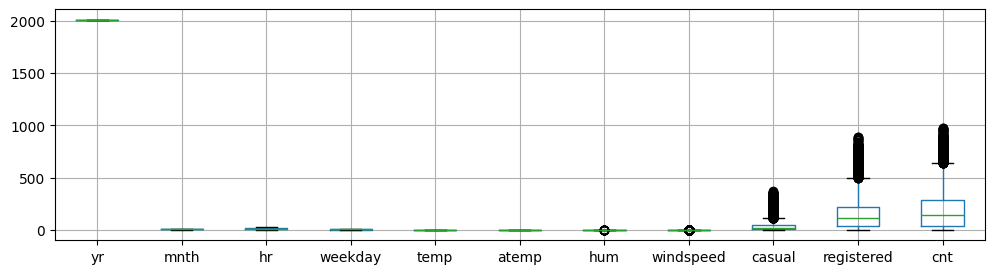

In [92]:
plt.figure(figsize = (12, 3))
df.boxplot()
plt.show()

In [93]:
# Get numerical columns from the DataFrame based on int64 and float64 data types
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Print the numerical columns
print(numerical_columns)

Index(['yr', 'mnth', 'hr', 'weekday', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')


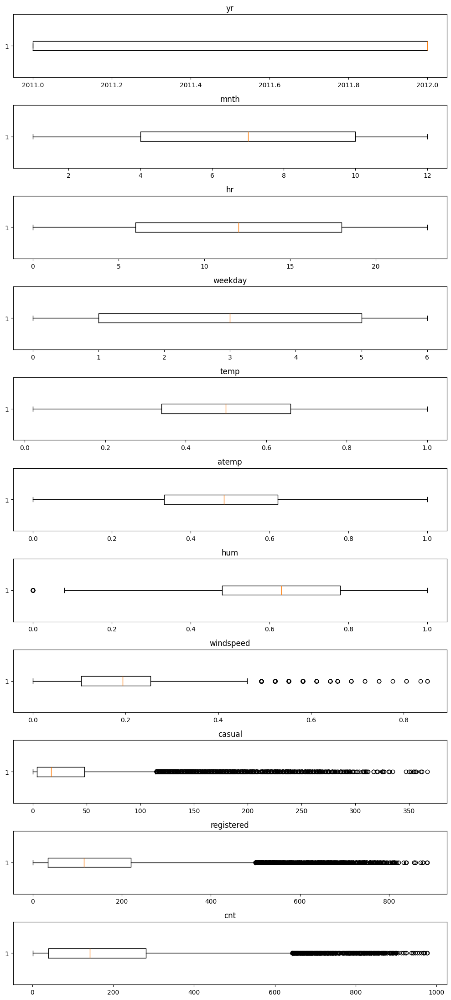

In [94]:
# Define the number of rows and columns for subplots
num_row = len(numerical_columns)

# Create subplots with a horizontal orientation
fig, axes = plt.subplots(num_row, 1, figsize = (10, 2 * num_row))

# Iterate over numerical columns and plot boxplots
for i, col in enumerate(numerical_columns):
    ax = axes[i]
    ax.boxplot(df[col], vert = False)
    ax.set_title(col)

# Adjust layout
plt.tight_layout()
plt.show()


__Note:__

so, when it comes to outliers, we have following options:
1. remove them; we might remove it for humidity col, but other columns it would not be a good options as we have larger number of outliers. It will distort the data.
2. Imputation or capping
3. Transformation: log or square root transformation
4. Not doing anything, and using robust model instead

__Possible transformations:__

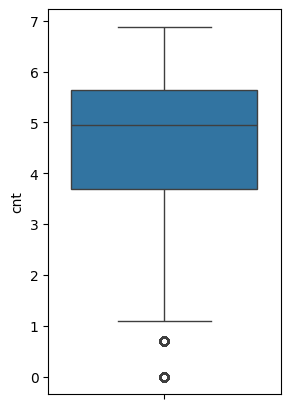

In [95]:
plt.figure(figsize = (3,5))
sns.boxplot(np.log(df['cnt']))
plt.show()

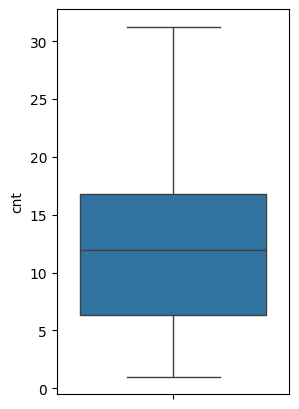

In [96]:
plt.figure(figsize = (3,5))
sns.boxplot(np.sqrt(df['cnt']))
plt.show()

C:\Users\LENOVO\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:644: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs2, **kwargs)


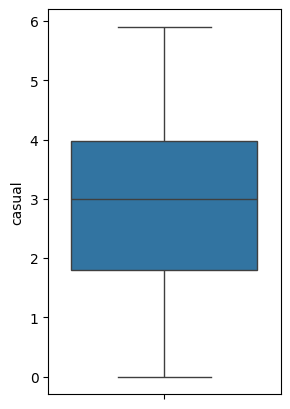

In [97]:
plt.figure(figsize = (3,5))
sns.boxplot(np.log(df['casual']))
plt.show()

C:\Users\LENOVO\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:644: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs2, **kwargs)


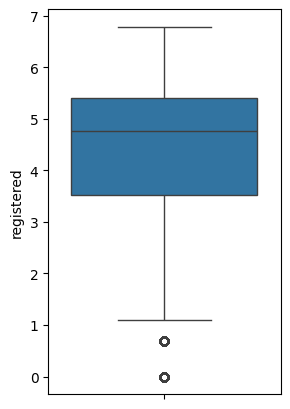

In [98]:
plt.figure(figsize = (3,5))
sns.boxplot(np.log(df['registered']))
plt.show()

__Conclusion:__

Instead of removing or imputing, we'd perfer to use transformation. 

But, 
Can we use different set of transformations, for the different columns? Like log transformation for one column and square root transformation for another.

Also, for column like windspeed, which is already normalized during the data building phase, can it be transformed again. Won't that alter the data too much? 


And how to deal with the normalized values of temp in the dataset? Because we didn't normalized it, so we also dont have the means to transform it back (we'd at least need the actual minimum and maximum temperature). Also, the client or stakeholder would prefer to have data in it's normal value. So we'd be needing the minimum and the maximum temperature for that.

# Data Visualization

In [99]:
df.set_index('date', drop = True, inplace = True)

In [100]:
df.columns

Index(['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual',
       'registered', 'cnt'],
      dtype='object')

In [101]:
df

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
date,,,,,,,,,,,,,,,
2011-01-01,spring,2011,1,0,No,6,No work,Clear,0.240000,0.2879,0.810000,0.0000,3,13,16
2011-01-01,spring,2011,1,1,No,6,No work,Clear,0.220000,0.2727,0.800000,0.0000,8,32,40
2011-01-01,spring,2011,1,2,No,6,No work,Clear,0.220000,0.2727,0.581197,0.0000,5,27,32
2011-01-01,spring,2011,1,3,No,6,No work,Clear,0.240000,0.2879,0.750000,0.0000,3,10,13
2011-01-01,spring,2011,1,4,No,6,No work,Clear,0.240000,0.2879,0.750000,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31,spring,2012,12,19,No,1,Working Day,Mist,0.260000,0.2576,0.600000,0.1642,11,108,119
2012-12-31,spring,2012,12,20,No,1,Working Day,Mist,0.260000,0.2576,0.600000,0.1642,8,81,89
2012-12-31,spring,2012,12,21,No,1,Working Day,Clear,0.299225,0.2576,0.600000,0.1642,7,83,90


## a. Line Plots

In [102]:
# Separate numeric and categorical columns
numeric_columns = df.select_dtypes(include=['number'])
categorical_columns = df.select_dtypes(include=['object', 'category'])

In [103]:
numeric_columns

,yr,mnth,hr,weekday,temp,atemp,hum,windspeed,casual,registered,cnt
date,,,,,,,,,,,
2011-01-01,2011,1,0,6,0.240000,0.2879,0.810000,0.0000,3,13,16
2011-01-01,2011,1,1,6,0.220000,0.2727,0.800000,0.0000,8,32,40
2011-01-01,2011,1,2,6,0.220000,0.2727,0.581197,0.0000,5,27,32
2011-01-01,2011,1,3,6,0.240000,0.2879,0.750000,0.0000,3,10,13
2011-01-01,2011,1,4,6,0.240000,0.2879,0.750000,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31,2012,12,19,1,0.260000,0.2576,0.600000,0.1642,11,108,119
2012-12-31,2012,12,20,1,0.260000,0.2576,0.600000,0.1642,8,81,89
2012-12-31,2012,12,21,1,0.299225,0.2576,0.600000,0.1642,7,83,90


In [104]:
categorical_columns

,season,holiday,workingday,weathersit
date,,,,
2011-01-01,spring,No,No work,Clear
2011-01-01,spring,No,No work,Clear
2011-01-01,spring,No,No work,Clear
2011-01-01,spring,No,No work,Clear
2011-01-01,spring,No,No work,Clear
...,...,...,...,...
2012-12-31,spring,No,Working Day,Mist
2012-12-31,spring,No,Working Day,Mist
2012-12-31,spring,No,Working Day,Clear


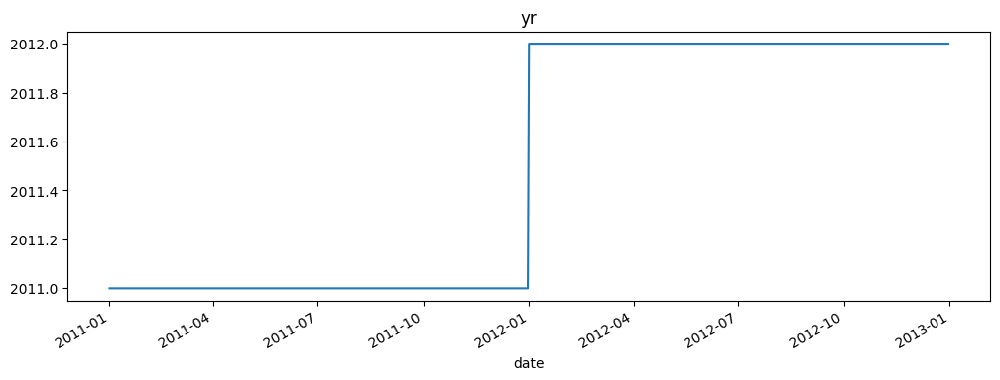

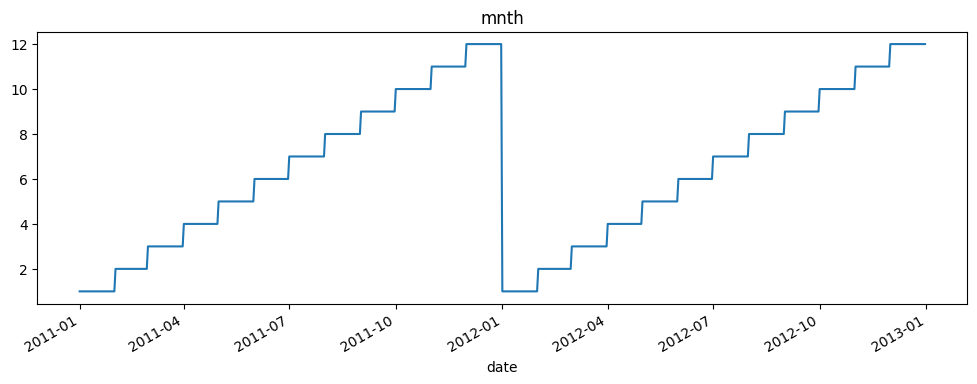

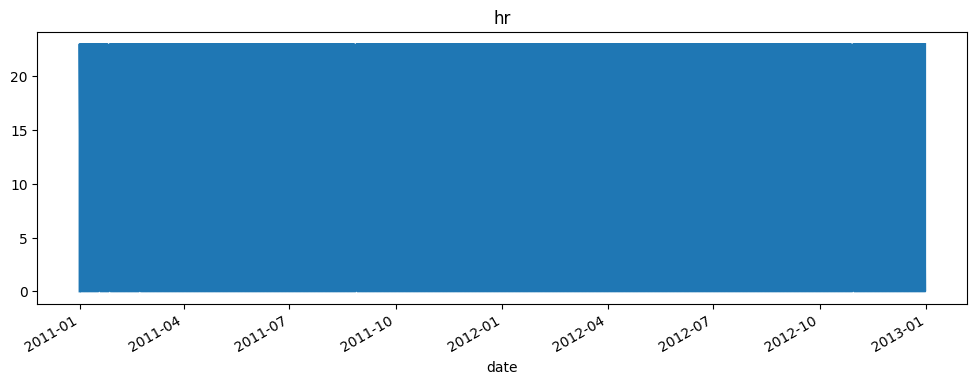

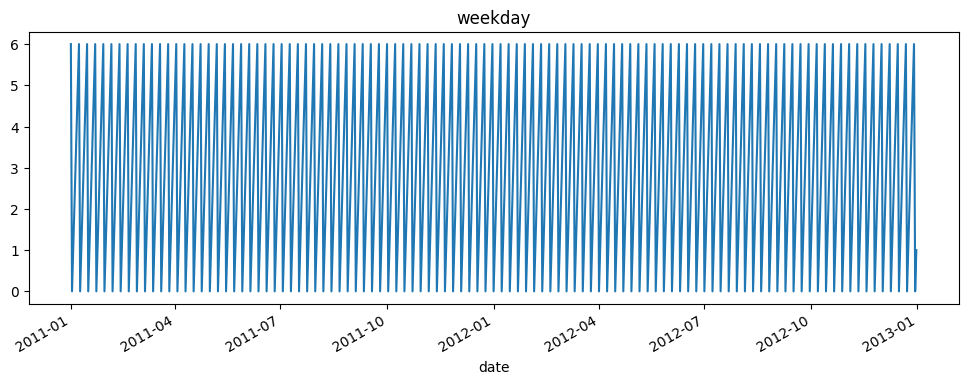

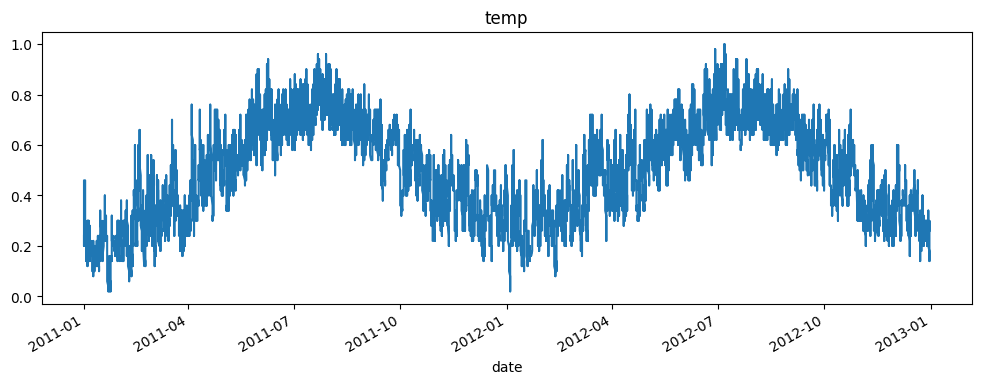

...

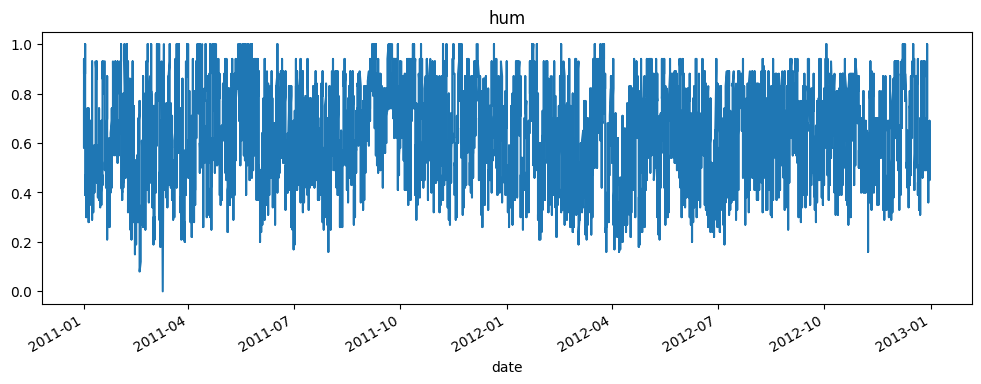

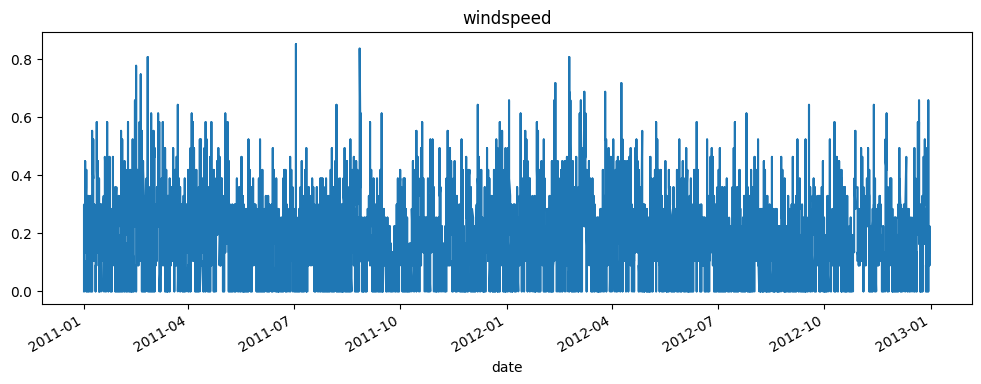

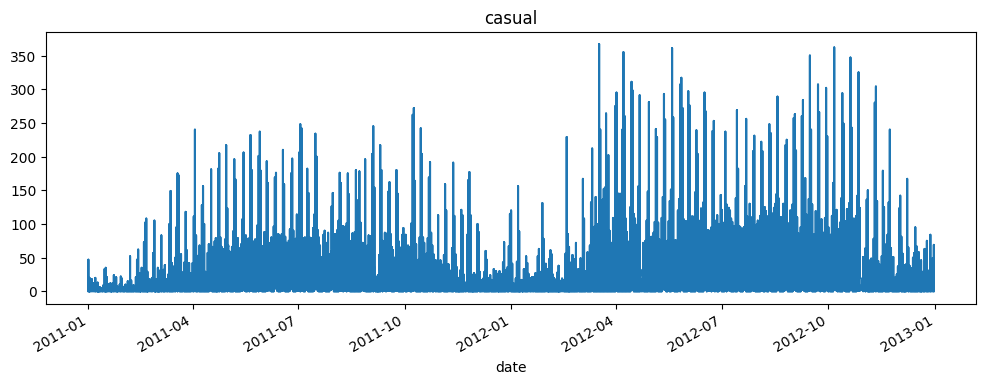

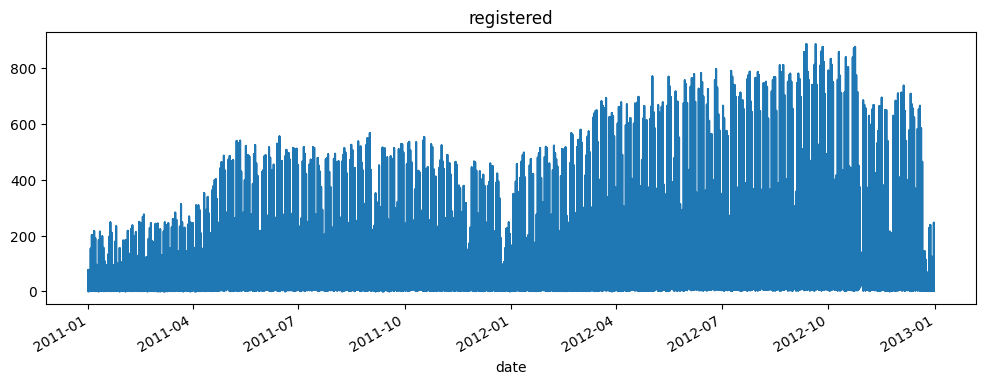

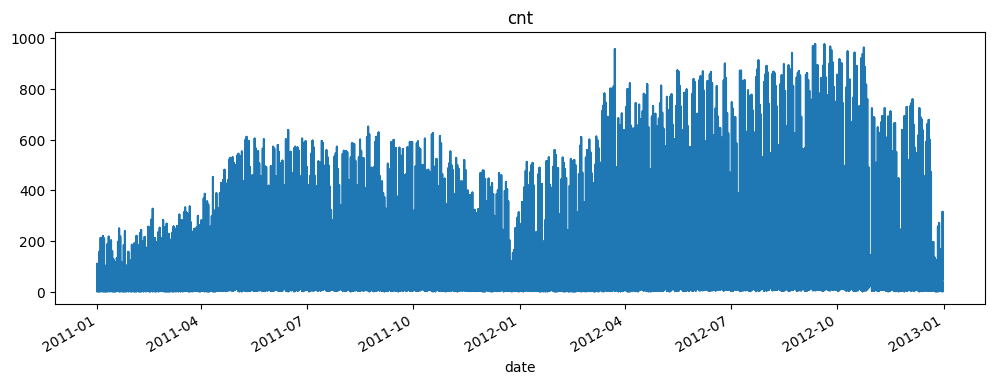

In [105]:
for i in numeric_columns.columns:
    numeric_columns[i].plot(figsize = (12,4))
    plt.title(i)
    plt.show()

### Visualize the trend of bike counts over time

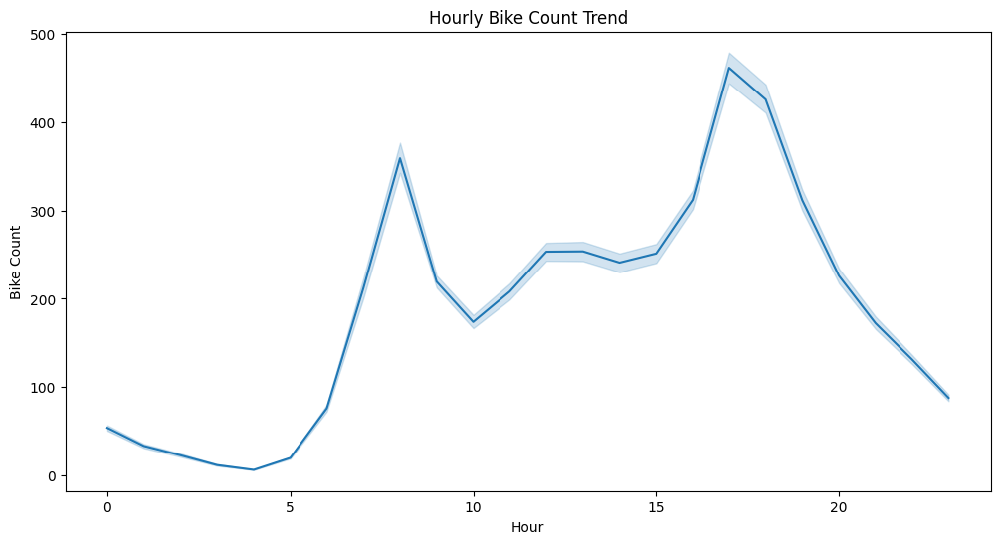

In [106]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='hr', y='cnt', data=df)
plt.title('Hourly Bike Count Trend')
plt.xlabel('Hour')
plt.ylabel('Bike Count')
plt.show()

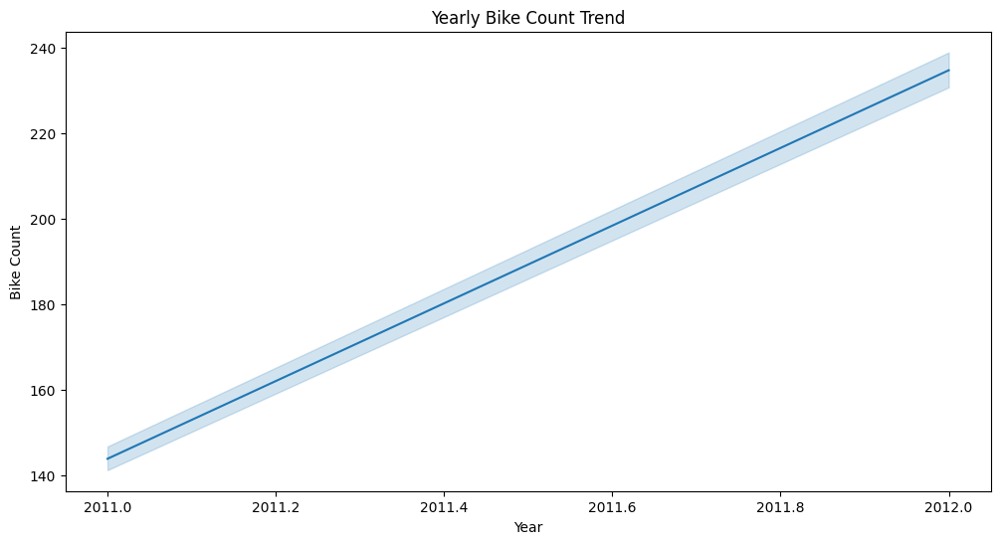

In [107]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='yr', y='cnt', data=df)
plt.title('Yearly Bike Count Trend')
plt.xlabel('Year')
plt.ylabel('Bike Count')
plt.show()

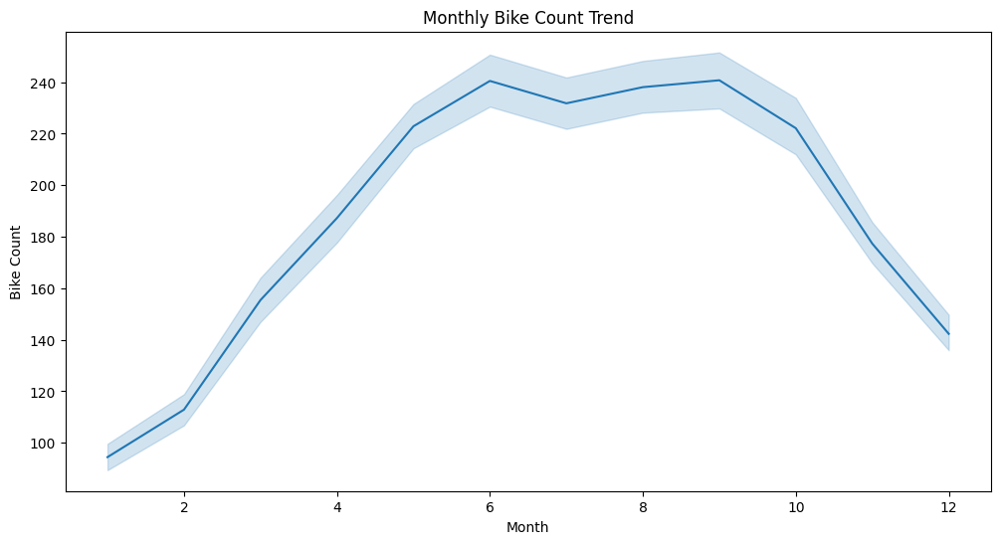

In [108]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='mnth', y='cnt', data=df)
plt.title('Monthly Bike Count Trend')
plt.xlabel('Month')
plt.ylabel('Bike Count')
plt.show()

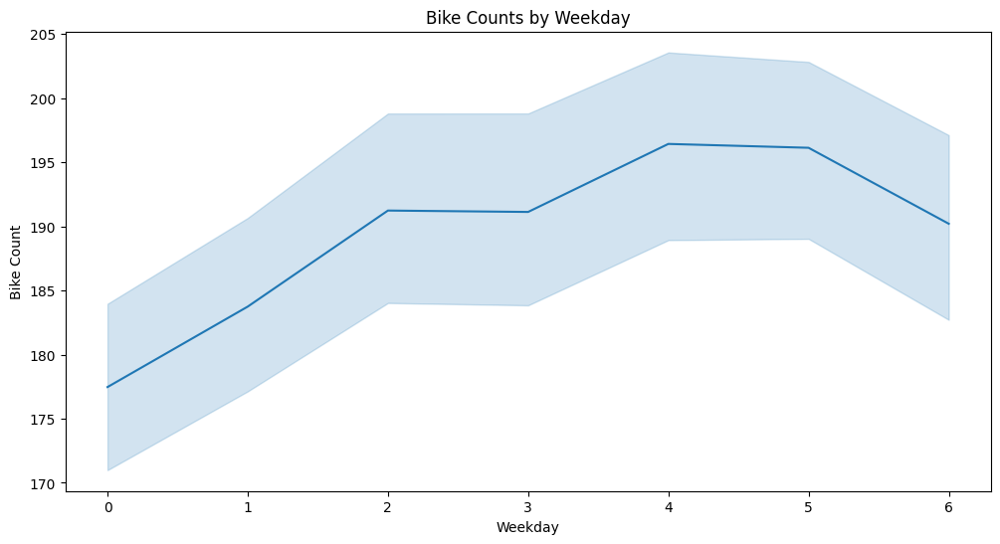

In [109]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='weekday', y='cnt', data=df)
plt.title('Bike Counts by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Bike Count')
plt.show()

### Heatmap using pivot table

In [110]:
# Create a pivot table with months as rows, hours as columns, and counts as values
pivot_table = df.pivot_table(index='mnth', columns='hr', values='cnt', aggfunc='sum')

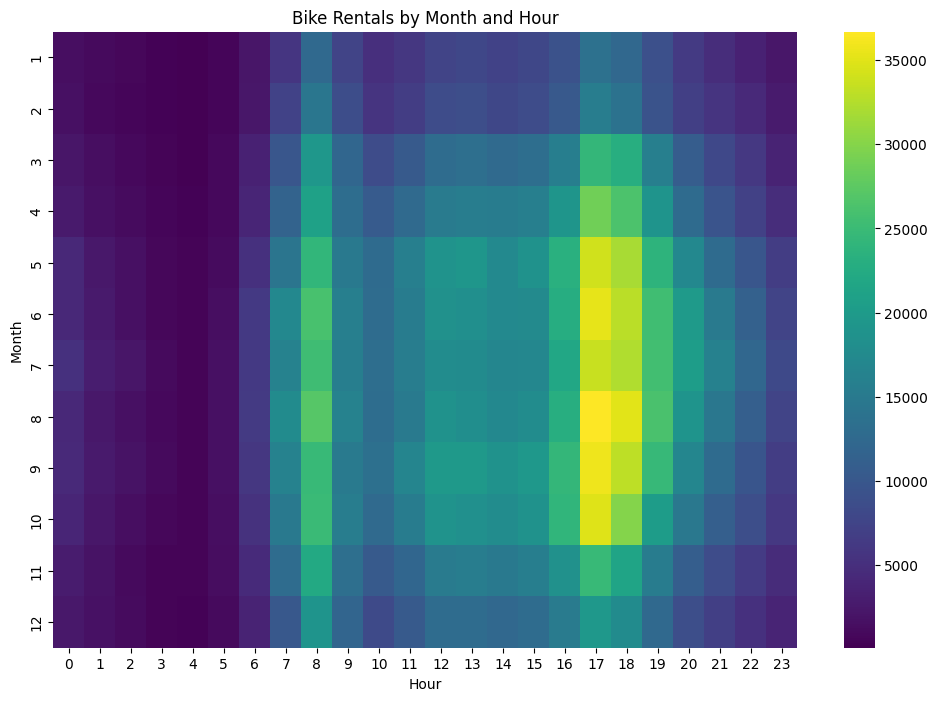

In [111]:
# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis')
plt.title('Bike Rentals by Month and Hour')
plt.xlabel('Hour')
plt.ylabel('Month')
plt.show()

In [112]:
# Create a pivot table with months as rows, hours as columns, and counts as values
pivot_table = df.pivot_table(index='yr', columns='mnth', values='cnt', aggfunc='sum')

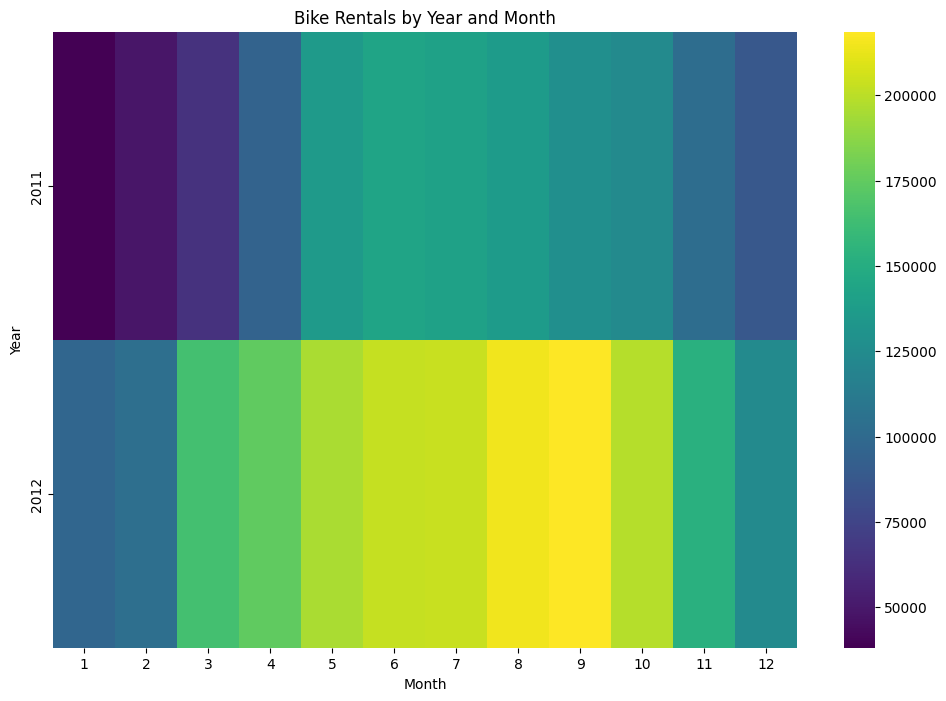

In [113]:
# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis')
plt.title('Bike Rentals by Year and Month')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

### Boxplot for monthly and yearly data

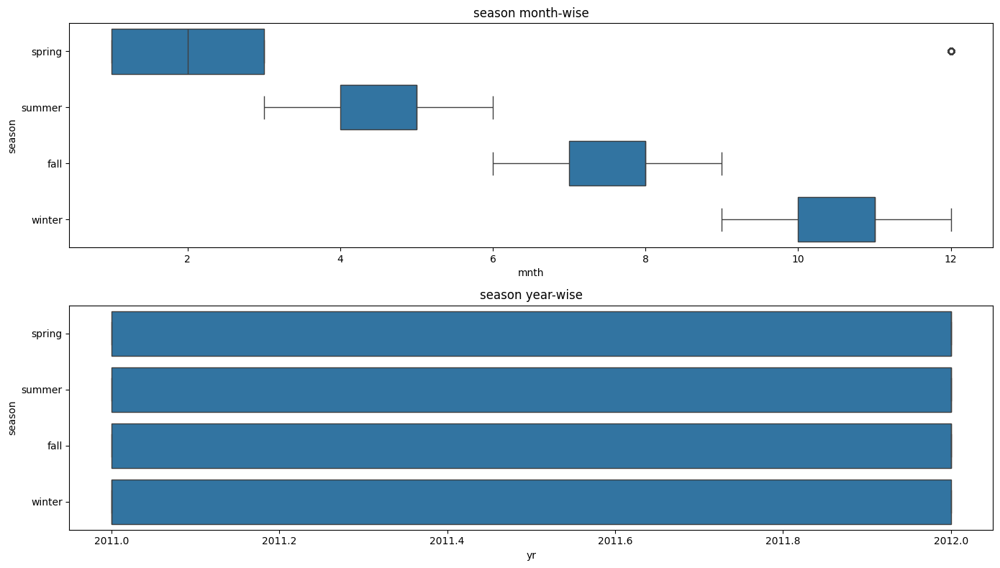

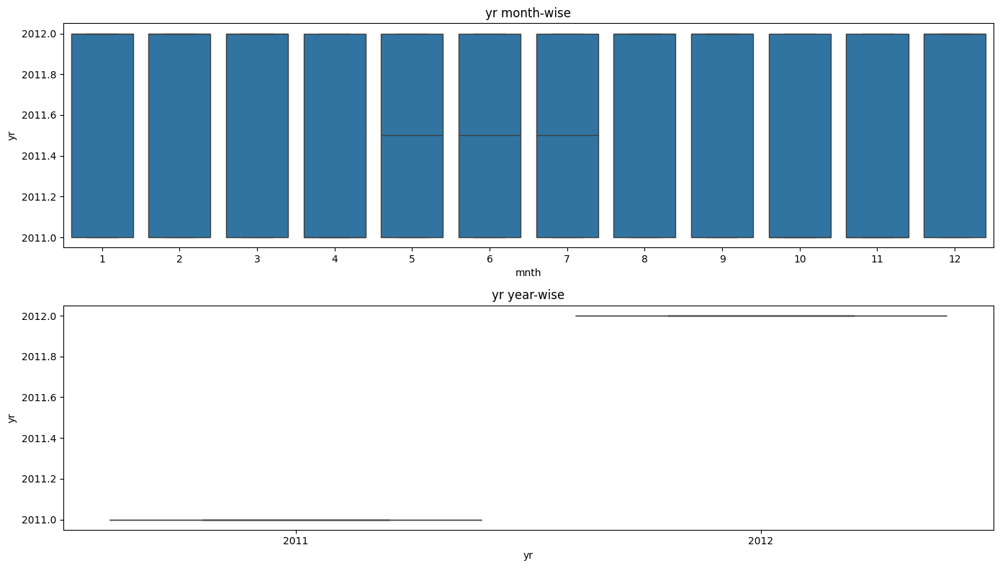

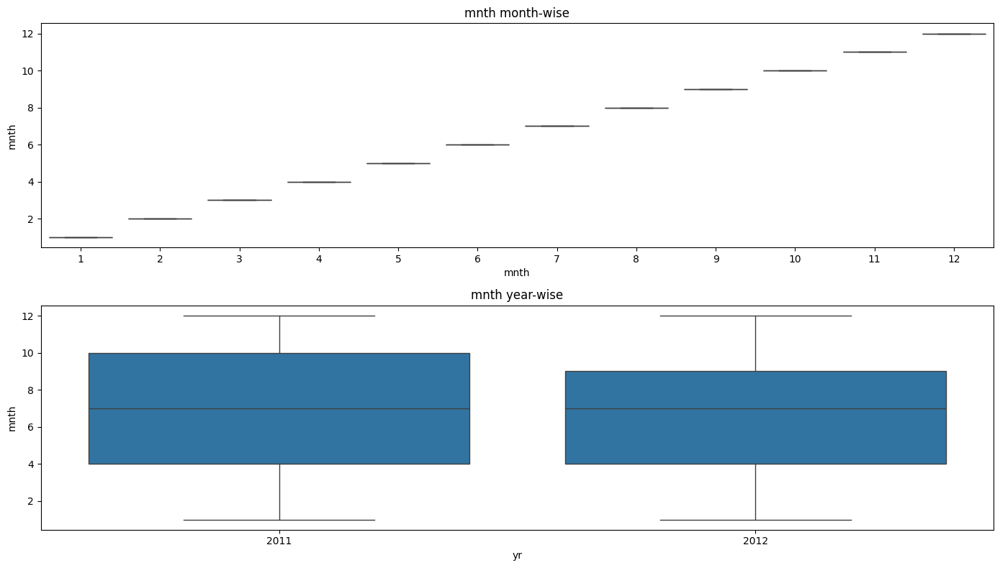

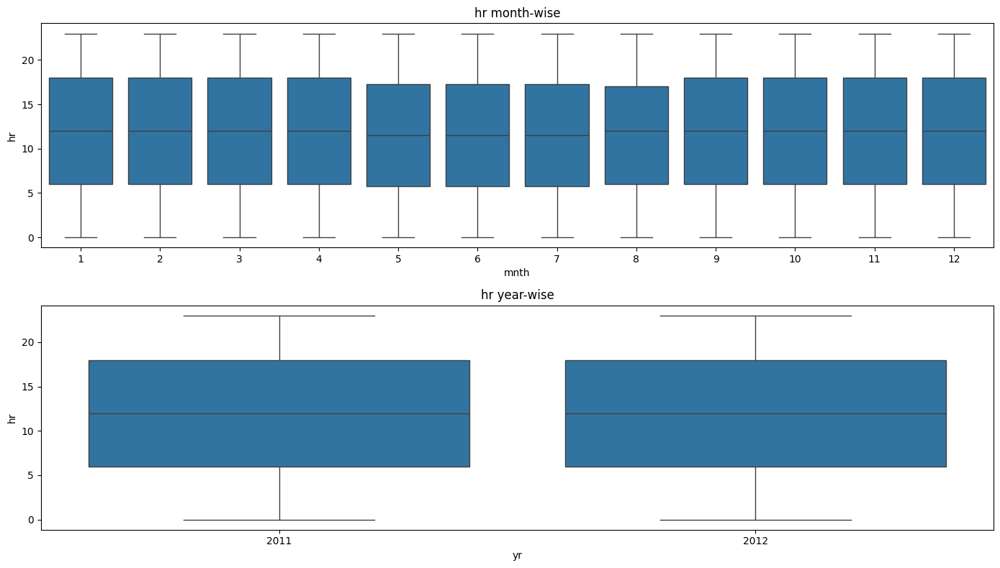

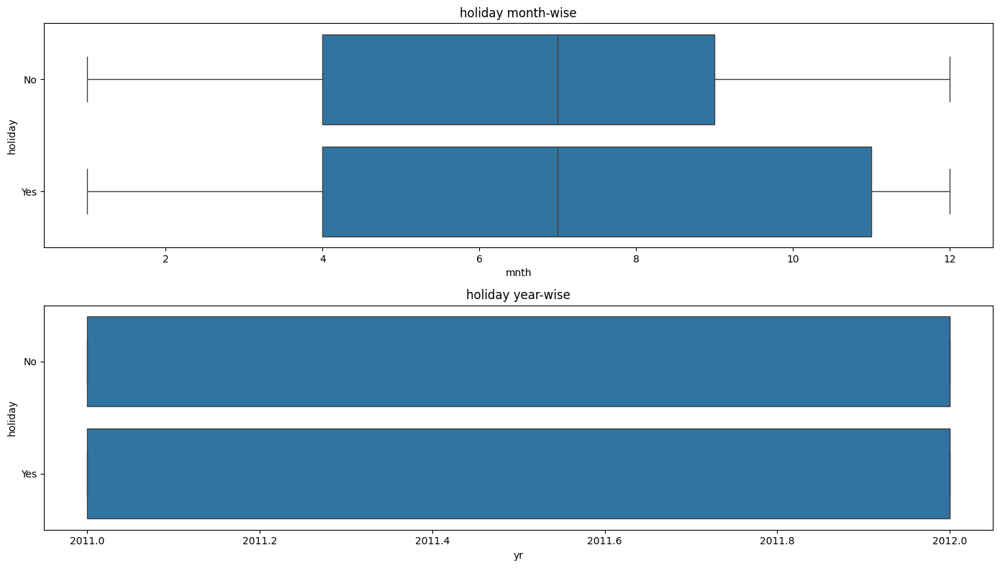

...

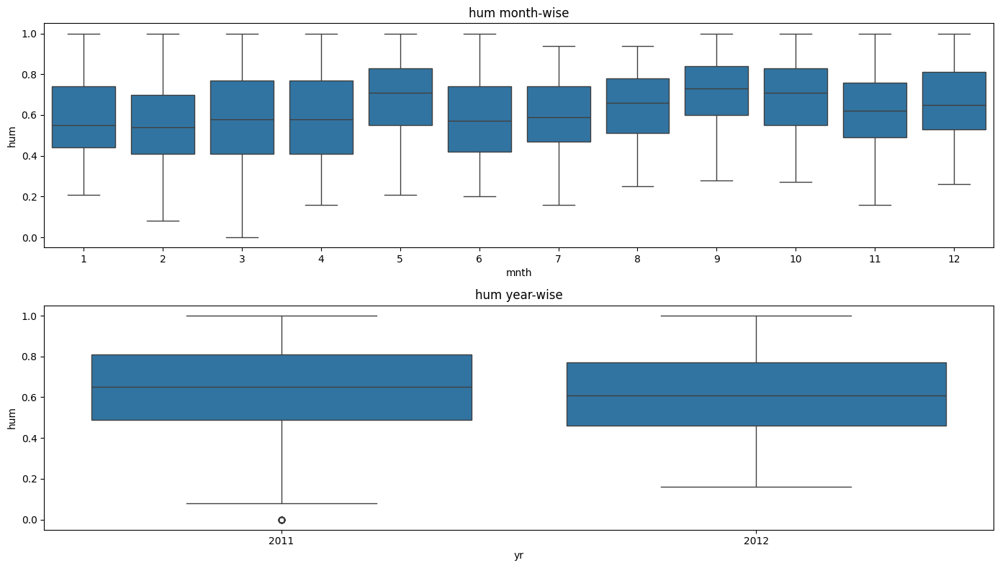

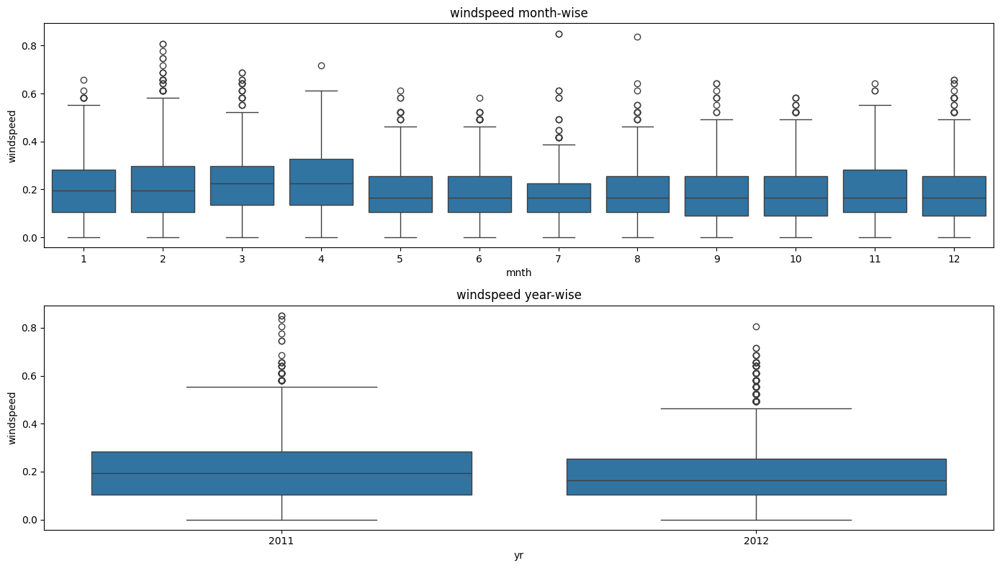

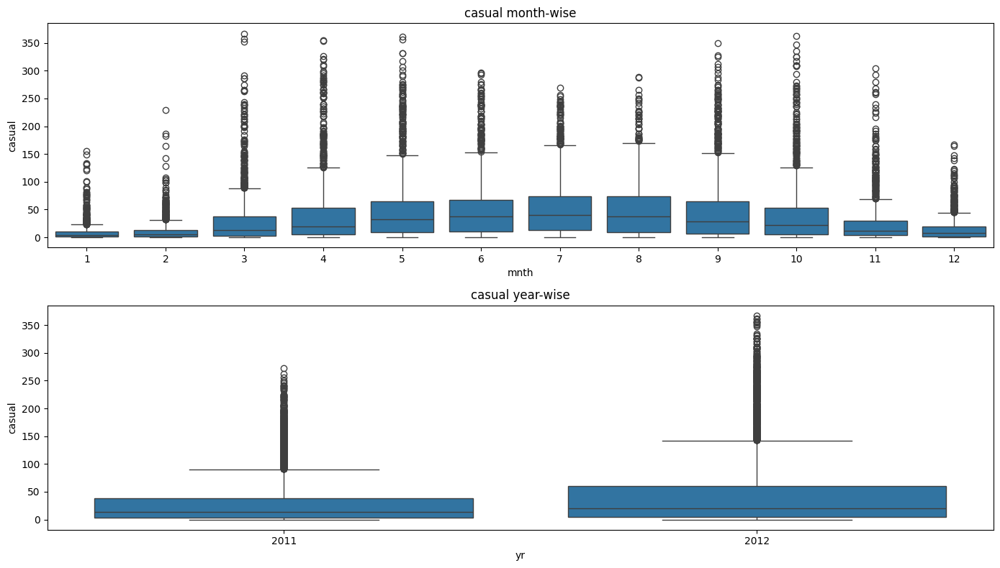

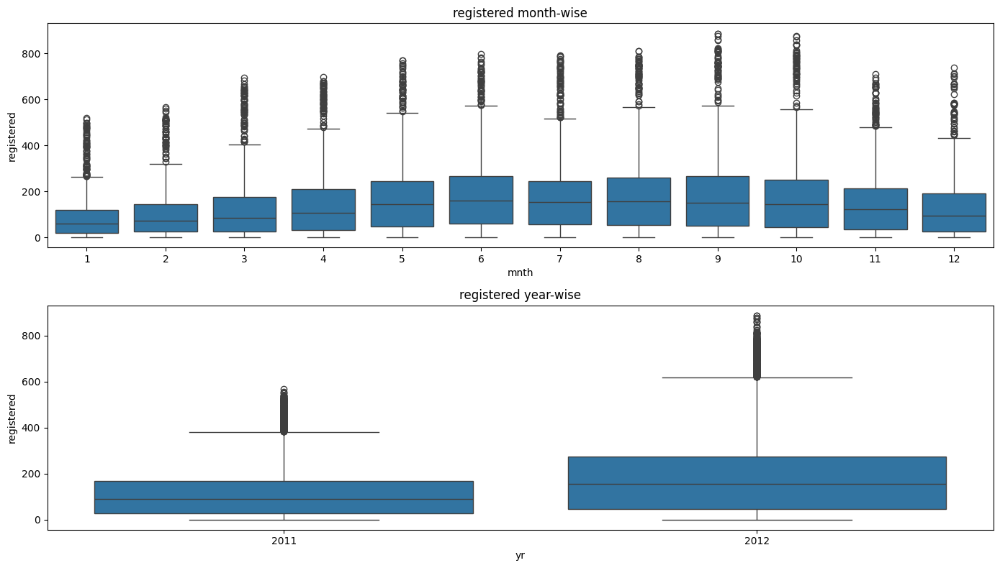

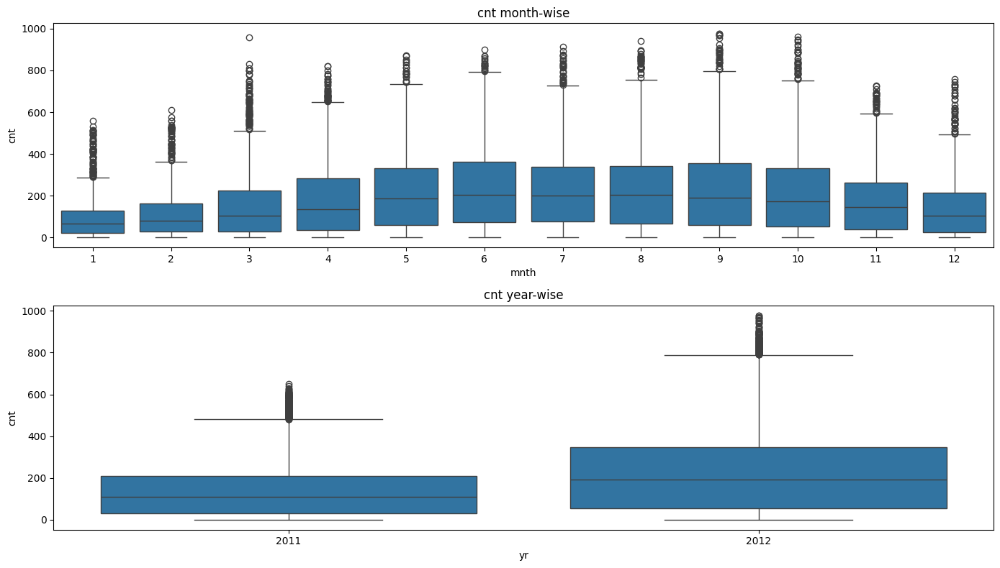

In [114]:
for i in df.columns:
    plt.figure(figsize=(14,8))
    plt.subplot(211)
    sns.boxplot(x="mnth",y=i,data=df)
    plt.title(i+" month-wise")
    plt.subplot(212)
    sns.boxplot(x="yr",y=i,data=df)
    plt.title(i+ " year-wise")
    plt.tight_layout()

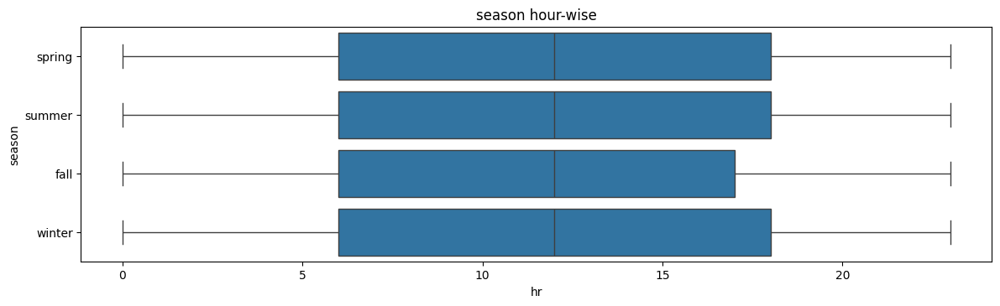

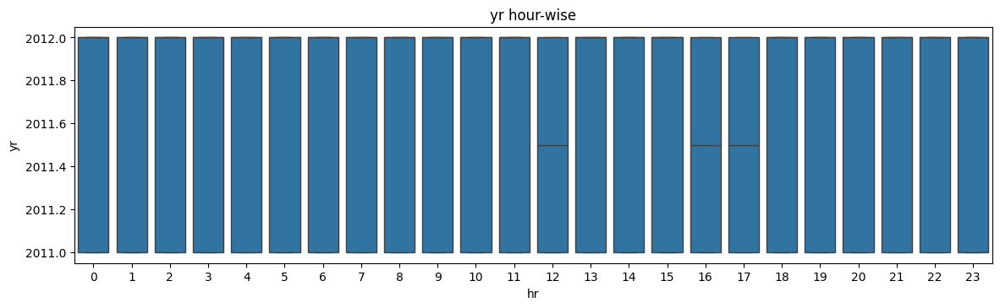

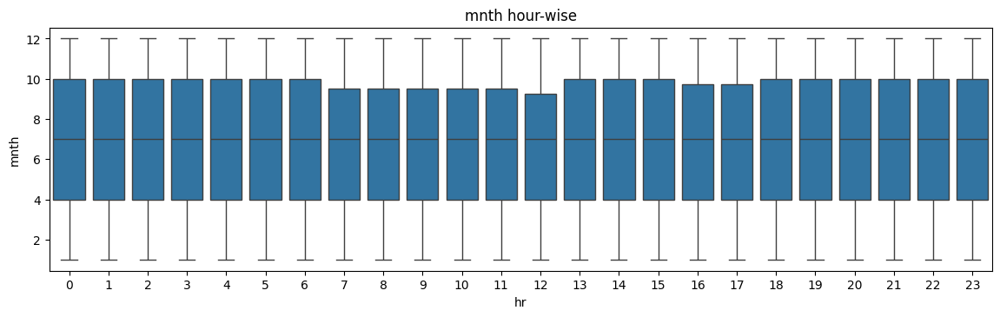

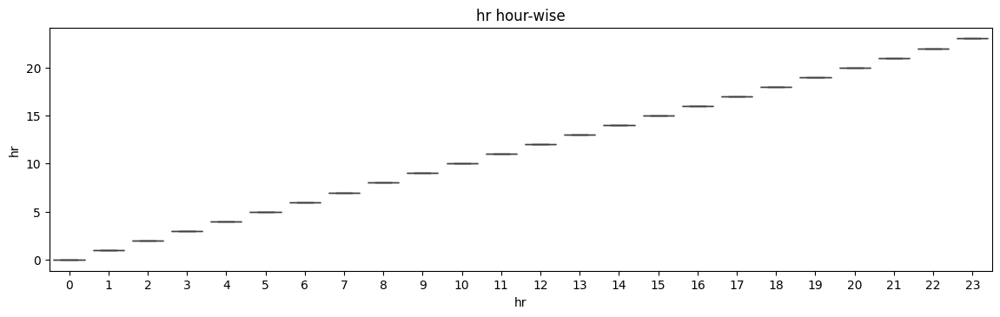

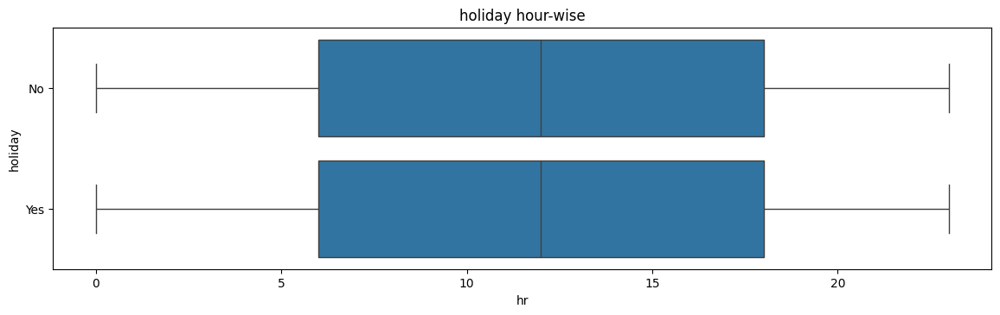

...

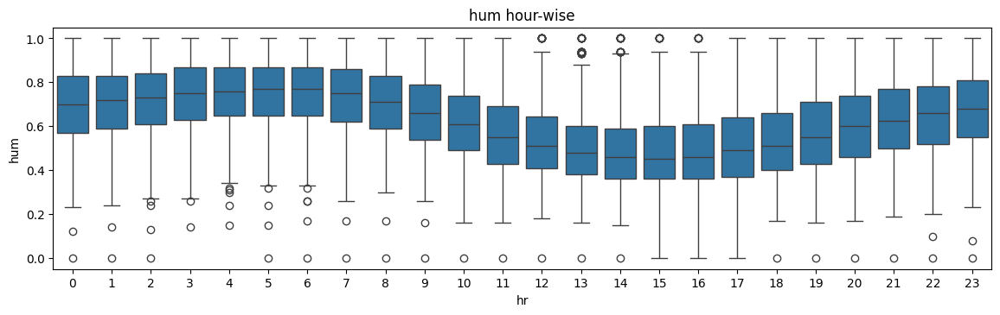

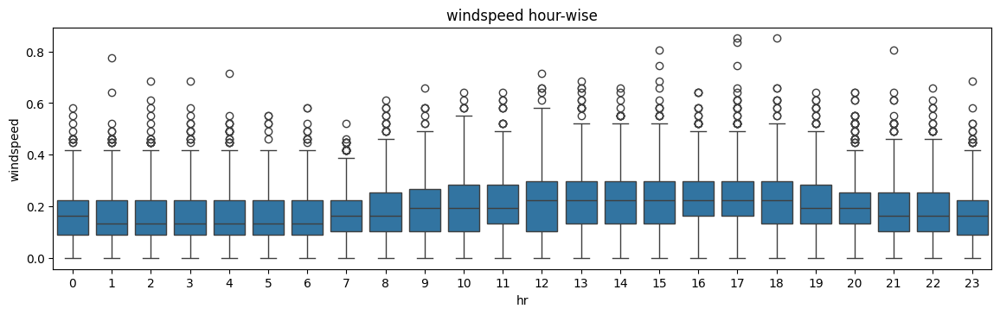

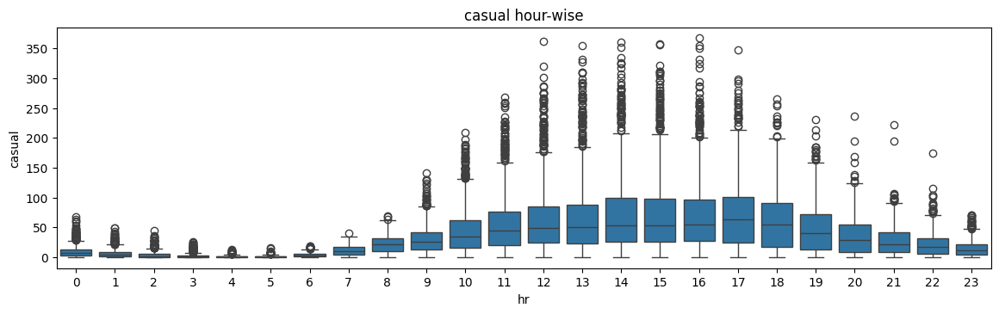

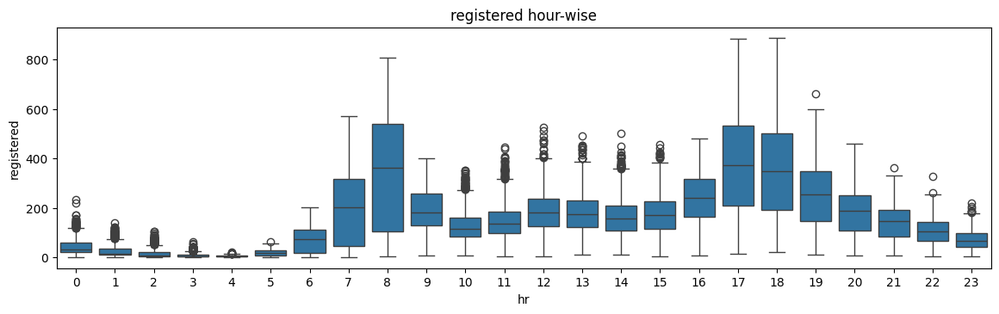

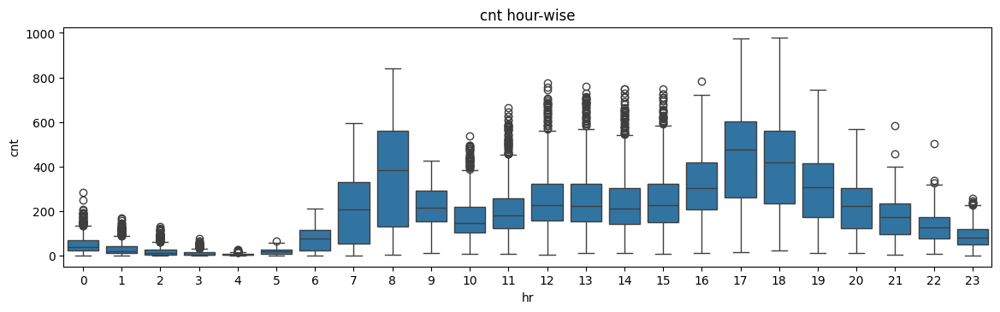

In [115]:
# Boxplot for Hourly data
for i in df.columns:
    plt.figure(figsize=(14,8))
    plt.subplot(211)
    sns.boxplot(x="hr",y=i,data=df)
    plt.title(i+" hour-wise")

### Bar Graphs: Visualize bike counts by year month hour and by weekday.

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_10924\3697816778.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='yr', y='cnt', data=df, ci=None)


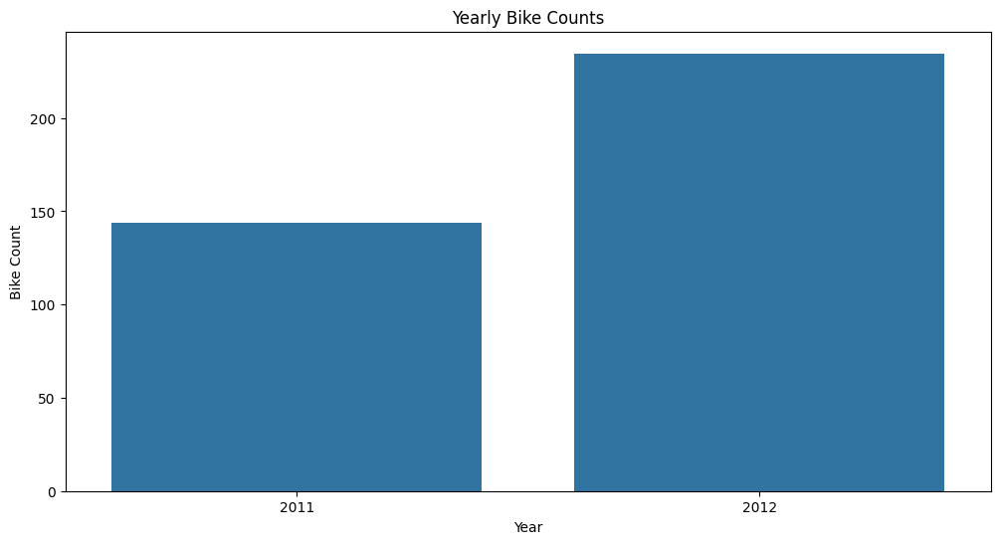

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_10924\3697816778.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='mnth', y='cnt', data=df, ci=None)


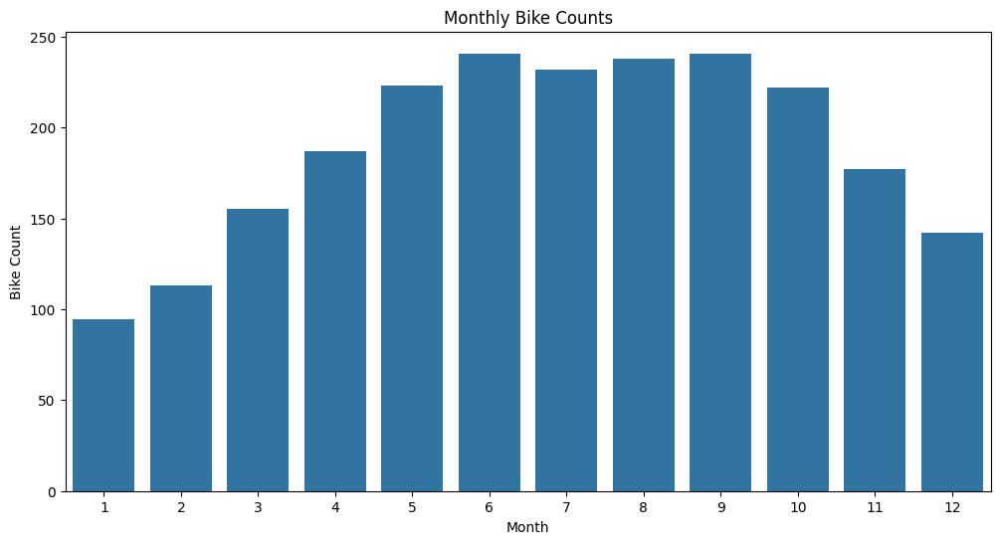

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_10924\3697816778.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='hr', y='cnt', data=df, ci=None)


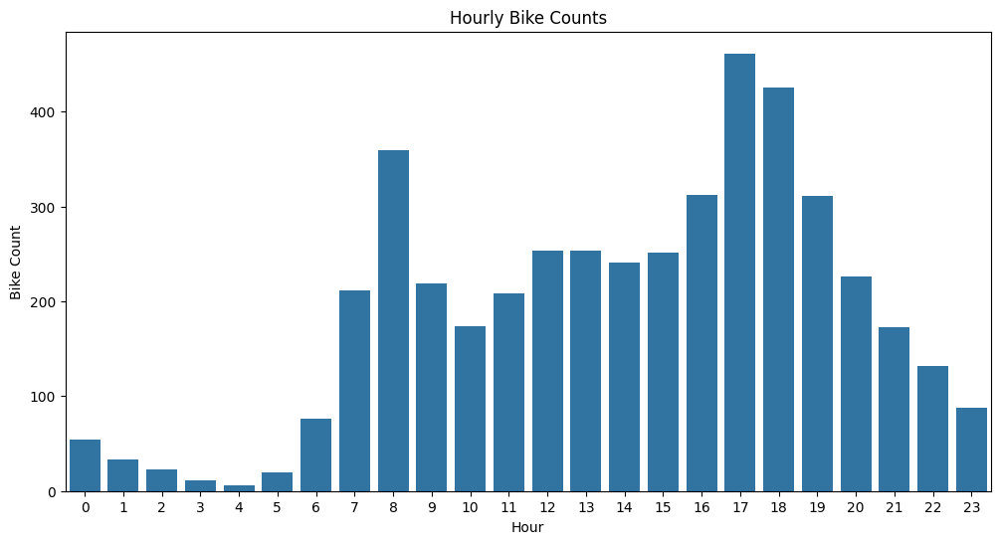

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_10924\3697816778.py:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='weekday', y='cnt', data=df, ci=None)


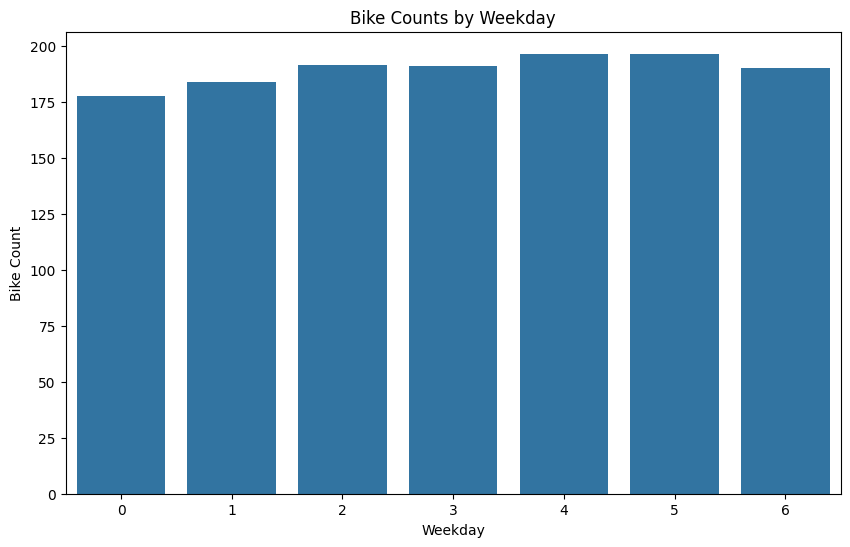

In [116]:
plt.figure(figsize=(12, 6))
sns.barplot(x='yr', y='cnt', data=df, ci=None)
plt.title('Yearly Bike Counts')
plt.xlabel('Year')
plt.ylabel('Bike Count')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='mnth', y='cnt', data=df, ci=None)
plt.title('Monthly Bike Counts')
plt.xlabel('Month')
plt.ylabel('Bike Count')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='hr', y='cnt', data=df, ci=None)
plt.title('Hourly Bike Counts')
plt.xlabel('Hour')
plt.ylabel('Bike Count')
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x='weekday', y='cnt', data=df, ci=None)
plt.title('Bike Counts by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Bike Count')
plt.show()

### Pie Chart: Visualize bike counts by season using a pie chart.

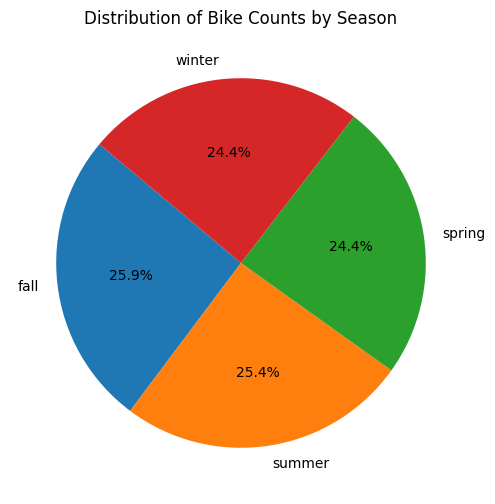

In [117]:
season_counts = df['season'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(season_counts, labels=season_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Bike Counts by Season')
plt.show()

### Histogram for frequency distribution

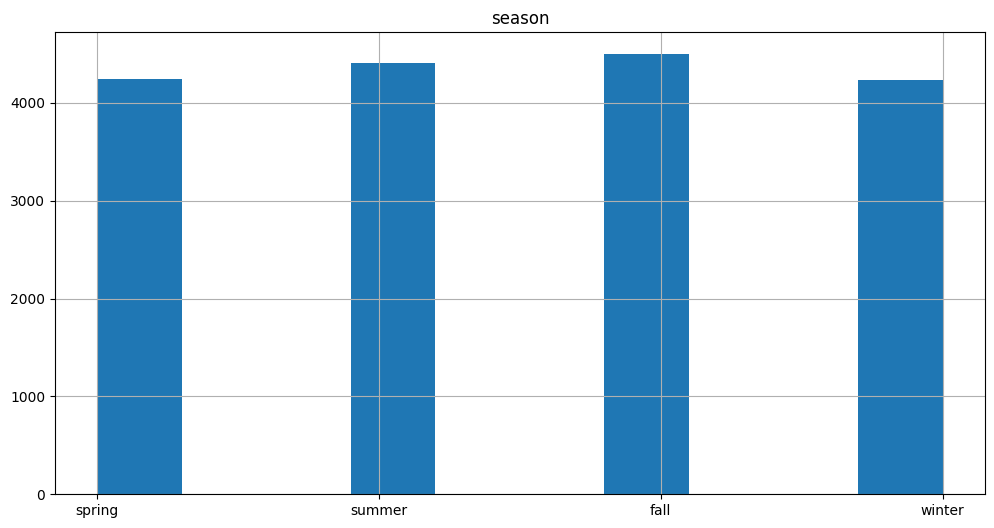

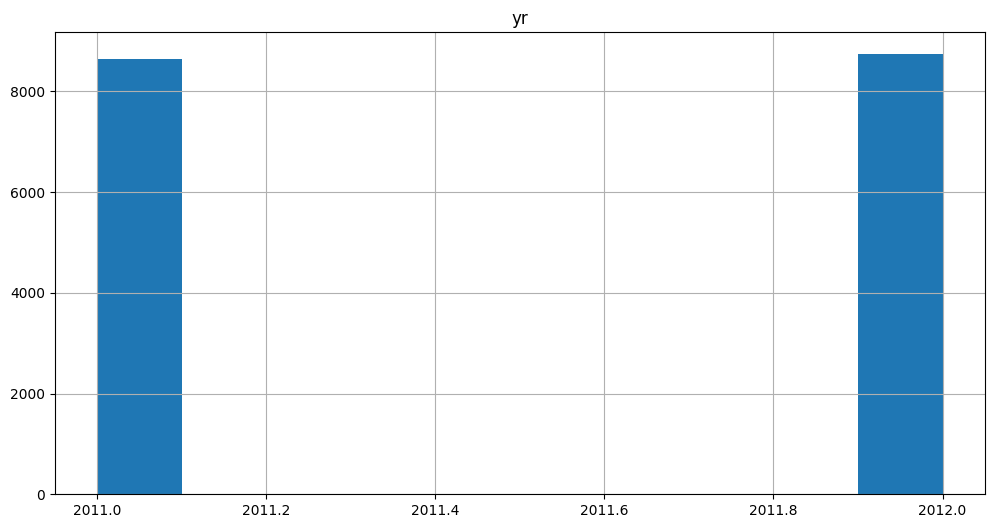

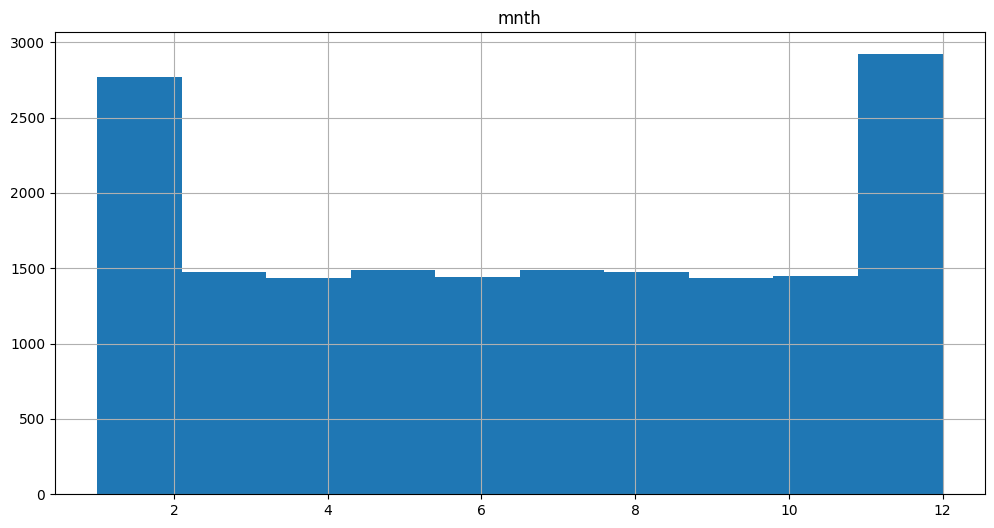

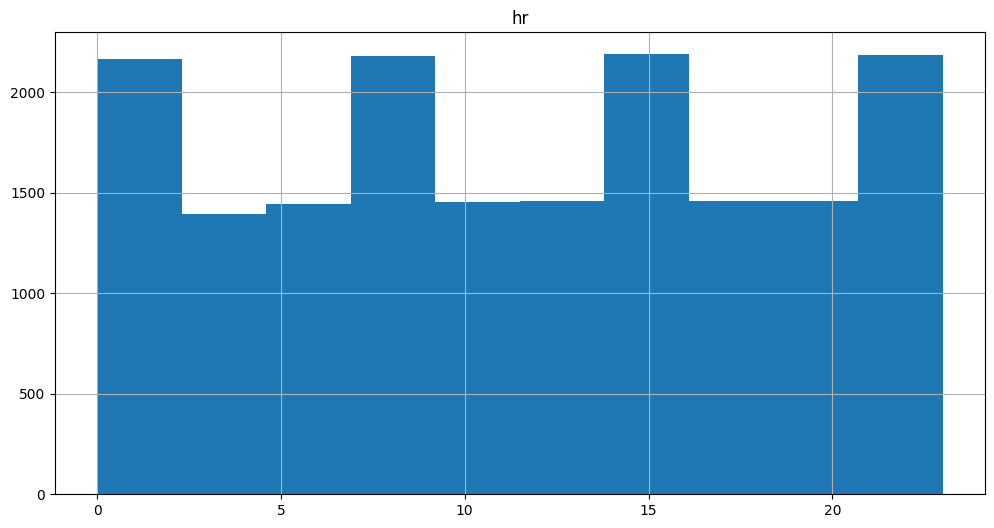

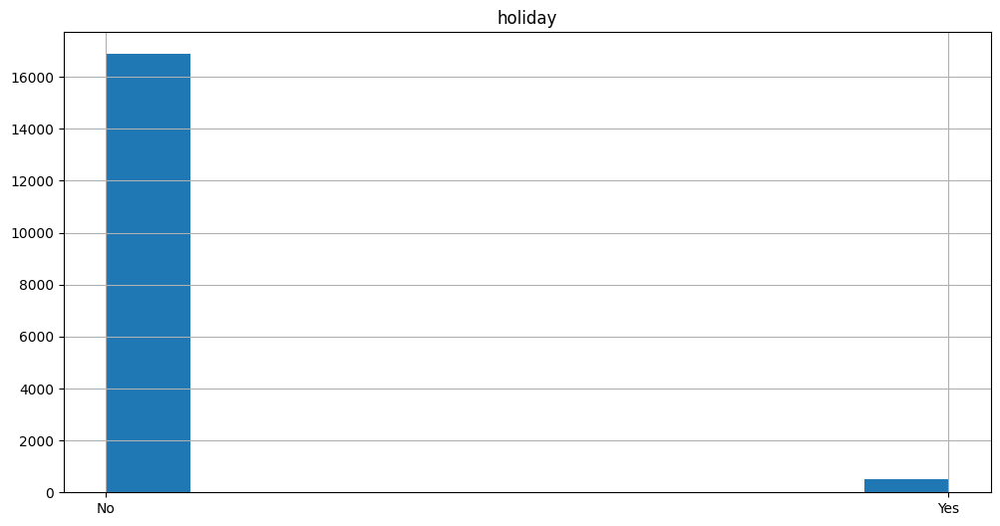

...

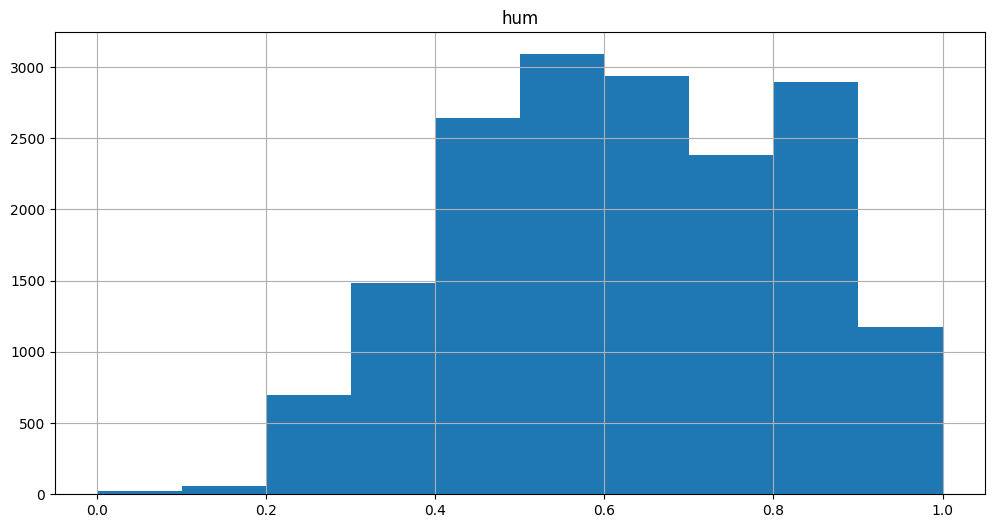

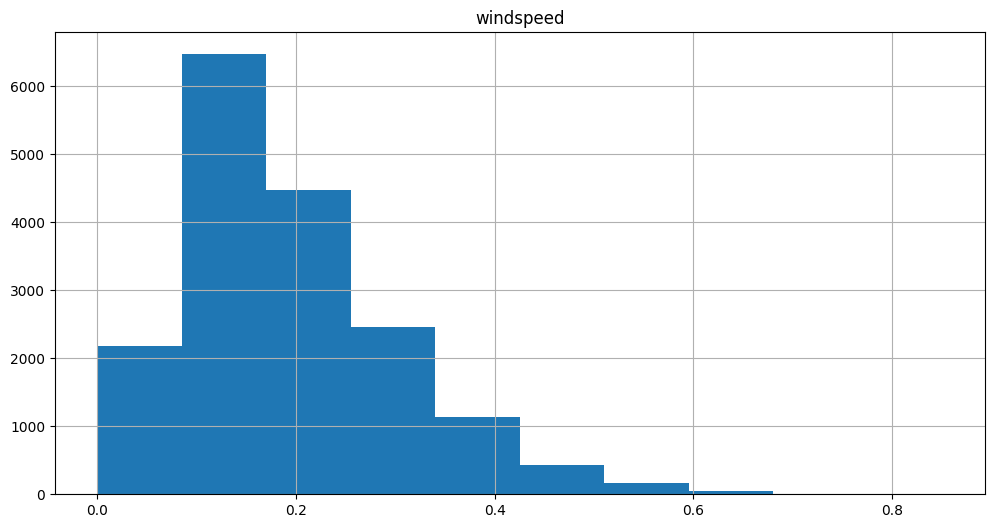

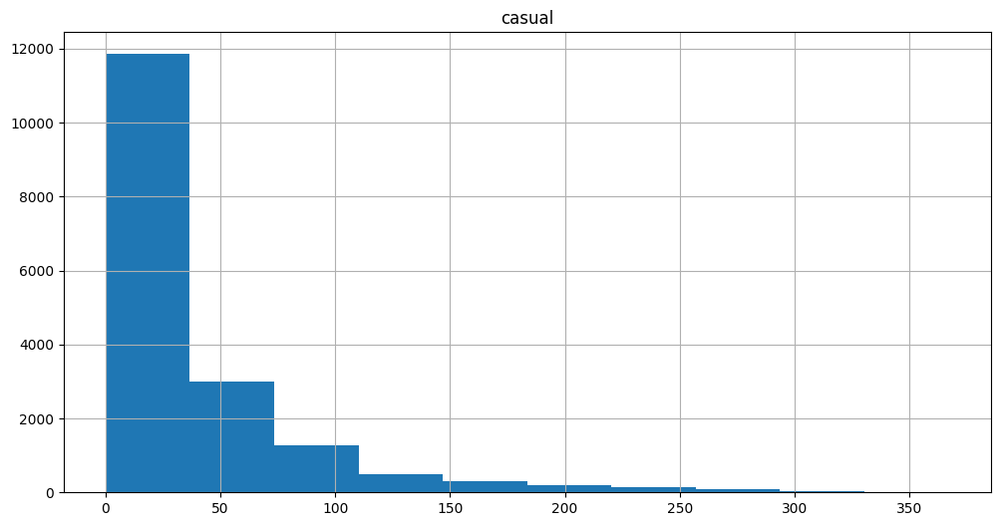

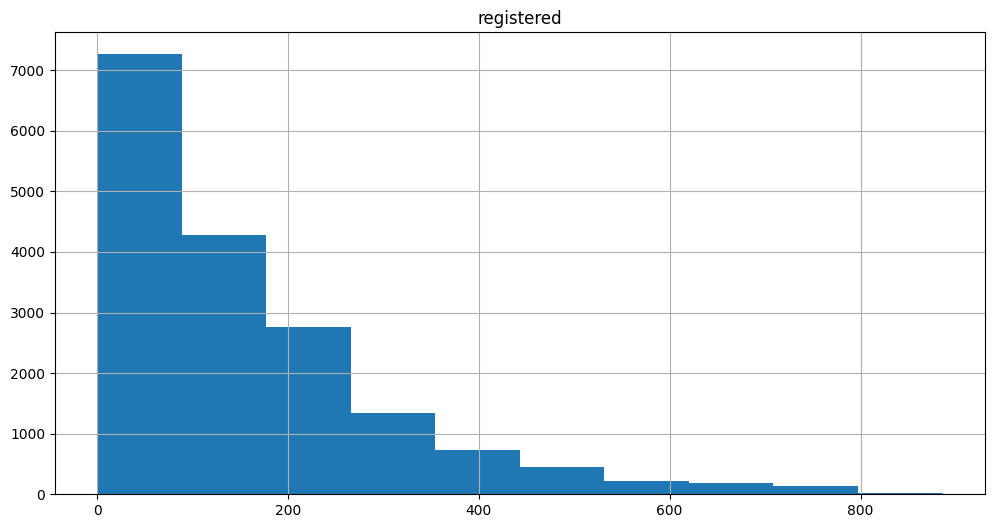

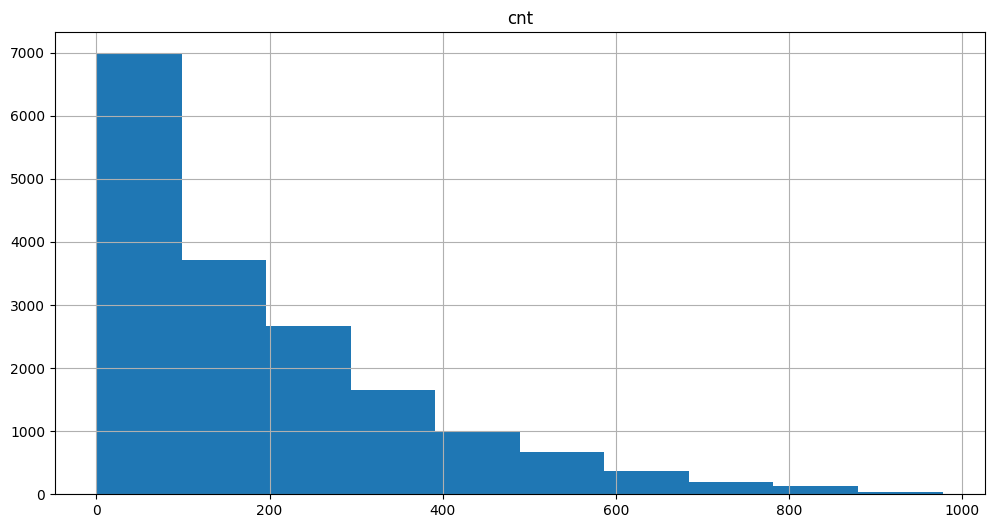

In [118]:
for i in df.columns:
    df[i].hist(figsize = (12,6))
    plt.title(i)
    plt.show()

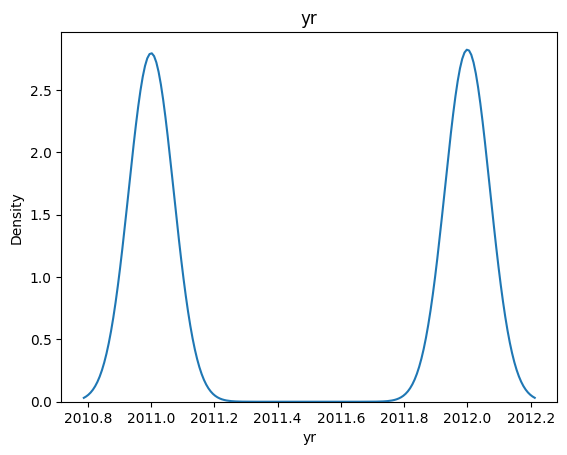

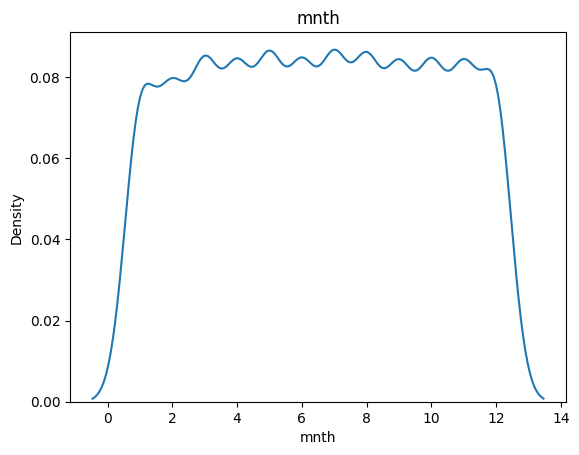

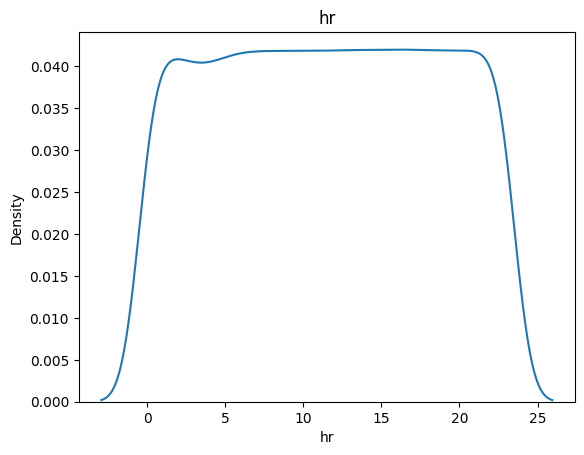

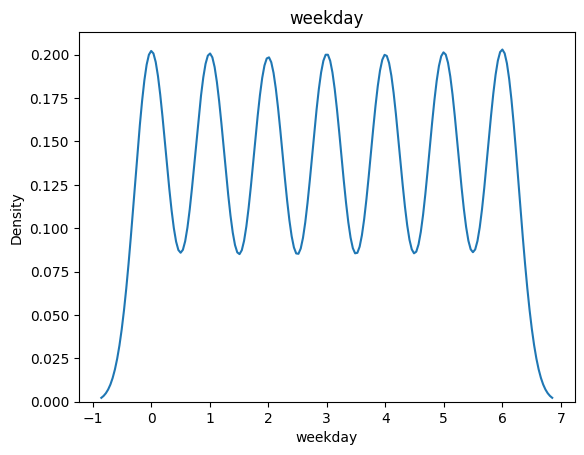

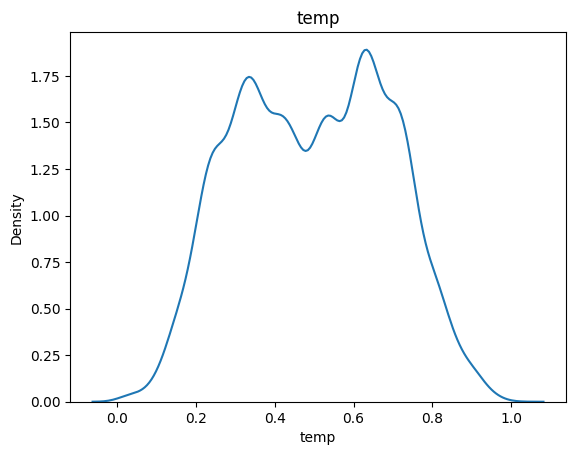

...

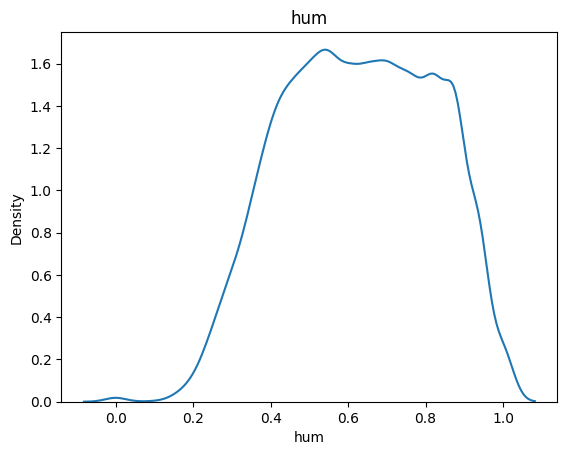

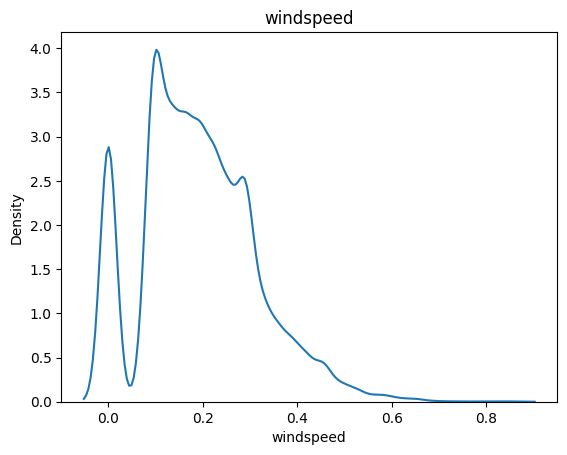

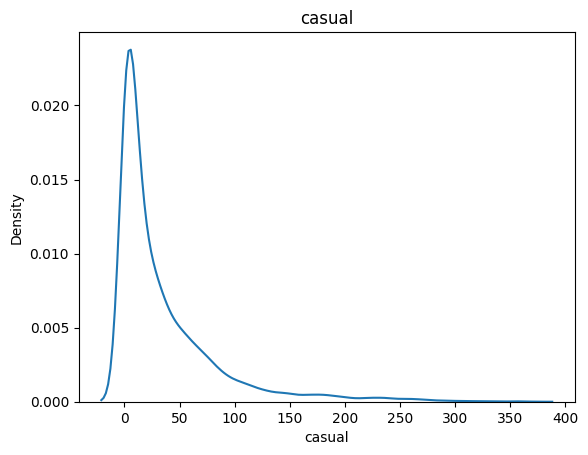

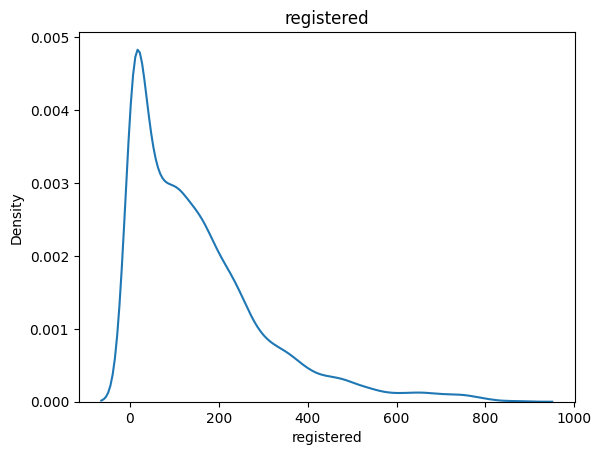

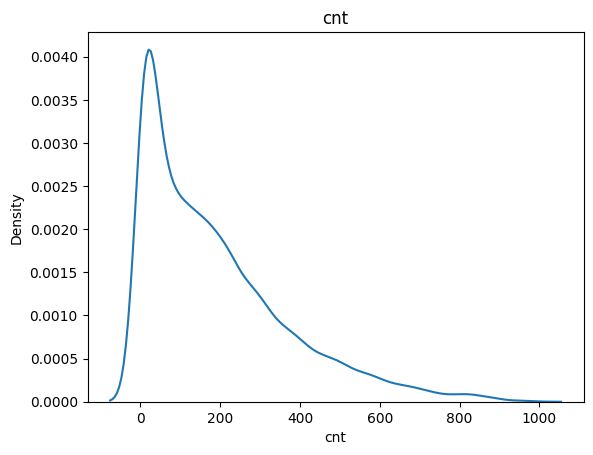

In [119]:
for i in numeric_columns.columns:
    sns.kdeplot(numeric_columns[i])
    plt.title(i)
    plt.show()

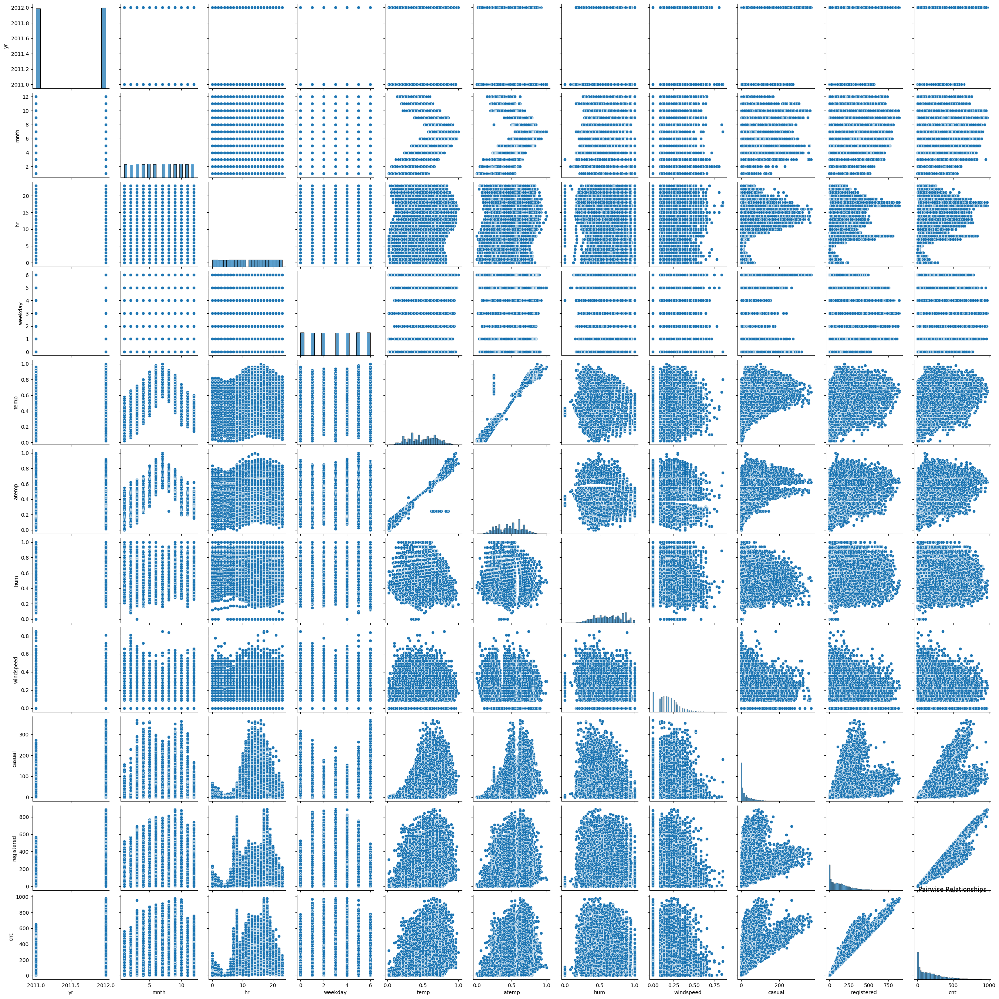

In [120]:
# Pair Plot
sns.pairplot(df)
plt.title('Pairwise Relationships')
plt.show()

### Lag plots: Visualize the relationship between bike counts and its lagged values.

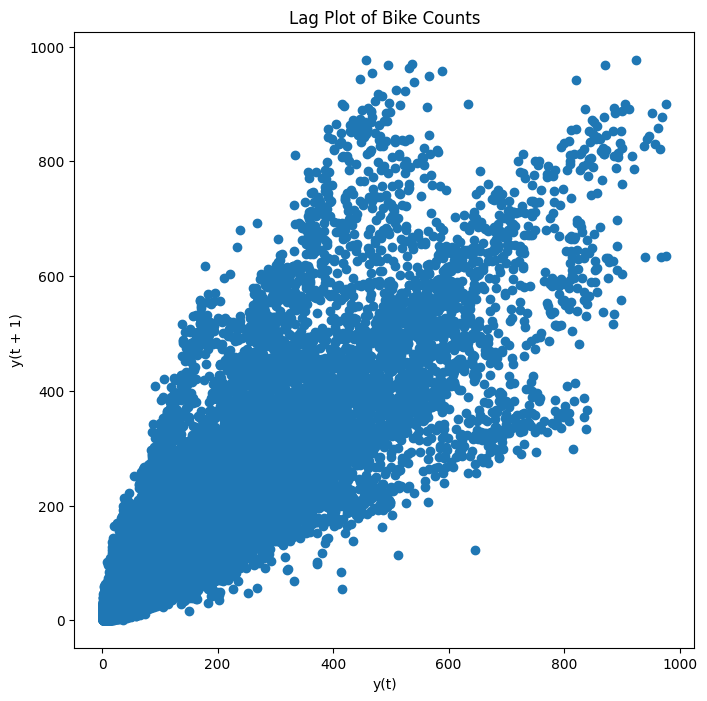

In [121]:
from pandas.plotting import lag_plot

plt.figure(figsize=(8, 8))
lag_plot(df['cnt'])
plt.title('Lag Plot of Bike Counts')
plt.show()

### Monthly distribution of counts

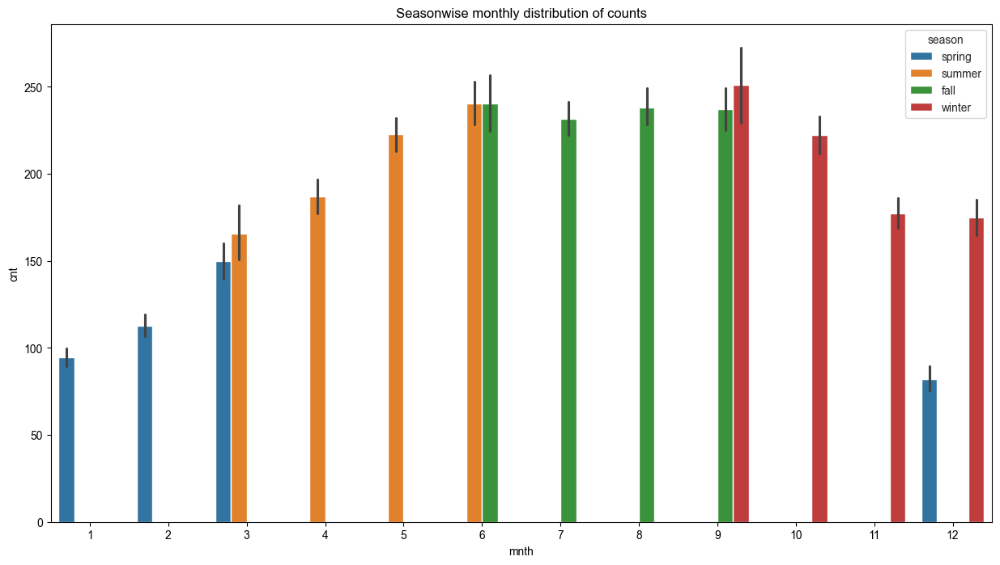

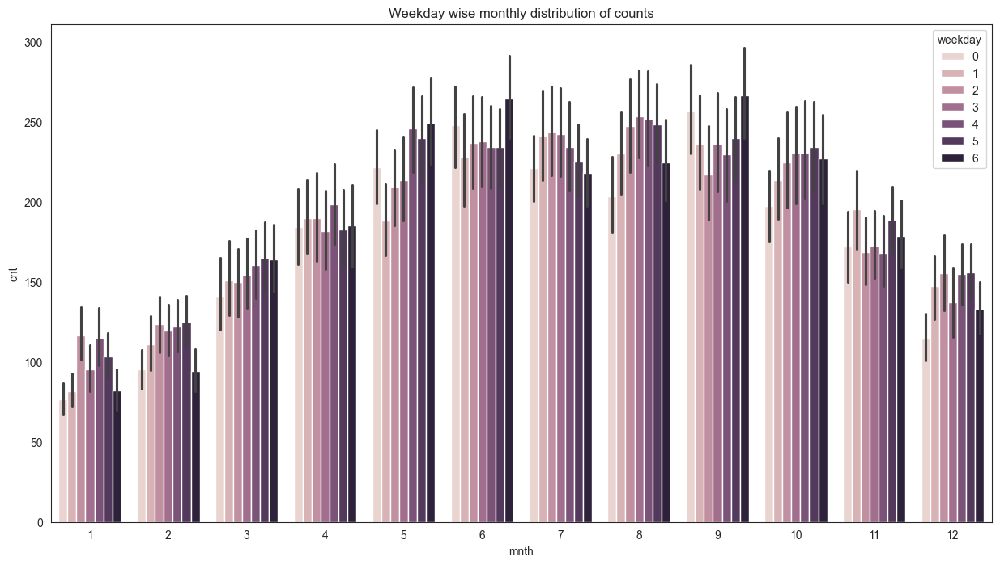

In [122]:
fig,ax=plt.subplots(figsize=(15,8))
sns.set_style('white')

#Bar plot for seasonwise monthly distribution of counts
sns.barplot(x='mnth',y='cnt',data=df[['mnth','cnt','season']],hue='season',ax=ax)
ax.set_title('Seasonwise monthly distribution of counts')
plt.show()

#Bar plot for weekday wise monthly distribution of counts
fig,ax1=plt.subplots(figsize=(15,8))
sns.barplot(x='mnth',y='cnt',data=df[['mnth','cnt','weekday']],hue='weekday',ax=ax1)
ax1.set_title('Weekday wise monthly distribution of counts')
plt.show()

#### From the above plots, we can observed that increasing the bike rental count in springe and summer season and then decreasing the bike rental count in fall and winter season

### Yearly wise distribution of counts

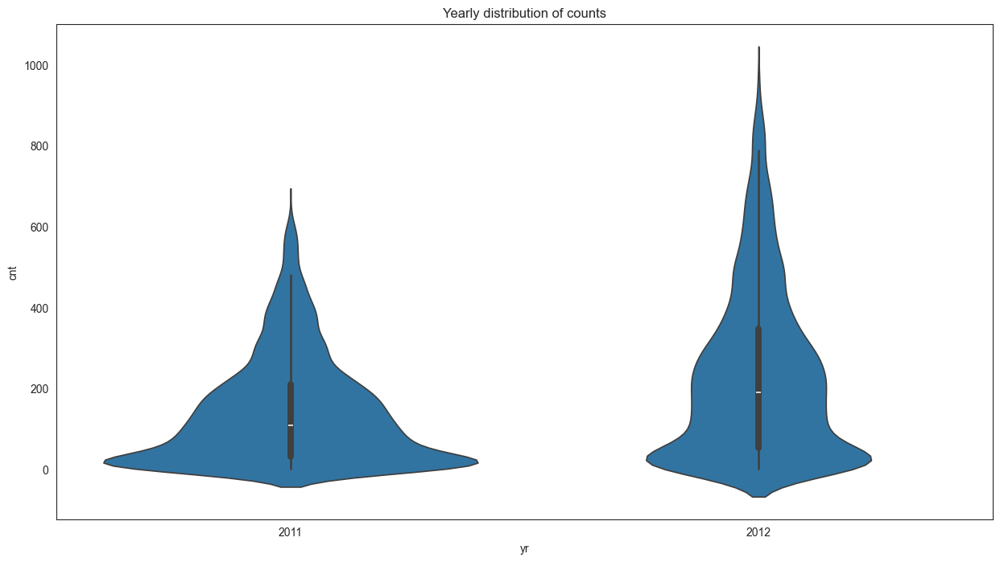

In [123]:
fig,ax=plt.subplots(figsize=(15,8))
#Violin plot for yearly distribution of counts
sns.violinplot(x='yr',y='cnt',data=df[['yr','cnt']])
ax.set_title('Yearly distribution of counts')
plt.show()

#### From the violin plot, we can observed that the bike rental count distribution is highest in year 2012 then in year 2011.

### Hourly wise distribution of counts

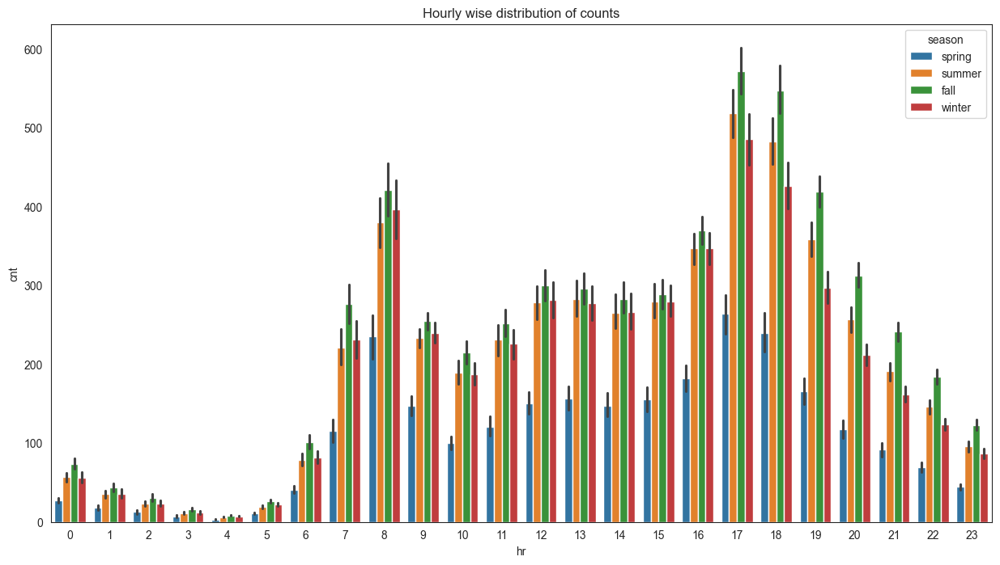

In [124]:
fig,ax=plt.subplots(figsize=(15,8))
#Barplot for Hourly distribution of counts
sns.barplot(data=df,x='hr',y='cnt',hue='season')
ax.set_title('Hourly wise distribution of counts')
plt.show()

### Holiday wise distribution of counts

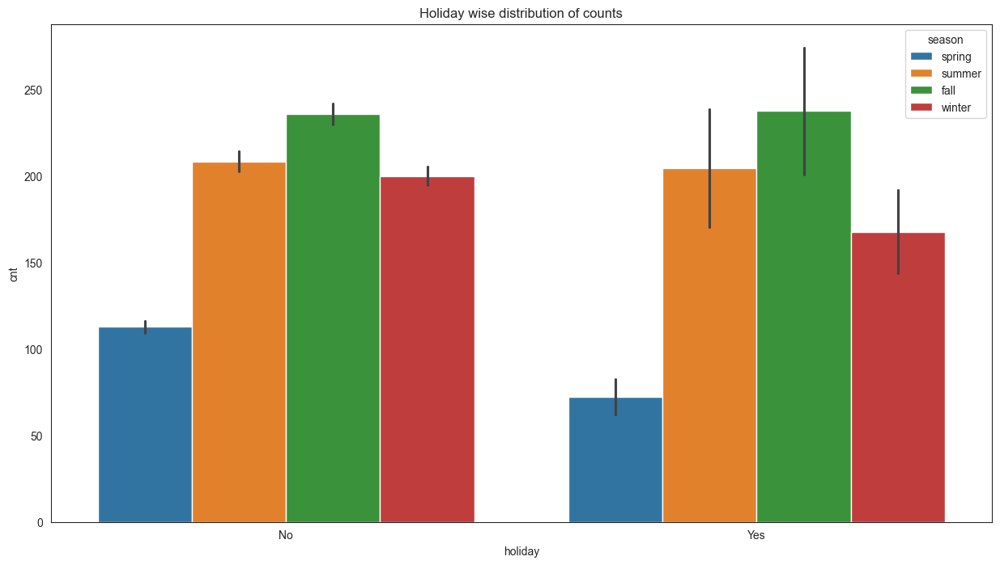

In [125]:
fig,ax=plt.subplots(figsize=(15,8))
#Barplot for Holiday distribution of counts
sns.barplot(data=df,x='holiday',y='cnt',hue='season')
ax.set_title('Holiday wise distribution of counts')
plt.show()

#### From the above bar plot, we can observed that during no holiday the bike rental counts is highest compared to during holiday for different seasons.

### Workingday wise distribution of counts

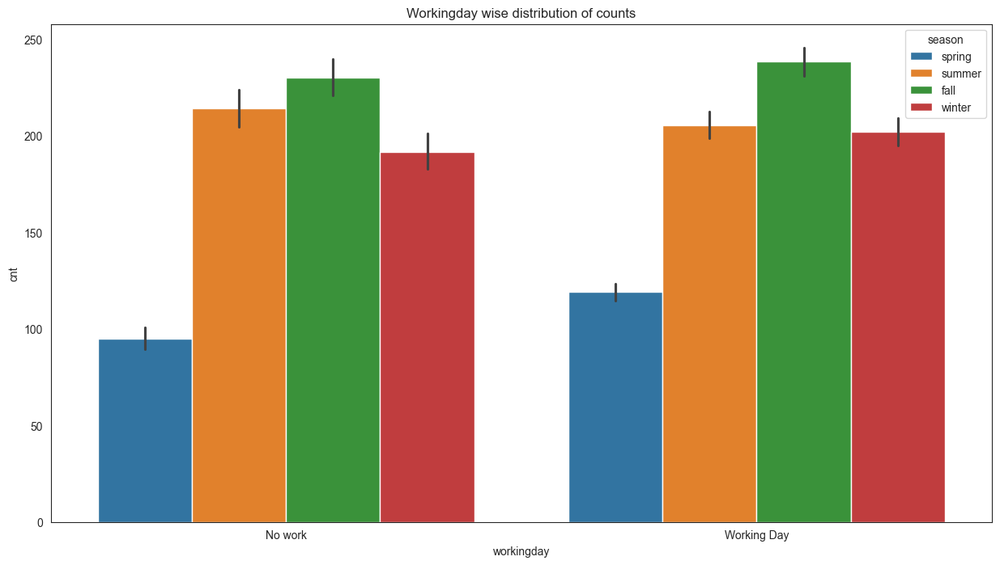

In [126]:
fig,ax=plt.subplots(figsize=(15,8))
#Bar plot for workingday distribution of counts
sns.barplot(data=df,x='workingday',y='cnt',hue='season')
ax.set_title('Workingday wise distribution of counts')
plt.show()

#### From the above bar plot, we can observed that during workingday the bike rental counts is quite highest compared to during no workingday for different seasons.

### Weather_condition distribution of counts

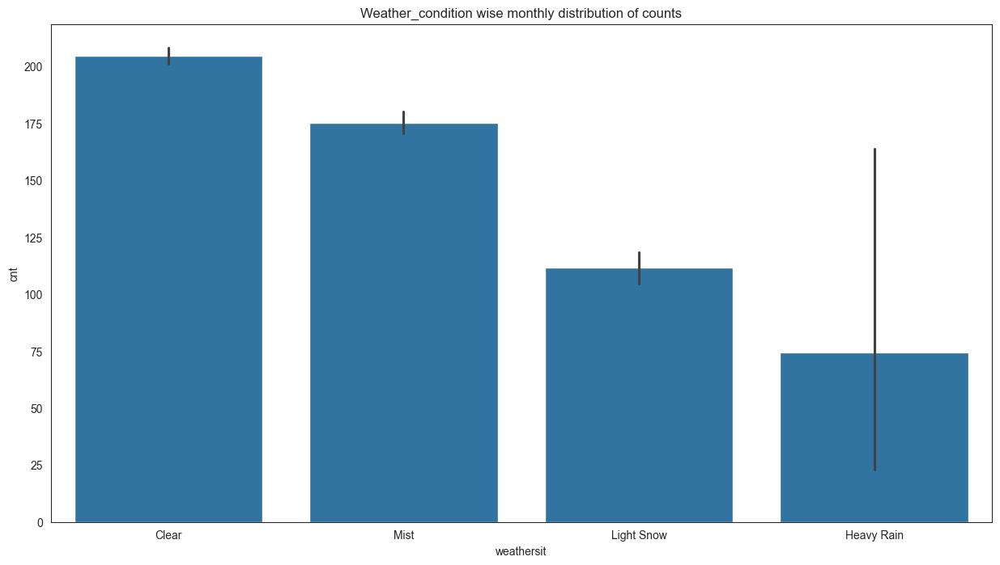

In [127]:
fig,ax1=plt.subplots(figsize=(15,8))
#Bar plot for weather_condition distribution of counts
sns.barplot(x='weathersit',y='cnt',data=df[['mnth','cnt','weathersit']],ax=ax1)
ax1.set_title('Weather_condition wise monthly distribution of counts')
plt.show()

#### From the above bar plot, we can observed that during clear weather the bike rental count is highest and the second highest is during mist weather and followed by third highest during light snow and heavy rain weather.

### Normal Probability Plot

#### Normal probability plot is a graphical technique to identify substantive departures from normality and also it tells about goodness of fit.

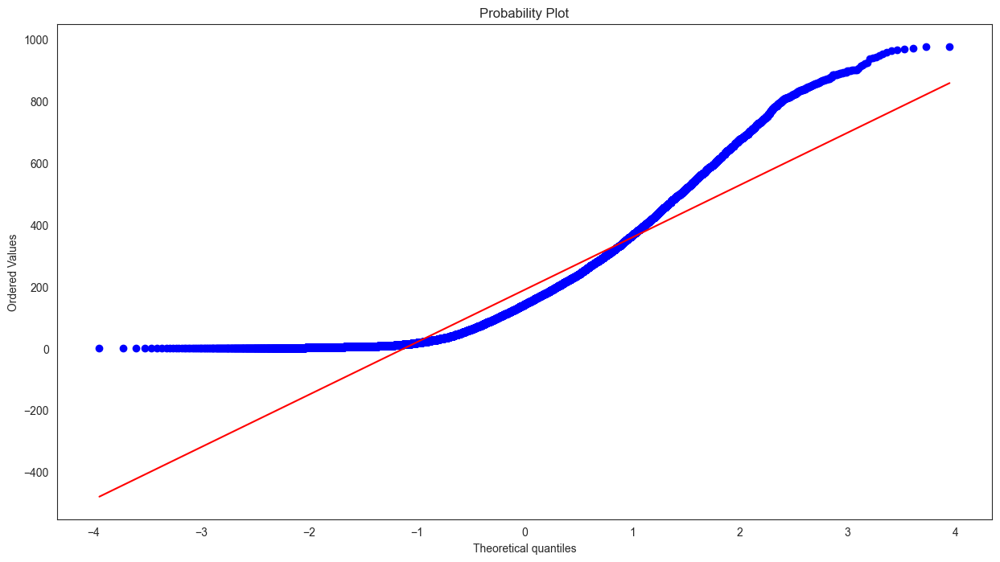

In [128]:
import scipy
from scipy import stats
#Normal plot
fig=plt.figure(figsize=(15,8))
stats.probplot(df.cnt.tolist(),dist='norm',plot=plt)
plt.show()

#### The above probability plot, the some target variable data points are deviates from normality.

### Correlation matrix

#### Correlation matrix is tells about linear relationship between attributes and help us to build better models.

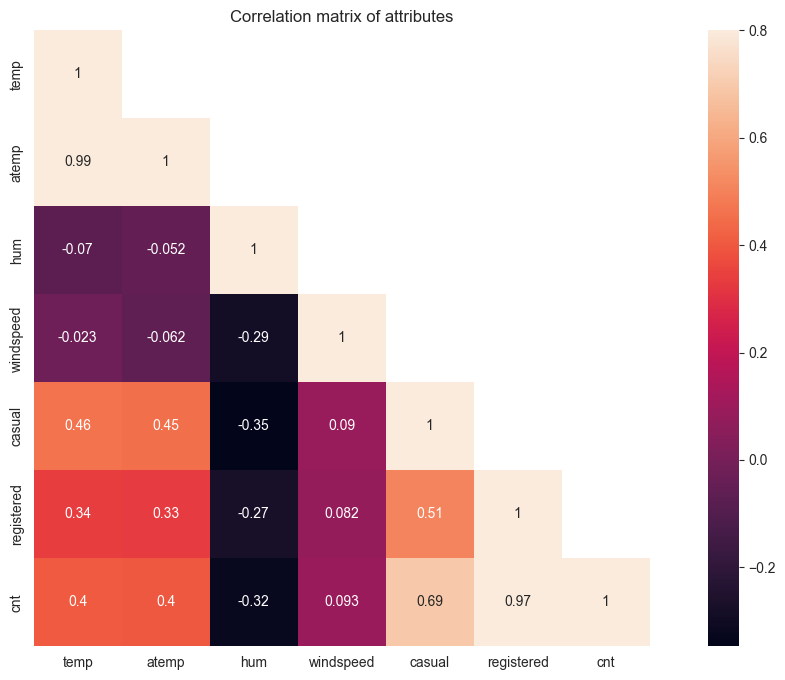

In [129]:
#Create the correlation matrix
correMtr=df[["temp","atemp","hum","windspeed","casual","registered","cnt"]].corr()
mask=np.array(correMtr)
mask[np.tril_indices_from(mask)]=False

#Heat map for correlation matrix of attributes
fig,ax=plt.subplots(figsize=(15,8))
sns.heatmap(correMtr,mask=mask,vmax=0.8,square=True,annot=True,ax=ax)
ax.set_title('Correlation matrix of attributes')
plt.show()

Text(0, 0.5, 'Rental counts')

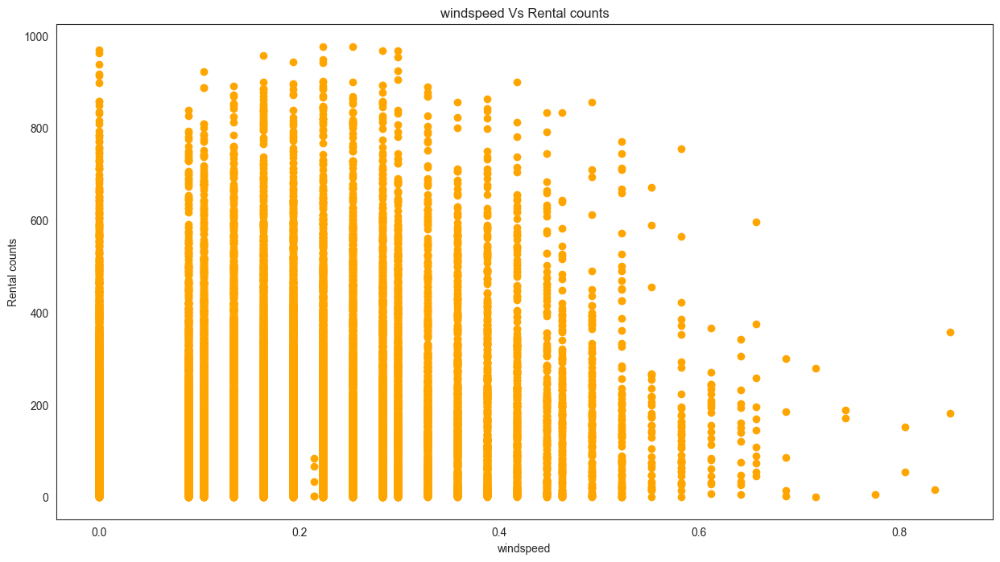

In [130]:
fig,ax=plt.subplots(figsize=(15,8))
plt.scatter(df['windspeed'], df['cnt'], color='orange')
plt.title('windspeed Vs Rental counts')
plt.xlabel('windspeed')
plt.ylabel('Rental counts')

#### As expected, higher wind speed is not a favorable condition for renting bikes.

#### On the contrary, lower windspeed leads to pleasant warmer weather and hence more bike rentals.

### Visualizing Weather situation vs bike rentals

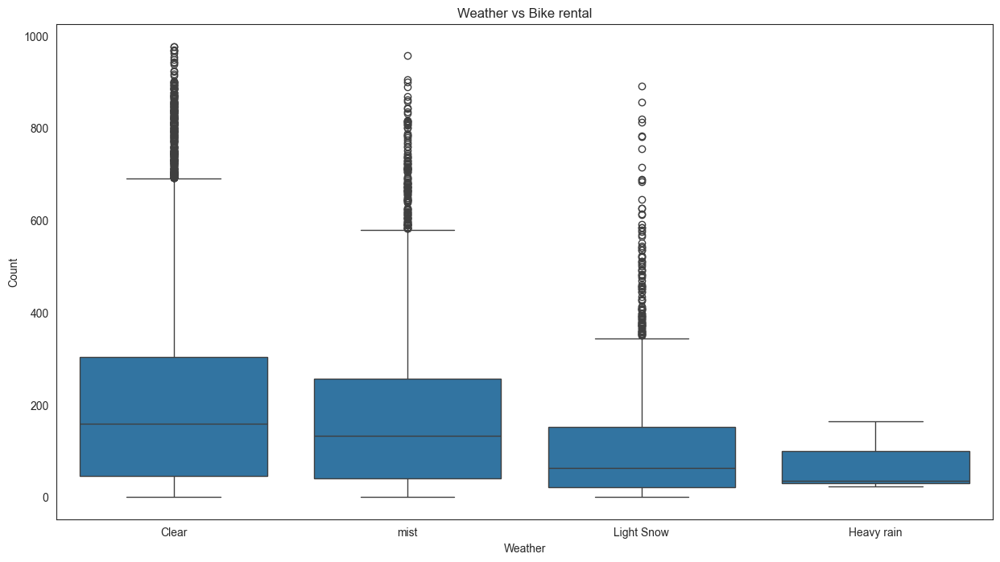

In [131]:
fig,ax=plt.subplots(figsize=(15,8))
sns.boxplot(x='weathersit',y='cnt',data=df)
plt.title('Weather vs Bike rental')
plt.xlabel('Weather')
plt.xticks(np.arange(4), ('Clear', 'mist', 'Light Snow', 'Heavy rain'))
plt.ylabel('Count')
plt.show()

# Feature engineering and selection

In [132]:
df.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
date,,,,,,,,,,,,,,,
2011-01-01,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.810000,0.0,3,13,16
2011-01-01,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.800000,0.0,8,32,40
2011-01-01,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,0.581197,0.0,5,27,32
2011-01-01,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,3,10,13
2011-01-01,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,0,1,1


In [133]:
dnew = df.copy()

In [134]:
dnew.reset_index(inplace = True)

In [135]:
dnew.head()

,date,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,2011-01-01,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.810000,0.0,3,13,16
1,2011-01-01,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.800000,0.0,8,32,40
2,2011-01-01,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,0.581197,0.0,5,27,32
3,2011-01-01,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,3,10,13
4,2011-01-01,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,0,1,1


## Dealing with the "date" column

In [136]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        17379 non-null  datetime64[ns]
 1   season      17379 non-null  object        
 2   yr          17379 non-null  int64         
 3   mnth        17379 non-null  int64         
 4   hr          17379 non-null  int64         
 5   holiday     17379 non-null  object        
 6   weekday     17379 non-null  int64         
 7   workingday  17379 non-null  object        
 8   weathersit  17379 non-null  object        
 9   temp        17379 non-null  float64       
 10  atemp       17379 non-null  float64       
 11  hum         17379 non-null  float64       
 12  windspeed   17379 non-null  float64       
 13  casual      17379 non-null  Int64         
 14  registered  17379 non-null  Int64         
 15  cnt         17379 non-null  int64         
dtypes: Int64(2), datetime6

So, we have 16 columns in total. (there were 17 columns intially, but we dropped off 1 column (instance) in the earlier stage only. So, among these 16 columns, we have 15 feature columns and 1 target column (cnt).

__Note:__

We cannot feed the date column to the Regression model, as regression model works with the numerical data (categorical values are also converted to numeric either throgh dummy variable or encoding. 

But we cannot perform such thing with the date column. Now for that we need to extract data from the date column like year, month and day. Here, we already have all these columns in our dataset. 
Now we can simply drop the date column, without losing any data!

In [137]:
dnew.drop('date', inplace = True, axis = 1)

In [138]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      17379 non-null  object 
 1   yr          17379 non-null  int64  
 2   mnth        17379 non-null  int64  
 3   hr          17379 non-null  int64  
 4   holiday     17379 non-null  object 
 5   weekday     17379 non-null  int64  
 6   workingday  17379 non-null  object 
 7   weathersit  17379 non-null  object 
 8   temp        17379 non-null  float64
 9   atemp       17379 non-null  float64
 10  hum         17379 non-null  float64
 11  windspeed   17379 non-null  float64
 12  casual      17379 non-null  Int64  
 13  registered  17379 non-null  Int64  
 14  cnt         17379 non-null  int64  
dtypes: Int64(2), float64(4), int64(5), object(4)
memory usage: 2.0+ MB


__Note:__

Now, we are down to 14 features and 1 target variable. A total of 15 columns.

Here, we have 3 columns which have categorical values, season, workingday, and weathersit. We need to convert these columns into numerical column, either using dummy variables or label encoding method. 

Number of features is already 14. and dummy variable or one-hot encoding is going to increase it further. So, we are just going use label encoder or ordinal encoder here.

## Dealing with "categorical" columns

In [139]:
col = ['season', 'workingday','weathersit']

In [140]:
for i in col:
    print(dnew[i].value_counts())
    print()

season
fall      4496
summer    4409
spring    4242
winter    4232
Name: count, dtype: int64

workingday
Working Day    11867
No work         5512
Name: count, dtype: int64

weathersit
Clear         11416
Mist           4541
Light Snow     1419
Heavy Rain        3
Name: count, dtype: int64



In [141]:
dnew.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.810000,0.0,3,13,16
1,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.800000,0.0,8,32,40
2,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,0.581197,0.0,5,27,32
3,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,3,10,13
4,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,0,1,1


In [142]:
season_map = {'fall':0, 'summer': 1, 'winter':2, 'spring':3}

In [143]:
dnew['season_map'] = dnew['season'].map(season_map)

In [144]:
dnew.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,season_map
0,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.810000,0.0,3,13,16,3
1,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.800000,0.0,8,32,40,3
2,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,0.581197,0.0,5,27,32,3
3,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,3,10,13,3
4,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,0,1,1,3


In [145]:
dnew['season_map'].value_counts()

season_map
0    4496
1    4409
3    4242
2    4232
Name: count, dtype: int64

In [146]:
dnew['workingday'].value_counts()

workingday
Working Day    11867
No work         5512
Name: count, dtype: int64

In [147]:
wd_map = {'No work':0, 'Working Day':1}

In [148]:
dnew['workingday_map'] = dnew['workingday'].map(wd_map)

In [149]:
dnew.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,season_map,workingday_map
0,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.810000,0.0,3,13,16,3,0
1,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.800000,0.0,8,32,40,3,0
2,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,0.581197,0.0,5,27,32,3,0
3,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,3,10,13,3,0
4,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,0,1,1,3,0


In [150]:
dnew['workingday_map'].value_counts()

workingday_map
1    11867
0     5512
Name: count, dtype: int64

In [151]:
dnew['weathersit'].value_counts()

weathersit
Clear         11416
Mist           4541
Light Snow     1419
Heavy Rain        3
Name: count, dtype: int64

In [152]:
ws_map = {'Clear':0, 'Mist':1, 'Light Snow':2, 'Heavy Rain':3}

In [153]:
dnew['weathersit_map'] = dnew['weathersit'].map(ws_map) 

In [154]:
dnew.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,season_map,workingday_map,weathersit_map
0,spring,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.810000,0.0,3,13,16,3,0,0
1,spring,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.800000,0.0,8,32,40,3,0,0
2,spring,2011,1,2,No,6,No work,Clear,0.22,0.2727,0.581197,0.0,5,27,32,3,0,0
3,spring,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,3,10,13,3,0,0
4,spring,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.750000,0.0,0,1,1,3,0,0


In [155]:
dnew['weathersit_map'].value_counts()

weathersit_map
0    11416
1     4541
2     1419
3        3
Name: count, dtype: int64

In [156]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   season          17379 non-null  object 
 1   yr              17379 non-null  int64  
 2   mnth            17379 non-null  int64  
 3   hr              17379 non-null  int64  
 4   holiday         17379 non-null  object 
 5   weekday         17379 non-null  int64  
 6   workingday      17379 non-null  object 
 7   weathersit      17379 non-null  object 
 8   temp            17379 non-null  float64
 9   atemp           17379 non-null  float64
 10  hum             17379 non-null  float64
 11  windspeed       17379 non-null  float64
 12  casual          17379 non-null  Int64  
 13  registered      17379 non-null  Int64  
 14  cnt             17379 non-null  int64  
 15  season_map      17379 non-null  int64  
 16  workingday_map  17379 non-null  int64  
 17  weathersit_map  17379 non-null 

Now that we have extracted the values out of season, weathersit and workingday column, we can drop them out of the dataset.

In [157]:
dnew.drop(['season','weathersit','workingday'], axis = 1, inplace = True)

In [158]:
dnew.head()

,yr,mnth,hr,holiday,weekday,temp,atemp,hum,windspeed,casual,registered,cnt,season_map,workingday_map,weathersit_map
0,2011,1,0,No,6,0.24,0.2879,0.810000,0.0,3,13,16,3,0,0
1,2011,1,1,No,6,0.22,0.2727,0.800000,0.0,8,32,40,3,0,0
2,2011,1,2,No,6,0.22,0.2727,0.581197,0.0,5,27,32,3,0,0
3,2011,1,3,No,6,0.24,0.2879,0.750000,0.0,3,10,13,3,0,0
4,2011,1,4,No,6,0.24,0.2879,0.750000,0.0,0,1,1,3,0,0


In [159]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   yr              17379 non-null  int64  
 1   mnth            17379 non-null  int64  
 2   hr              17379 non-null  int64  
 3   holiday         17379 non-null  object 
 4   weekday         17379 non-null  int64  
 5   temp            17379 non-null  float64
 6   atemp           17379 non-null  float64
 7   hum             17379 non-null  float64
 8   windspeed       17379 non-null  float64
 9   casual          17379 non-null  Int64  
 10  registered      17379 non-null  Int64  
 11  cnt             17379 non-null  int64  
 12  season_map      17379 non-null  int64  
 13  workingday_map  17379 non-null  int64  
 14  weathersit_map  17379 non-null  int64  
dtypes: Int64(2), float64(4), int64(8), object(1)
memory usage: 2.0+ MB


Okay, there is one more column called holiday

In [160]:
dnew['holiday'].value_counts()

holiday
No     16879
Yes      500
Name: count, dtype: int64

In [161]:
hd_map = {'No':0, 'Yes':1}

In [162]:
dnew['holiday_map'] = dnew['holiday'].map(hd_map)

In [163]:
dnew.head()

,yr,mnth,hr,holiday,weekday,temp,atemp,hum,windspeed,casual,registered,cnt,season_map,workingday_map,weathersit_map,holiday_map
0,2011,1,0,No,6,0.24,0.2879,0.810000,0.0,3,13,16,3,0,0,0
1,2011,1,1,No,6,0.22,0.2727,0.800000,0.0,8,32,40,3,0,0,0
2,2011,1,2,No,6,0.22,0.2727,0.581197,0.0,5,27,32,3,0,0,0
3,2011,1,3,No,6,0.24,0.2879,0.750000,0.0,3,10,13,3,0,0,0
4,2011,1,4,No,6,0.24,0.2879,0.750000,0.0,0,1,1,3,0,0,0


In [164]:
dnew.drop('holiday', axis = 1, inplace = True)

In [165]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   yr              17379 non-null  int64  
 1   mnth            17379 non-null  int64  
 2   hr              17379 non-null  int64  
 3   weekday         17379 non-null  int64  
 4   temp            17379 non-null  float64
 5   atemp           17379 non-null  float64
 6   hum             17379 non-null  float64
 7   windspeed       17379 non-null  float64
 8   casual          17379 non-null  Int64  
 9   registered      17379 non-null  Int64  
 10  cnt             17379 non-null  int64  
 11  season_map      17379 non-null  int64  
 12  workingday_map  17379 non-null  int64  
 13  weathersit_map  17379 non-null  int64  
 14  holiday_map     17379 non-null  int64  
dtypes: Int64(2), float64(4), int64(9)
memory usage: 2.0 MB


In [166]:
dnew.rename(columns = {'season_map':'season','workingday_map':'workingday','holiday_map':'holiday','weathersit_map':'weathersit'}, inplace = True)

In [167]:
dnew.head()

,yr,mnth,hr,weekday,temp,atemp,hum,windspeed,casual,registered,cnt,season,workingday,weathersit,holiday
0,2011,1,0,6,0.24,0.2879,0.810000,0.0,3,13,16,3,0,0,0
1,2011,1,1,6,0.22,0.2727,0.800000,0.0,8,32,40,3,0,0,0
2,2011,1,2,6,0.22,0.2727,0.581197,0.0,5,27,32,3,0,0,0
3,2011,1,3,6,0.24,0.2879,0.750000,0.0,3,10,13,3,0,0,0
4,2011,1,4,6,0.24,0.2879,0.750000,0.0,0,1,1,3,0,0,0


In [168]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   temp        17379 non-null  float64
 5   atemp       17379 non-null  float64
 6   hum         17379 non-null  float64
 7   windspeed   17379 non-null  float64
 8   casual      17379 non-null  Int64  
 9   registered  17379 non-null  Int64  
 10  cnt         17379 non-null  int64  
 11  season      17379 non-null  int64  
 12  workingday  17379 non-null  int64  
 13  weathersit  17379 non-null  int64  
 14  holiday     17379 non-null  int64  
dtypes: Int64(2), float64(4), int64(9)
memory usage: 2.0 MB


Now, we have all the numerical columns here.

## Dealing with "Redundancy"

Here the "cnt" column is nothing but sum of the "casual" and "registered" column. "cnt" is out target variable.


If we simply have the casual and the registered customers' value, then there is no model building as such. We can simply add the two columns and give the values. 

So, we rather drop off these linearly dependent columns.

In [169]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   temp        17379 non-null  float64
 5   atemp       17379 non-null  float64
 6   hum         17379 non-null  float64
 7   windspeed   17379 non-null  float64
 8   casual      17379 non-null  Int64  
 9   registered  17379 non-null  Int64  
 10  cnt         17379 non-null  int64  
 11  season      17379 non-null  int64  
 12  workingday  17379 non-null  int64  
 13  weathersit  17379 non-null  int64  
 14  holiday     17379 non-null  int64  
dtypes: Int64(2), float64(4), int64(9)
memory usage: 2.0 MB


In [170]:
dnew['casual'] = dnew['casual'].astype('int64')

In [171]:
dnew['registered']= dnew['registered'].astype('int64')

In [172]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   temp        17379 non-null  float64
 5   atemp       17379 non-null  float64
 6   hum         17379 non-null  float64
 7   windspeed   17379 non-null  float64
 8   casual      17379 non-null  int64  
 9   registered  17379 non-null  int64  
 10  cnt         17379 non-null  int64  
 11  season      17379 non-null  int64  
 12  workingday  17379 non-null  int64  
 13  weathersit  17379 non-null  int64  
 14  holiday     17379 non-null  int64  
dtypes: float64(4), int64(11)
memory usage: 2.0 MB


<Axes: >

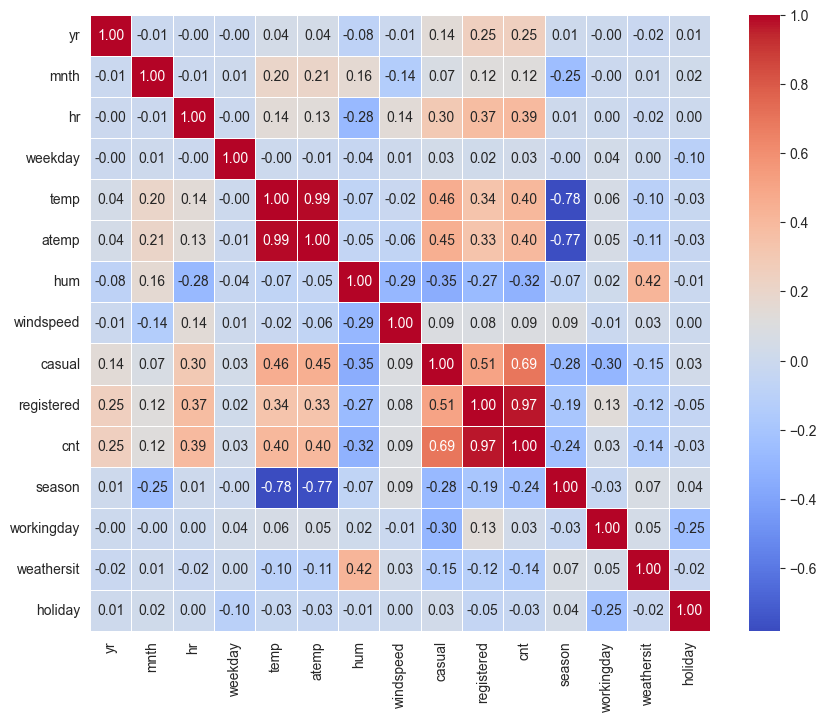

In [173]:
plt.figure(figsize = (10,8))
sns.heatmap(dnew.corr(), annot = True, cmap = 'coolwarm', fmt = '.2f', lw = 0.5)

Here, we can see that "registered" and "cnt" is highly correlated. Also, "casual" though have compartively low correlation rate, but it also affects the "cnt" column in the same way.

In [174]:
dnew.drop(['casual','registered'], inplace = True, axis = 1)

In [175]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   temp        17379 non-null  float64
 5   atemp       17379 non-null  float64
 6   hum         17379 non-null  float64
 7   windspeed   17379 non-null  float64
 8   cnt         17379 non-null  int64  
 9   season      17379 non-null  int64  
 10  workingday  17379 non-null  int64  
 11  weathersit  17379 non-null  int64  
 12  holiday     17379 non-null  int64  
dtypes: float64(4), int64(9)
memory usage: 1.7 MB


Also, temp and atemp are highly correlated with each other. So, we rather keep one and drop the other. 

"temp" is the normalized temperature in celcius

and "atemp" is normalized feeling temperature

Let's keep the normalized feeling temperature as it gives a better idea of how the temperature actually felt like and how it rerally affects the working and people's decision.

In [176]:
dnew.drop('temp', inplace = True, axis = 1)

In [177]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   atemp       17379 non-null  float64
 5   hum         17379 non-null  float64
 6   windspeed   17379 non-null  float64
 7   cnt         17379 non-null  int64  
 8   season      17379 non-null  int64  
 9   workingday  17379 non-null  int64  
 10  weathersit  17379 non-null  int64  
 11  holiday     17379 non-null  int64  
dtypes: float64(3), int64(9)
memory usage: 1.6 MB


Now, we are down to 12 columns, 11 features and 1 target column. 

As we saw earlier, there are a lot of outliers in the "cnt." So, let us transform the data in the "cnt" column to deal with the outliers.

## Dealing with "outliers" using transformation

<Axes: ylabel='cnt'>

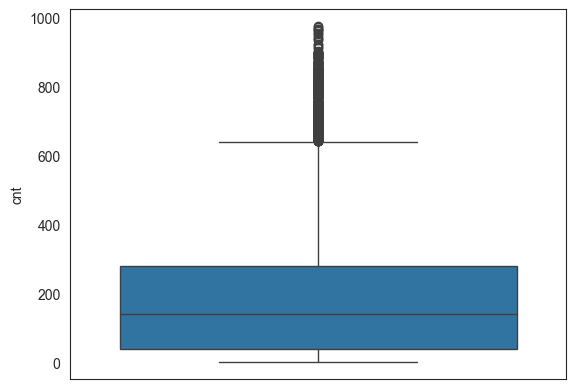

In [178]:
sns.boxplot(dnew['cnt'])

<Axes: ylabel='cnt'>

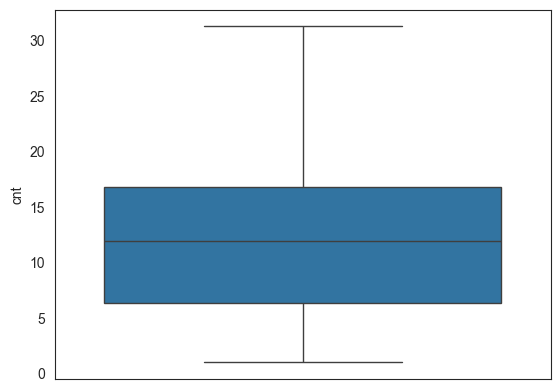

In [179]:
sns.boxplot(np.sqrt(dnew['cnt']))

In [180]:
dnew['cnt'] = np.sqrt(dnew['cnt'])

In [181]:
dnew.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   atemp       17379 non-null  float64
 5   hum         17379 non-null  float64
 6   windspeed   17379 non-null  float64
 7   cnt         17379 non-null  float64
 8   season      17379 non-null  int64  
 9   workingday  17379 non-null  int64  
 10  weathersit  17379 non-null  int64  
 11  holiday     17379 non-null  int64  
dtypes: float64(4), int64(8)
memory usage: 1.6 MB


In [182]:
dnew.head()

,yr,mnth,hr,weekday,atemp,hum,windspeed,cnt,season,workingday,weathersit,holiday
0,2011,1,0,6,0.2879,0.810000,0.0,4.000000,3,0,0,0
1,2011,1,1,6,0.2727,0.800000,0.0,6.324555,3,0,0,0
2,2011,1,2,6,0.2727,0.581197,0.0,5.656854,3,0,0,0
3,2011,1,3,6,0.2879,0.750000,0.0,3.605551,3,0,0,0
4,2011,1,4,6,0.2879,0.750000,0.0,1.000000,3,0,0,0


## Feature selection using Random Forest

In [183]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV

In [184]:
X = dnew.drop('cnt', axis = 1)
y = dnew['cnt']

In [185]:
from sklearn.model_selection import train_test_split

In [186]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 8)

In [187]:
rf = RandomForestRegressor(random_state = 0)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

In [188]:
features = X.columns

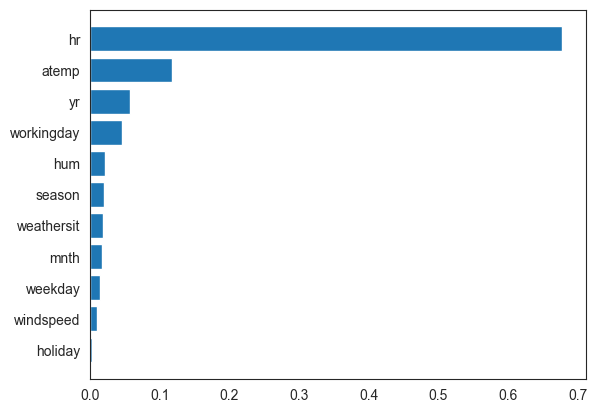

In [189]:
f_i = list(zip(features,rf.feature_importances_))
f_i.sort(key = lambda x : x[1])
plt.barh([x[0] for x in f_i],[x[1] for x in f_i])

plt.show()

The feature "holiday" still seems to be no relevance. So, we can drop it. 

In [190]:
dmod = dnew.drop('holiday', axis = 1)

In [191]:
dmod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   atemp       17379 non-null  float64
 5   hum         17379 non-null  float64
 6   windspeed   17379 non-null  float64
 7   cnt         17379 non-null  float64
 8   season      17379 non-null  int64  
 9   workingday  17379 non-null  int64  
 10  weathersit  17379 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 1.5 MB


__Conclusion:__

So, there are total 11 columns now. Among which 10 are features and 1 is target column ('cnt')

__Note:__

final data is stored in "dmod", so use that in the model building!

## Model building

In [192]:
# Define features and target variable
X = dmod.drop('cnt', axis = 1)  # feature variables
X

,yr,mnth,hr,weekday,atemp,hum,windspeed,season,workingday,weathersit
0,2011,1,0,6,0.2879,0.810000,0.0000,3,0,0
1,2011,1,1,6,0.2727,0.800000,0.0000,3,0,0
2,2011,1,2,6,0.2727,0.581197,0.0000,3,0,0
3,2011,1,3,6,0.2879,0.750000,0.0000,3,0,0
4,2011,1,4,6,0.2879,0.750000,0.0000,3,0,0
...,...,...,...,...,...,...,...,...,...,...
17374,2012,12,19,1,0.2576,0.600000,0.1642,3,1,1
17375,2012,12,20,1,0.2576,0.600000,0.1642,3,1,1
17376,2012,12,21,1,0.2576,0.600000,0.1642,3,1,0
17377,2012,12,22,1,0.2727,0.560000,0.1343,3,1,0


In [193]:
y = dmod['cnt']  # target variable
y

0         4.000000
1         6.324555
2         5.656854
3         3.605551
4         1.000000
           ...    
17374    10.908712
17375     9.433981
17376     9.486833
17377     7.810250
17378     7.000000
Name: cnt, Length: 17379, dtype: float64

In [194]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Linear regression model

In [195]:
from sklearn.linear_model import LinearRegression

# Initialize the linear regression model
lr_model = LinearRegression()

In [196]:
# Fit the model on the training data
lr_model.fit(X_train, y_train)

LinearRegression()

In [197]:
# Predict on the test data
y_pred = lr_model.predict(X_test)

In [198]:
from sklearn.metrics import mean_squared_error

# Evaluate the model
lr_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", lr_mse)

Mean Squared Error: 23.33779430592093


In [199]:
#Accuracy of the model
lr = lr_model.score(X_train,y_train)
print('Accuracy of the model :',lr)

Accuracy of the model : 0.46670399624003966


#### Cross validation prediction

In [200]:
from sklearn.model_selection import cross_val_score,cross_val_predict

#Cross validation prediction
predict = cross_val_predict(lr_model, X_train, y_train, cv=3)
predict

array([ 6.61167056, 15.69471669,  5.77241028, ..., 15.85109218,
        4.74040101, 11.78025834])

#### Cross validation prediction plot

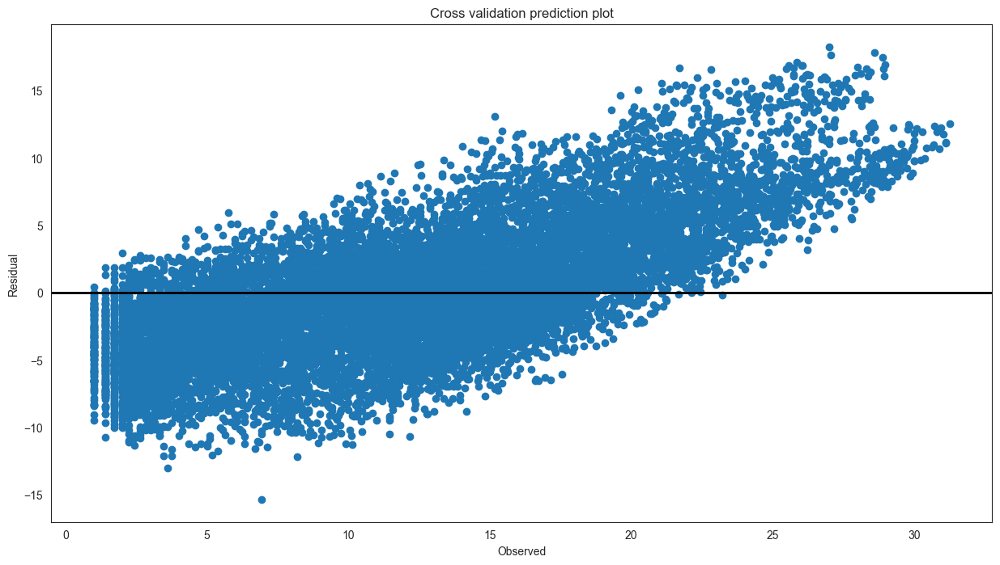

In [201]:
#Cross validation plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train, y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### Model evalution metrics

#### R-squared

In [202]:
#R-squared scores
lr_r2_scores = cross_val_score(lr_model, X_train, y_train, cv=3)
print('R-squared scores :',np.average(lr_r2_scores))

R-squared scores : 0.4659523319238475


#### The R-squared or coefficient of determination is 0.46 on average for 3-fold cross validation , it means that predictor is only able to predict 46% of the variance in the target variable which is contributed by independent variables.

#### Model performance on test dataset

In [203]:
#predict the model
lr_pred = lr_model.predict(X_test)
lr_pred

array([21.5610355 , 13.7341515 ,  5.71705206, ...,  6.62227327,
       12.48990039, 13.54172064])

#### Model evaluation metrics

#### Root mean square error and mean absolute error scores

In [204]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math

# Calculate the root mean square error (RMSE)
lr_rmse = math.sqrt(mean_squared_error(y_test, lr_pred))

# Calculate the mean absolute error (MAE)
lr_mae = mean_absolute_error(y_test, lr_pred)

print('Root mean square error:', lr_rmse)
print('Mean absolute error:', lr_mae)

Root mean square error: 4.830920647860088
Mean absolute error: 3.8518259871680236


#### Residual plot

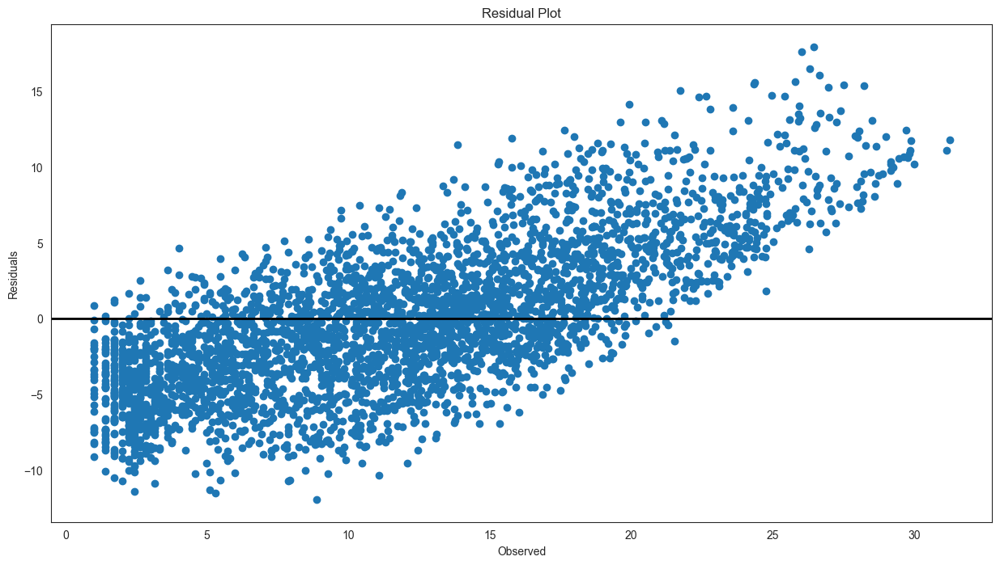

In [205]:
#Residual plot
fig, ax = plt.subplots(figsize=(15,8))
ax.scatter(y_test, y_test-lr_pred)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.title.set_text("Residual Plot")
plt.show()

#### Residual plot tells about finite variance between actual target value and predicted target value.In this plot,very less data points are have same finite variance between them and for most are not have it.

### Decision Tree Regressor model

In [206]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the Decision Tree model
dtr_model = DecisionTreeRegressor(random_state=42)

In [207]:
# Fit the model on the training data
dtr_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [208]:
# Predict on the test data
y_pred = dtr_model.predict(X_test)

In [209]:
# Evaluate the model
dtr_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", dtr_mse)

Mean Squared Error: 4.312821948305797


#### Cross validation prediction

In [210]:
predict = cross_val_predict(dtr_model,X_train,y_train,cv=3)
predict

array([ 9.94987437, 22.04540769,  1.        , ..., 14.31782106,
       10.67707825, 28.3019434 ])

#### Cross validation prediction plot

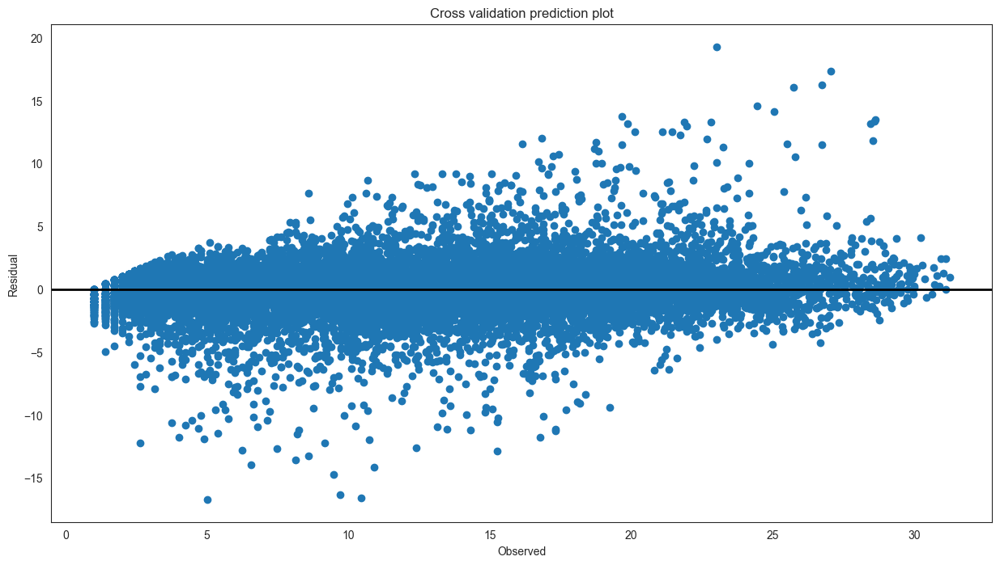

In [211]:
# Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train,y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### Model evalution metrics

#### R-squared

In [212]:
#R-squared scores
dtr_r2_scores = cross_val_score(dtr_model, X_train, y_train, cv=3)
print('R-squared scores :',np.average(dtr_r2_scores))

R-squared scores : 0.8975010259073689


#### The R-squared or coefficient of determination is 0.90 on average for 3-fold cross validation ,it means that predictor is only able to predict 90% of the variance in the target variable which is contributed by independent variables.

#### Model performance on test dataset

In [213]:
#predict the model
dtr_pred = dtr_model.predict(X_test)
dtr_pred

array([18.97366596, 10.48808848,  4.24264069, ...,  8.83176087,
       19.6977156 , 15.84297952])

#### Root mean squared error and mean absolute error

In [214]:
# Calculate the root mean square error (RMSE)
dtr_rmse = math.sqrt(mean_squared_error(y_test, dtr_pred))

# Calculate the mean absolute error (MAE)
dtr_mae = mean_absolute_error(y_test, dtr_pred)

print('Root mean square error:', dtr_rmse)
print('Mean absolute error:', dtr_mae)

Root mean square error: 2.0767334803257245
Mean absolute error: 1.3520809952023882


#### Residual plot

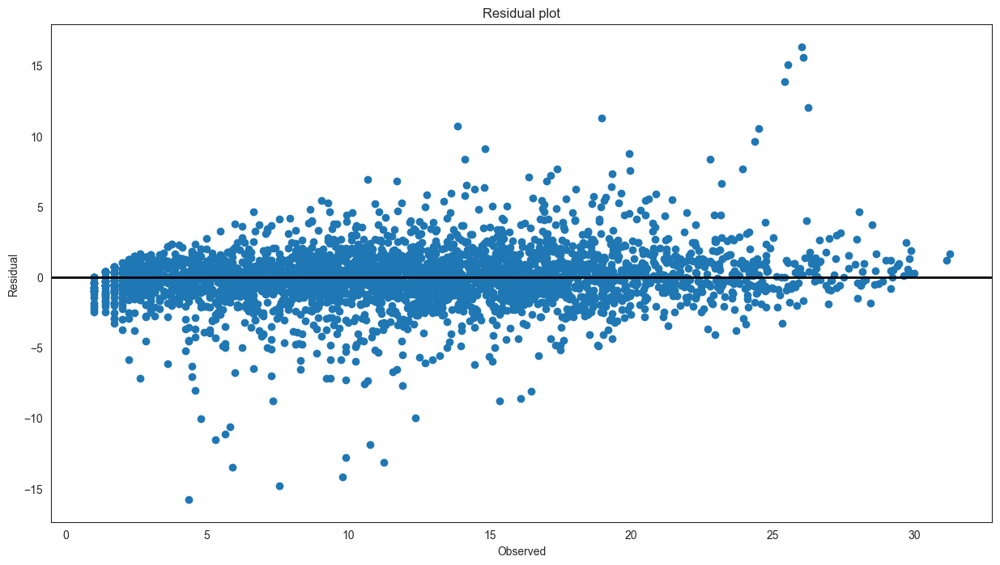

In [215]:
#Residual scatter plot
residuals = y_test-dtr_pred
fig, ax = plt.subplots(figsize=(15,8))
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
ax.set_title('Residual plot')
plt.show()

### Random Forest Model

In [216]:
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

In [217]:
# Fit the model on the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [218]:
# Predict on the test data
y_pred = rf_model.predict(X_test)

In [219]:
# Evaluate the model
rf_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", rf_mse)

Mean Squared Error: 2.0833098317647396


#### Cross validation prediction

In [220]:
#Cross validation prediction
predict = cross_val_predict(rf_model,X_train,y_train,cv=3)
predict

array([ 9.02892356, 21.46681377,  1.56396464, ..., 13.31761903,
       10.05417577, 27.87066912])

#### Cross validation prediction plot

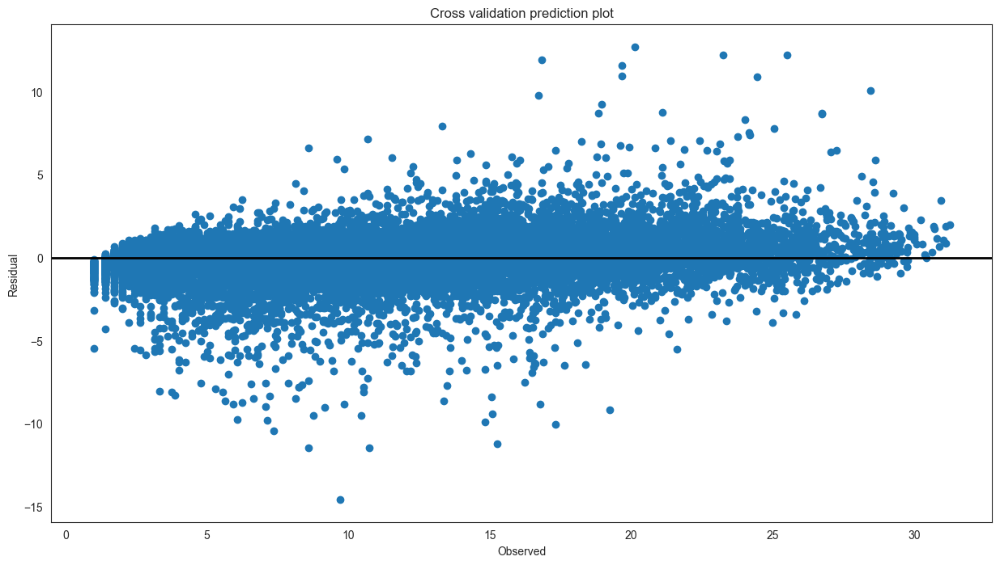

In [221]:
#Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train,y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### R-squared

In [222]:
#R-squared scores
rf_r2_scores = cross_val_score(rf_model, X_train, y_train, cv=3)
print('R-squared scores :',np.average(rf_r2_scores))

R-squared scores : 0.947231053324464


#### Model performance on test dataset

In [223]:
#predict the model
rf_pred = rf_model.predict(X_test)
rf_pred

array([19.29678751, 10.35225171,  3.22427051, ...,  8.97733164,
       19.57945258, 15.31172918])

#### Root mean squared error and mean absolute error

In [224]:
# Calculate the root mean square error (RMSE)
rf_rmse = math.sqrt(mean_squared_error(y_test, rf_pred))

# Calculate the mean absolute error (MAE)
rf_mae = mean_absolute_error(y_test, rf_pred)

print('Root mean square error:', rf_rmse)
print('Mean absolute error:', rf_mae)

Root mean square error: 1.4433675317689323
Mean absolute error: 0.9790818975836584


#### Residual plot

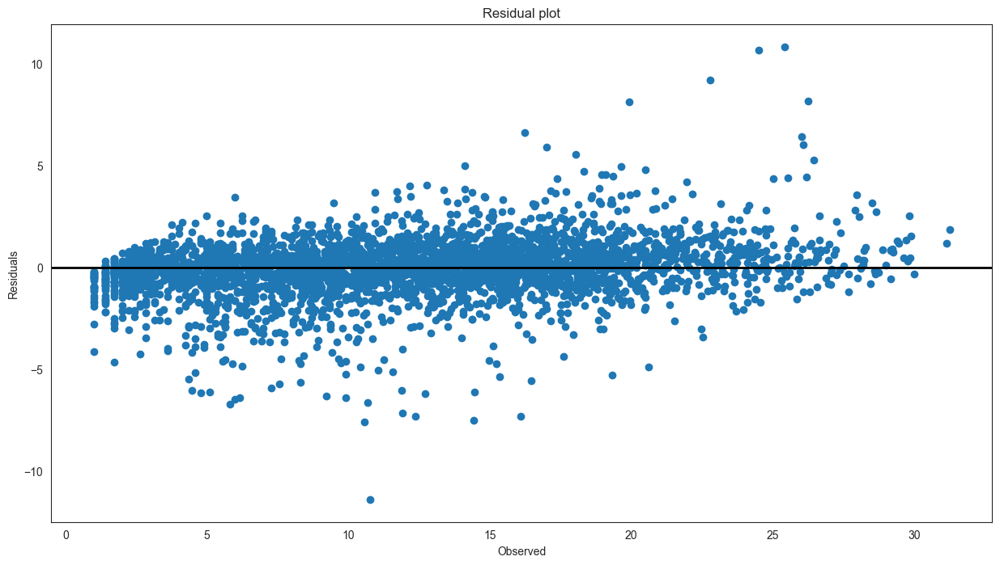

In [225]:
#Residual scatter plot
fig, ax = plt.subplots(figsize=(15,8))
residuals=y_test-rf_pred
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.set_title('Residual plot')
plt.show()

### Gradient Boosting model

In [226]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize the Gradient Boosting model
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [227]:
# Fit the model on the training data
gb_model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [228]:
# Predict on the test data
y_pred = gb_model.predict(X_test)

In [229]:
# Evaluate the model
gb_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", gb_mse)

Mean Squared Error: 4.223863543436235


#### Cross validation prediction

In [230]:
#Cross validation prediction
predict=cross_val_predict(gb_model,X_train,y_train,cv=3)
predict

array([ 8.78053986, 20.87281984,  2.09033803, ..., 14.75164277,
        9.71347313, 20.65407338])

#### Cross validation prediction plot

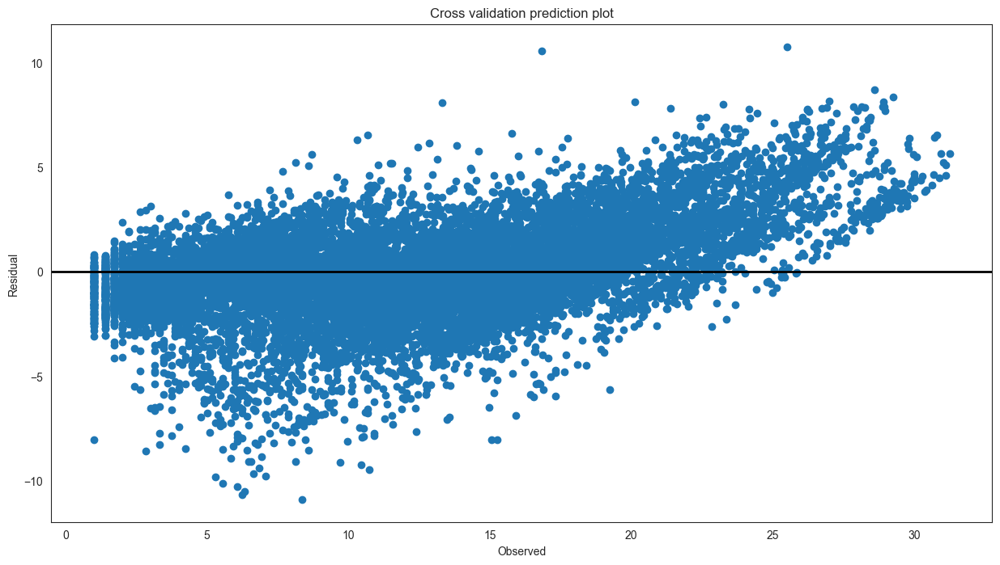

In [231]:
#Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train,y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### R-squared and mean squared error scores

In [232]:
#R-squared scores
gb_r2_scores = cross_val_score(gb_model, X_train, y_train, cv=3)
print('R-squared scores :',np.average(gb_r2_scores))

R-squared scores : 0.8923800736600617


#### Model performance on test dataset

In [233]:
#predict the model
gb_pred = gb_model.predict(X_test)
gb_pred

array([21.4187205 , 10.39681241,  3.55371932, ...,  9.39299363,
       17.55625488, 15.17170411])

#### Root mean squared error and mean absolute error

In [234]:
#Root mean square error
gb_rmse = math.sqrt(mean_squared_error(y_test,gb_pred))
print('Root mean square error :',gb_rmse)

#Mean absolute error
gb_mae = mean_absolute_error(y_test,gb_pred)
print('Mean absolute error :',gb_mae)

Root mean square error : 2.055204015039927
Mean absolute error : 1.5578843720406517


#### Residual plot

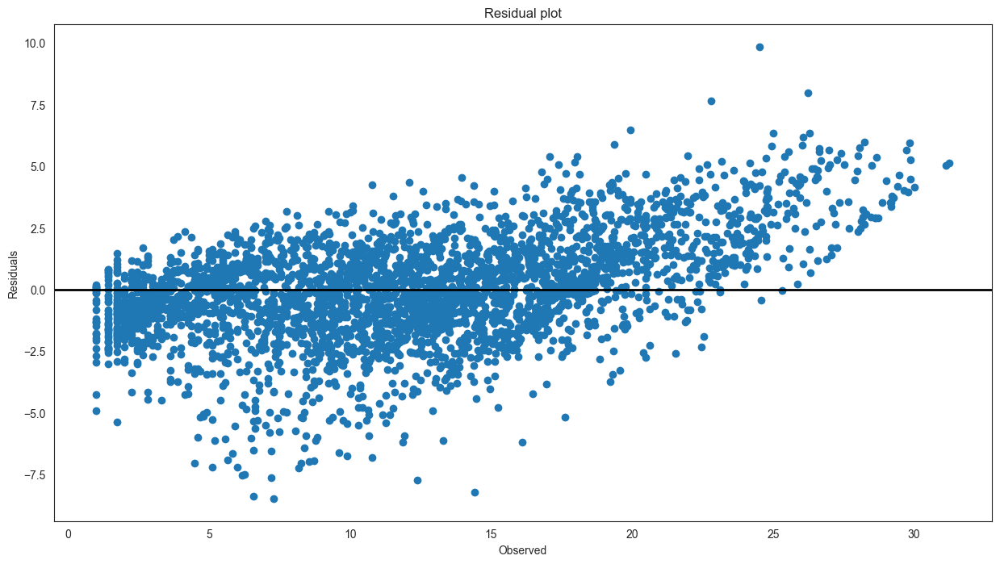

In [235]:
#Residual scatter plot
fig, ax = plt.subplots(figsize=(15,8))
residuals = y_test - gb_pred
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.set_title('Residual plot')
plt.show()

### KNN regressor

In [236]:
from sklearn.neighbors import KNeighborsRegressor

# Initialize the KNN regressor with a chosen value of k
k = 5  
knn_model = KNeighborsRegressor(n_neighbors=k)

In [237]:
# Fit the model on the training data
knn_model.fit(X_train, y_train)

KNeighborsRegressor()

In [238]:
# Predict on the test data
y_pred = knn_model.predict(X_test)

In [239]:
# Evaluate the model
knn_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", knn_mse)

Mean Squared Error: 3.038315649448981


#### Cross validation prediction

In [240]:
#Cross validation prediction
predict = cross_val_predict(knn_model,X_train,y_train,cv=3)
predict

array([12.02438929, 22.83339784,  1.97341965, ..., 13.49631765,
       10.55632151, 24.57860936])

#### Cross validation prediction plot

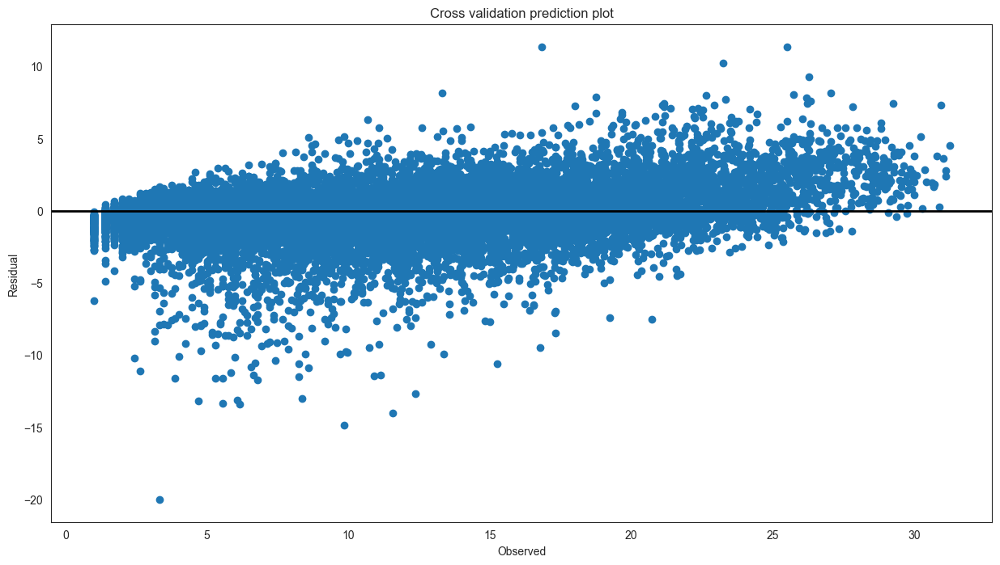

In [241]:
#Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train, y_train-predict)
ax.axhline(lw=2, color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### R-squared and mean squared error scores

In [242]:
#R-squared scores
knn_r2_scores = cross_val_score(knn_model, X_train, y_train, cv=3)
print('R-squared scores :',np.average(knn_r2_scores))

R-squared scores : 0.9111364110921082


#### Model performance on test dataset

In [243]:
#predict the model
knn_pred = knn_model.predict(X_test)
knn_pred

array([19.36648296,  9.84668122,  3.11478994, ...,  8.51372158,
       17.8938855 , 17.14009709])

#### Root mean squared error and mean absolute error

In [244]:
#Root mean square error
knn_rmse = math.sqrt(mean_squared_error(y_test,knn_pred))
print('Root mean square error :',knn_rmse)

#Mean absolute error
knn_mae=mean_absolute_error(y_test,knn_pred)
print('Mean absolute error :',knn_mae)

Root mean square error : 1.7430764898446027
Mean absolute error : 1.2391537412701823


#### Residual plot

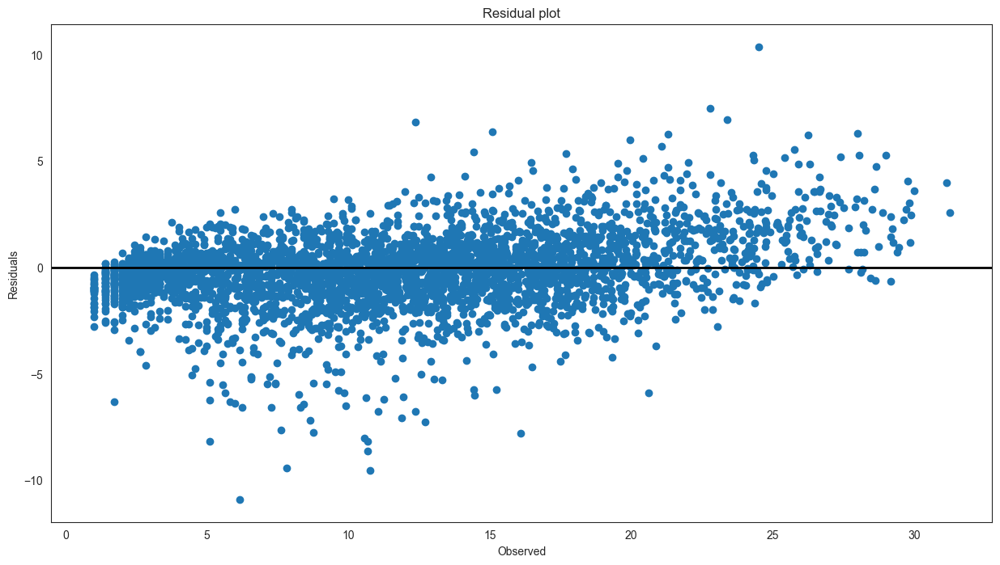

In [245]:
#Residual scatter plot
fig, ax = plt.subplots(figsize=(15,8))
residuals = y_test - knn_pred
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.set_title('Residual plot')
plt.show()

### Neural Network Regression

In [246]:
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit(X_train)

In [247]:
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [248]:
# Initialize the MLP regressor
mlp_model = MLPRegressor(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', random_state=42)

In [249]:
# Fit the model on the scaled training data
mlp_model.fit(X_train_scaled, y_train)

C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(100, 50), random_state=42)

In [250]:
# Predict on the scaled test data
y_pred = mlp_model.predict(X_test_scaled)

In [251]:
# Evaluate the model
nn_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", nn_mse)

Mean Squared Error: 2.1014554953879307


#### Cross validation prediction

In [252]:
#Cross validation prediction
predict = cross_val_predict(mlp_model,X_train_scaled,y_train,cv=3)
predict

C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


array([ 9.2880874 , 21.39853202,  1.85933631, ..., 11.77412246,
       10.3105481 , 26.09725629])

#### Cross validation prediction plot

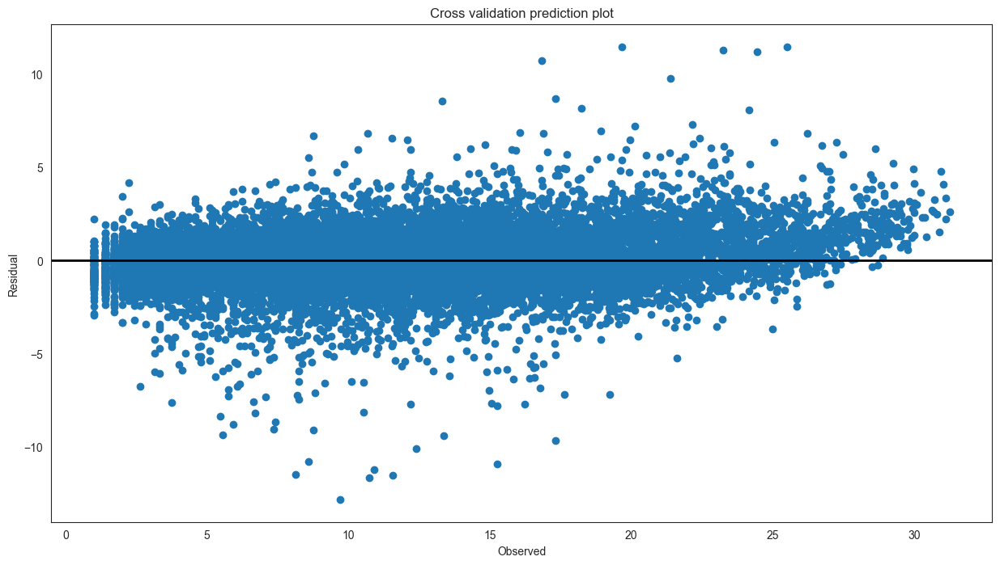

In [253]:
#Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train,y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### R-squared and mean squared error scores

In [254]:
#R-squared scores
nn_r2_scores = cross_val_score(mlp_model, X_train_scaled, y_train, cv=3)
print('R-squared scores :',np.average(nn_r2_scores))

C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


R-squared scores : 0.9468149868050508


C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


#### Model performance on test dataset

In [255]:
#predict the model
mlp_pred = mlp_model.predict(X_test_scaled)
mlp_pred

array([21.09078261,  8.75810614,  3.89335204, ...,  8.40092159,
       19.10583549, 16.64165332])

#### Root mean squared error and mean absolute error

In [256]:
#Root mean square error
nn_rmse = math.sqrt(mean_squared_error(y_test,mlp_pred))
print('Root mean square error :',nn_rmse)

#Mean absolute error
nn_mae = mean_absolute_error(y_test,mlp_pred)
print('Mean absolute error :',nn_mae)

Root mean square error : 1.4496397812518567
Mean absolute error : 1.0505142029224095


#### Residual plot

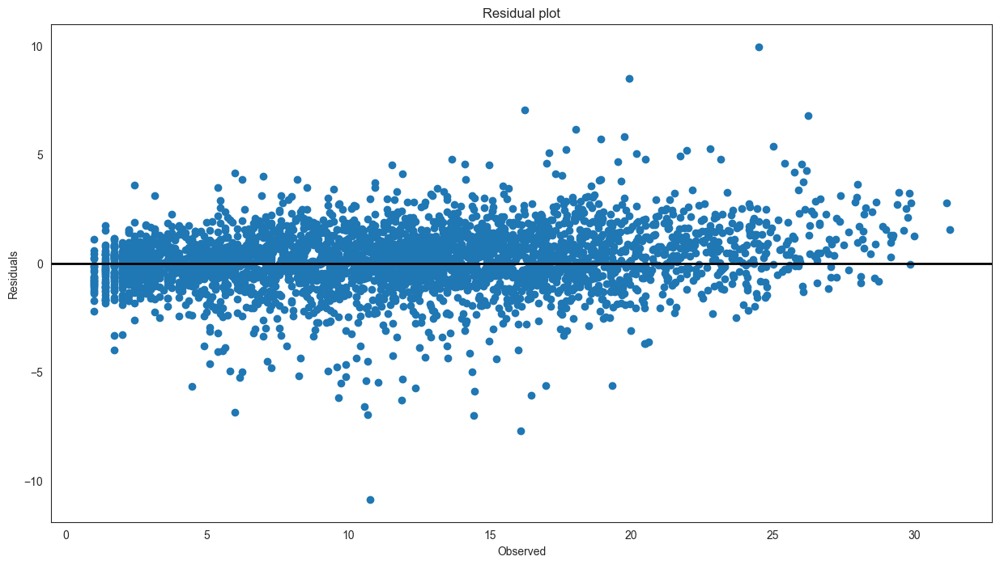

In [257]:
#Residual scatter plot
fig, ax = plt.subplots(figsize=(15,8))
residuals=y_test-mlp_pred
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.set_title('Residual plot')
plt.show()

### Ridge Regression

In [258]:
from sklearn.linear_model import Ridge

# Initialize the Ridge regression model
alpha = 0.1  # Regularization strength
ridge_model = Ridge(alpha=alpha, random_state=42)

In [259]:
# Fit the model on the scaled training data
ridge_model.fit(X_train_scaled, y_train)

Ridge(alpha=0.1, random_state=42)

In [260]:
# Predict on the scaled test data
y_pred = ridge_model.predict(X_test_scaled)

In [261]:
# Evaluate the model
ridge_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", ridge_mse)

Mean Squared Error: 23.337794007207115


#### Cross validation prediction

In [262]:
#Cross validation prediction
predict = cross_val_predict(ridge_model,X_train_scaled,y_train,cv=3)
predict

array([ 6.61172226, 15.69466863,  5.77241345, ..., 15.85107751,
        4.74047367, 11.78021759])

#### Cross validation prediction plot

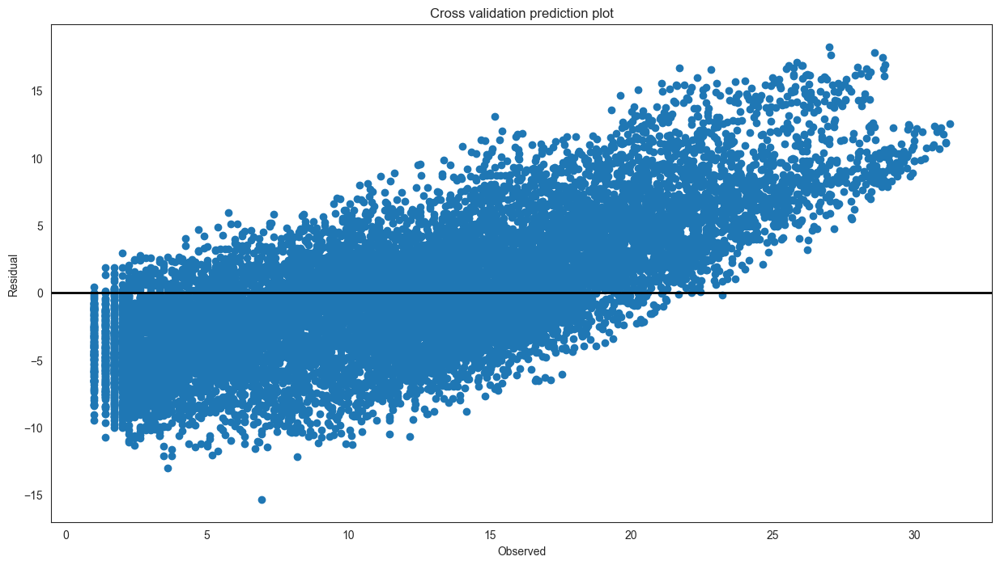

In [263]:
#Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train,y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### R-squared and mean squared error scores

In [264]:
#R-squared scores
ridge_r2_scores = cross_val_score(ridge_model, X_train_scaled, y_train, cv=3)
print('R-squared scores :',np.average(ridge_r2_scores))

R-squared scores : 0.4659523555102975


#### Model performance on test dataset

In [265]:
#predict the model
ridge_pred=ridge_model.predict(X_test_scaled)
ridge_pred

array([21.56099987, 13.73414888,  5.71709858, ...,  6.62230657,
       12.48987924, 13.5417278 ])

#### Root mean squared error and mean absolute error

In [266]:
#Root mean square error
ridge_rmse = math.sqrt(mean_squared_error(y_test,ridge_pred))
print('Root mean square error :',ridge_rmse)

#Mean absolute error
ridge_mae = mean_absolute_error(y_test,ridge_pred)
print('Mean absolute error :',ridge_mae)

Root mean square error : 4.830920616943225
Mean absolute error : 3.8518270899797686


#### Residual plot

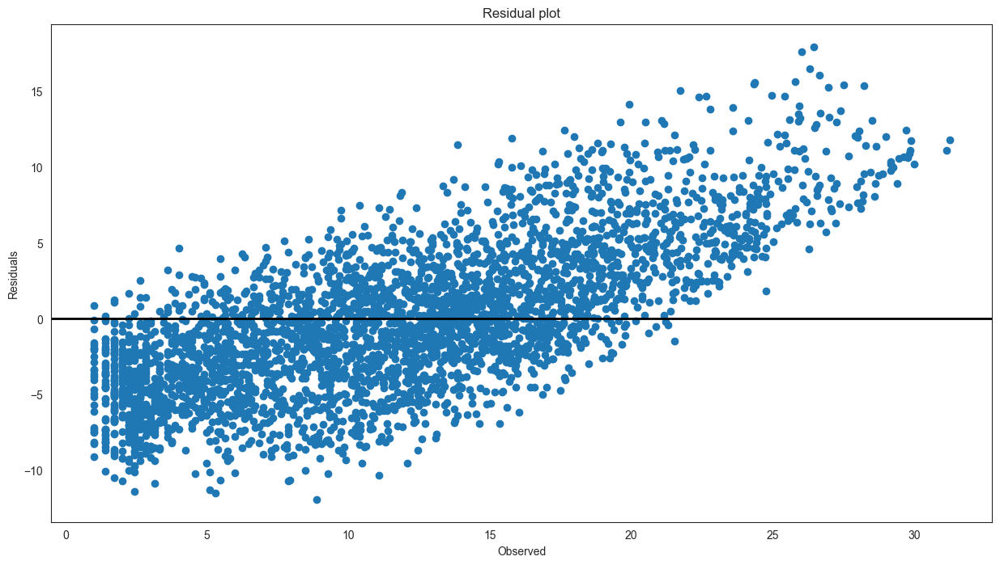

In [267]:
#Residual scatter plot
fig, ax = plt.subplots(figsize=(15,8))
residuals=y_test-ridge_pred
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.set_title('Residual plot')
plt.show()

### Lasso Regression

In [268]:
from sklearn.linear_model import Lasso

# Initialize the Lasso regression model
alpha = 0.1  # Regularization strength
lasso_model = Lasso(alpha=alpha, random_state=42)

In [269]:
# Fit the model on the scaled training data
lasso_model.fit(X_train_scaled, y_train)

Lasso(alpha=0.1, random_state=42)

In [270]:
# Predict on the scaled test data
y_pred = lasso_model.predict(X_test_scaled)

In [271]:
# Evaluate the model
lasso_mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", lasso_mse)

Mean Squared Error: 23.413406345868275


#### Cross validation prediction

In [272]:
#Cross validation prediction
predict = cross_val_predict(lasso_model,X_train_scaled,y_train,cv=3)
predict

array([ 6.82237187, 15.49400239,  5.70278446, ..., 15.67043708,
        4.86374893, 11.37890302])

#### Cross validation prediction plot

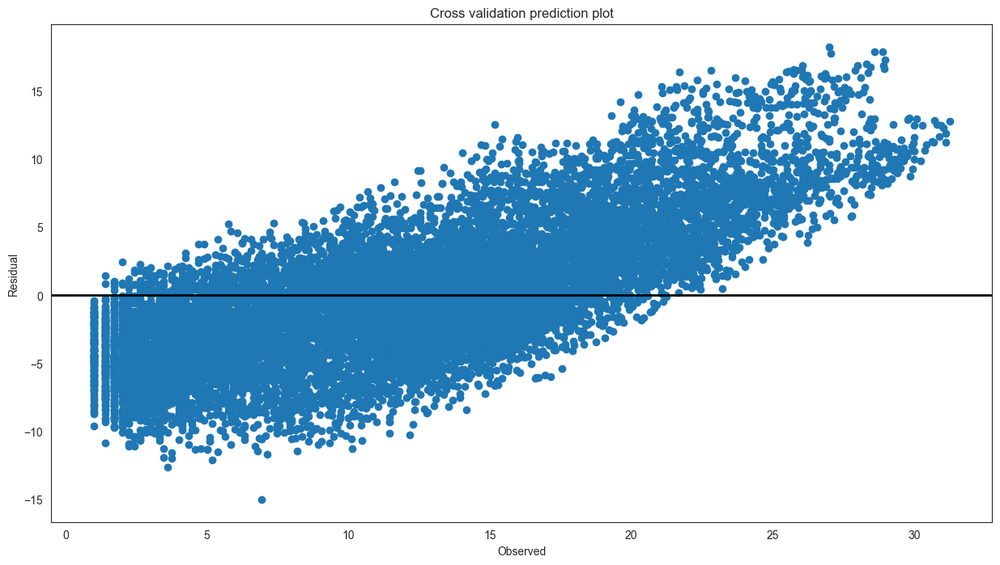

In [273]:
#Cross validation prediction plot
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_train,y_train-predict)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

#### R-squared and mean squared error scores

In [274]:
#R-squared scores
lasso_r2_scores = cross_val_score(lasso_model, X_train_scaled, y_train, cv=3)
print('R-squared scores :',np.average(lasso_r2_scores))

R-squared scores : 0.4638235304467213


#### Model performance on test dataset

In [275]:
#predict the model
lasso_pred=lasso_model.predict(X_test_scaled)
lasso_pred

array([21.36895972, 13.9280899 ,  5.63029821, ...,  6.85723295,
       12.28019695, 13.49700851])

#### Root mean squared error and mean absolute error

In [276]:
#Root mean square error
lasso_rmse = math.sqrt(mean_squared_error(y_test,lasso_pred))
print('Root mean square error :',lasso_rmse)

#Mean absolute error
lasso_mae = mean_absolute_error(y_test,lasso_pred)
print('Mean absolute error :',lasso_mae)

Root mean square error : 4.838740161020043
Mean absolute error : 3.8621707686024163


#### Residual plot

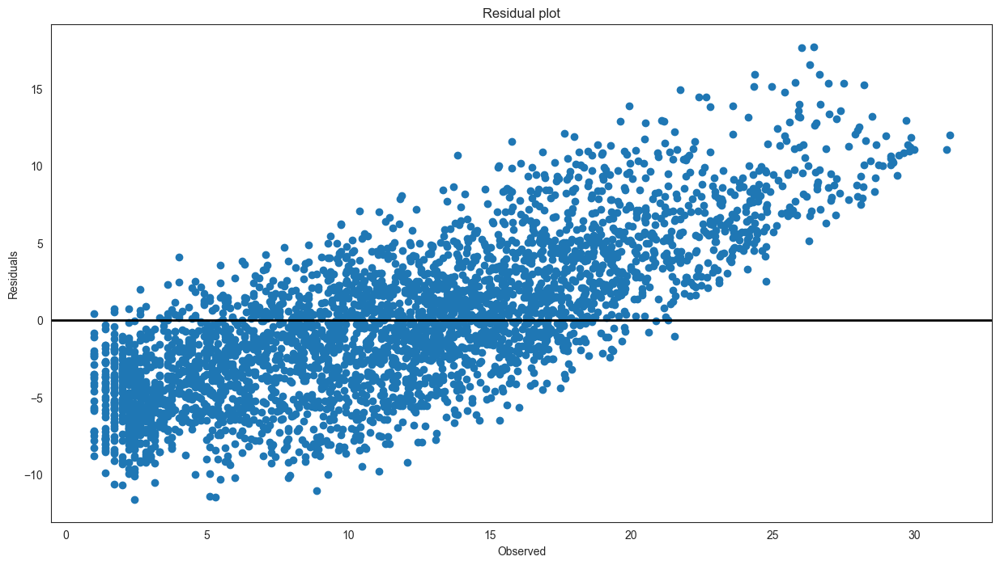

In [277]:
#Residual scatter plot
fig, ax = plt.subplots(figsize=(15,8))
residuals=y_test-lasso_pred
ax.scatter(y_test, residuals)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residuals')
ax.set_title('Residual plot')
plt.show()

In [278]:
#Comparing the results 

Evaluation = {"Models":pd.Series(["Linear Regression","Decision Tree","Random Forest","Gradient Boosting","KNN"\
                                  ,"Ridge Regression","Lasso Regression","Neural Network"]),\
        "Test_RMSE_Values":pd.Series([lr_rmse,dtr_rmse,rf_rmse,gb_rmse,knn_rmse,ridge_rmse,lasso_rmse,nn_rmse]),\
             "R2 values":pd.Series([np.average(lr_r2_scores),np.average(dtr_r2_scores),np.average(rf_r2_scores),np.average(gb_r2_scores),np.average(knn_r2_scores),np.average(ridge_r2_scores),np.average(lasso_r2_scores),np.average(nn_r2_scores)])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['Test_RMSE_Values'], inplace=True, ignore_index=True)
table_evaluation

,Models,Test_RMSE_Values,R2 values
0,Random Forest,1.443368,0.947231
1,Neural Network,1.449640,0.946815
2,KNN,1.743076,0.911136
3,Gradient Boosting,2.055204,0.892380
4,Decision Tree,2.076733,0.897501
5,Ridge Regression,4.830921,0.465952
6,Linear Regression,4.830921,0.465952
7,Lasso Regression,4.838740,0.463824


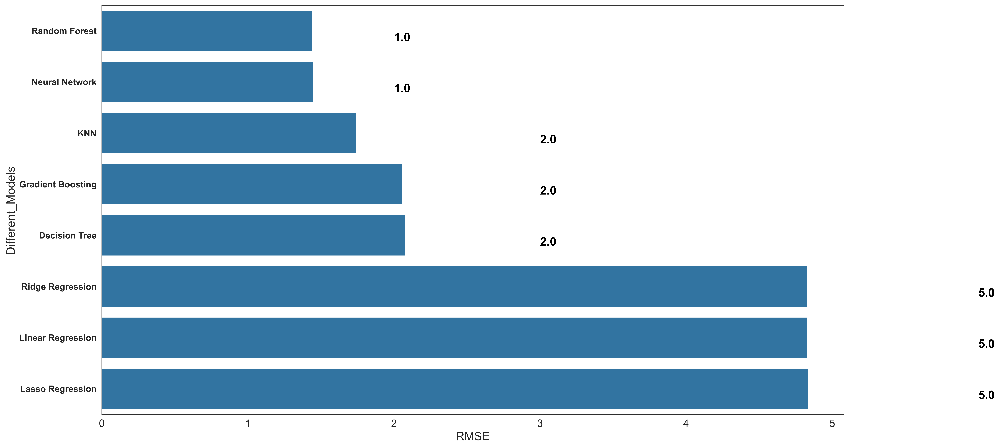

In [279]:
f, axe = plt.subplots(1,1, figsize=(18,10), dpi=500)
sns.barplot(x='Test_RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('RMSE', size=16)
axe.set_ylabel('Different_Models', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.Test_RMSE_Values.values,0)):
    axe.text(v + 1, i + .20, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

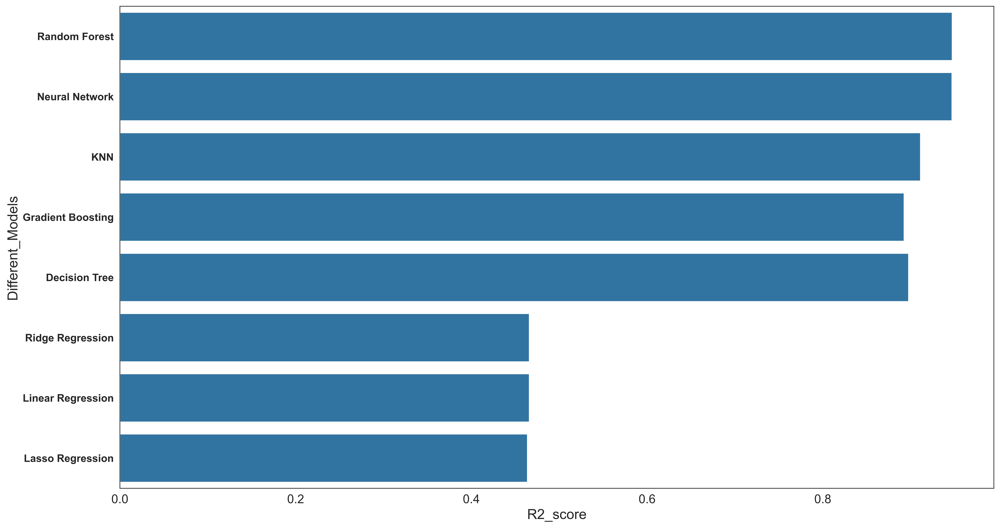

In [280]:
f, axe = plt.subplots(1,1, figsize=(18,10), dpi=500)
sns.barplot(x='R2 values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('R2_score', size=16)
axe.set_ylabel('Different_Models', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)
plt.show()

__Conclusion:__ 

We are going to use Random Forest for this now. Beacuse is has the lowest RMSE value and highest R2 (r-square) value.

# Hyperparameter Tuning for Random Forest

In [283]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['log2', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [284]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['log2', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [285]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'log2',
 'max_depth': 50,
 'bootstrap': False}

In [286]:
best_random = rf_random.best_estimator_

In [287]:
pred = best_random.predict(X_test)

In [288]:
#Root mean square error
br_rmse = math.sqrt(mean_squared_error(y_test,pred))
print('Root mean square error :',br_rmse)

#Mean absolute error
br_mae = mean_absolute_error(y_test,pred)
print('Mean absolute error :',br_mae)

Root mean square error : 1.6070402470527438
Mean absolute error : 1.1589865673970166


In [289]:
from sklearn.metrics import r2_score

In [290]:
r2_score(y_test, pred)

0.9408082799270188

# For Deployment (pre-requisite)

In [291]:
dmod.describe()

,yr,mnth,hr,weekday,atemp,hum,windspeed,cnt,season,workingday,weathersit
count,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,2011.502561,6.537775,11.546752,3.003683,0.475790,0.627192,0.190087,12.015851,1.472985,0.682836,0.425111
std,0.500008,3.438776,6.914405,2.005771,0.171831,0.192908,0.122304,6.714537,1.120234,0.465385,0.639337
min,2011.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2011.000000,4.000000,6.000000,1.000000,0.333300,0.480000,0.104500,6.324555,0.000000,0.000000,0.000000
50%,2012.000000,7.000000,12.000000,3.000000,0.484800,0.630000,0.194000,11.916375,1.000000,1.000000,0.000000
75%,2012.000000,10.000000,18.000000,5.000000,0.621200,0.780000,0.253700,16.763055,2.000000,1.000000,1.000000
max,2012.000000,12.000000,23.000000,6.000000,1.000000,1.000000,0.850700,31.256999,3.000000,1.000000,3.000000


In [292]:
dmod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          17379 non-null  int64  
 1   mnth        17379 non-null  int64  
 2   hr          17379 non-null  int64  
 3   weekday     17379 non-null  int64  
 4   atemp       17379 non-null  float64
 5   hum         17379 non-null  float64
 6   windspeed   17379 non-null  float64
 7   cnt         17379 non-null  float64
 8   season      17379 non-null  int64  
 9   workingday  17379 non-null  int64  
 10  weathersit  17379 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 1.5 MB


<Axes: xlabel='weekday', ylabel='count'>

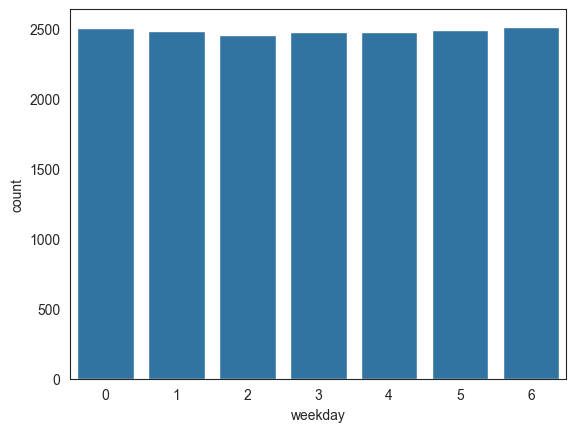

In [293]:
sns.countplot(x = 'weekday', data = dmod)

In [294]:
model = RandomForestRegressor(**rf_random.best_params_)

In [295]:
model.fit(X_train, y_train)

RandomForestRegressor(bootstrap=False, max_depth=50, max_features='log2',
                      n_estimators=1000)

In [296]:
y_pred = model.predict(X_test)

In [297]:
r2_score(y_test, y_pred)

0.9418994309192241

In [298]:
import pickle

In [299]:
with open('model_pickle', 'wb') as f:
    pickle.dump(model, f)

In [300]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13903 entries, 335 to 15795
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          13903 non-null  int64  
 1   mnth        13903 non-null  int64  
 2   hr          13903 non-null  int64  
 3   weekday     13903 non-null  int64  
 4   atemp       13903 non-null  float64
 5   hum         13903 non-null  float64
 6   windspeed   13903 non-null  float64
 7   season      13903 non-null  int64  
 8   workingday  13903 non-null  int64  
 9   weathersit  13903 non-null  int64  
dtypes: float64(3), int64(7)
memory usage: 1.2 MB


In [302]:
model.predict([[2024,1,0,2,0.43,0.34,0.34,2,1,0]])

C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


array([5.40437322])

In [303]:
import gzip

# Save the model with gzip compression
with gzip.open('model_comp.pkl.gz', 'wb') as file:
    pickle.dump(model, file)

In [304]:
import bz2

# Save the model with bz2 compression
with bz2.open('model_bz2.pkl.bz2', 'wb') as file:
    pickle.dump(model, file)